# Batch correction using conditional flow matching (CFM) on TARGET2 without source 9

In [ ]:
%load_ext autoreload
%autoreload 2
from google.colab import drive
import os
gdrive_path='/content/drive/MyDrive/'
drive.mount('/content/drive', force_remount=True)
os.chdir(gdrive_path)

Mounted at /content/drive


In [ ]:
!pip install scanpy
!pip install scprep
!pip install matplotlib numpy scanpy torch torchsde torchdyn tqdm torchcfm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.1/122.1 kB 15.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 11.9 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=47018f22486643e93e72e51215b05f3c48c5648a808076d5a07b2672f2a8bc93
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=a719b7848112c1beb51810738d472f5ffecb82c68a91cb76f7f3376a05716886
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import random

import scanpy as sc
import torch
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from torchdyn.core import NeuralODE
from torchcfm.conditional_flow_matching import *
from torchcfm.models import MLP
from torchcfm.utils import torch_wrapper
from sklearn.model_selection import GridSearchCV

# Suppress warnings
import warnings
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", FutureWarning)

# Autoreload extension
%load_ext autoreload
%autoreload 2

# Set up saving directory
savedir = "/content/drive/MyDrive/datasets/models/"
os.makedirs(savedir, exist_ok=True)

# Set Scanpy figure parameters
sc.settings.set_figure_params(dpi=100, frameon=False)
sc.set_figure_params(dpi=100)
sc.set_figure_params(figsize=(6, 6))
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (6, 6)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## OT-CFM

Idea:

1. Compute OT transition matrix (TM) between batches/sources
2. Flatten matrix and renormalize, then resample batches from this matrix proportional to the probabilities we had in TM. This results in batches where the i-th row of each batch, is a sample from the coupling. Now the batches are tendentially similar.
3. Connect those via straight line (linear interpolation) and then approximate the step. The step has, given 2 samples, a closed form and a NN takes the in between and approximates this closed form.

In [ ]:
def load_adata(file_path):
    adata = sc.read_h5ad(file_path)
    adata = adata[adata.obs["Metadata_Source"] != "source_9"].copy()  # Kick out source_9
    return adata

In [ ]:
def create_ot_cfm_model(adata, use_pca = True, time_varying=True, w=64):
    #check dim
    if use_pca:
      dim = adata.obsm['X_pca'].shape[1]
    else:
      dim = adata.X.shape[1]
    return MLP(dim=dim, time_varying=time_varying, w=w)

In [ ]:
def create_ot_cfm_optimizer(model, lr=1e-4):
    return torch.optim.Adam(model.parameters(), lr)

In [ ]:
class AnnDataSubsetDataset(Dataset):
    def __init__(self, adata, source1, source2, use_pca=True):
        self.adata = adata
        self.source1 = source1
        self.source2 = source2
        self.use_pca = use_pca

        self.source1_data = self.adata[self.adata.obs["Metadata_Source"] == source1]
        self.source2_data = self.adata[self.adata.obs["Metadata_Source"] == source2]

        if use_pca:
            self.X_key = "X_pca"
            self.X1 = self.source1_data.obsm["X_pca"]
            self.X2 = self.source2_data.obsm["X_pca"]
        else:
            self.X_key = "X"
            self.X1 = self.source1_data.X
            self.X2 = self.source2_data.X

    def __len__(self):
        return min(len(self.source1_data), len(self.source2_data))

    def __getitem__(self, idx):
        idx1 = idx if len(self.source1_data) < len(self.source2_data) else np.random.randint(0, len(self.source1_data))
        idx2 =  idx if len(self.source1_data) > len(self.source2_data) else np.random.randint(0, len(self.source2_data))
        x1 = torch.tensor(self.X1[idx1], dtype=torch.float32)
        x2 = torch.tensor(self.X2[idx2], dtype=torch.float32)
        return {"x1": x1, "x2": x2}

class SingleSourceDataLoader(Dataset):
    def __init__(self, adata, source, use_pca=True):
        self.adata = adata
        self.source = source
        self.use_pca = use_pca

        self.source_data = self.adata[self.adata.obs["Metadata_Source"] == source]
        self.moas = self.source_data.obs.Metadata_moa
        self.cpds = self.source_data.obs.Metadata_JCP2022
        self.microscope = self.source_data.obs.Metadata_Microscope_Name

        if use_pca:
            self.X_key = "X_pca"
            self.X = self.source_data.obsm["X_pca"]

        else:
            self.X_key = "X"
            self.X = self.source_data.X

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        x = torch.tensor(self.X[idx], dtype=torch.float32)
        moa = self.moas[idx]
        cpd = self.cpds[idx]
        microscope = self.microscope[idx]

        # Replace NaN with a default value "NA"
        moa = moa if not pd.isna(moa) else "NA"
        cpd = cpd if not pd.isna(cpd) else "NA"
        microscope = microscope if not pd.isna(microscope) else "NA"

        return {"x": x, "moa": moa, "cpd": cpd, "microscope" : microscope}

In [ ]:
def create_training_dataloader(adata, source1, source2, batch_size=64, use_pca=True):
    dataset = AnnDataSubsetDataset(adata, source1, source2, use_pca)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return dataloader

In [ ]:
def create_dataloader(adata, source, batch_size=64, use_pca=True):
    dataset = SingleSourceDataLoader(adata, source, use_pca)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return dataloader

Dataloader to which we pass the whole anndata and two sources, which:
* subsets the anndata to the two sources
* from Dataset it returns as batch dict(X_1: samples from first source, X_2: samples from second source)
* give opportunity to use both X_pca and X

Thus, for each batch in Dataloader, return tuple with samples from one source and samples from another source, then get it into get_batch().

In [ ]:
def get_batch(FM, x1, x2, return_noise=False):
    t, xt, ut = FM.sample_location_and_conditional_flow(x1, x2, return_noise=return_noise)
    return t, xt, ut

Explanantion: t takes batches from both sides an gets in between point (interpolation point) which is x_t at t and u_t is the step which is the velocity of the path from one point to another point at a specific timepoint.

In [ ]:
def train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=10000, plot_loss=False):
    losses = []

    for epoch in tqdm(range(epochs)):
        epoch_loss = 0.0

        for batch in dataloader:
            x1 = batch["x1"]
            x2 = batch["x2"]

            ot_cfm_optimizer.zero_grad()
            t, xt, ut = get_batch(FM, x1, x2)
            vt = ot_cfm_model(torch.cat([xt, t[:, None]], dim=-1))
            loss = torch.mean((vt - ut) ** 2)
            loss.backward()
            ot_cfm_optimizer.step()

            epoch_loss += loss.item()

        losses.append(epoch_loss / len(dataloader))  # average loss per batch for the epoch

    if not plot_loss:
        #print the loss at each epoch
        print("\n")
        for epoch, loss in enumerate(losses, 1):
            print(f'Epoch {epoch}/{epochs}, Loss: {loss}')

    if plot_loss:
      #plot
      plt.plot(losses, label='Loss')
      plt.xlabel('Epoch')
      plt.ylabel('Loss')
      plt.title('Training Loss Curve')
      plt.show()

    return ot_cfm_model

In [ ]:
def save_ot_cfm_model(model, optimizer, filepath):
    torch.save({"model": model, "optimizer": optimizer}, filepath)

In [ ]:
# Load saved model
def load_ot_cfm_model(model, optimizer, filepath):
    checkpoint = torch.load(filepath)
    model.load_state_dict(checkpoint['model'].state_dict())
    optimizer.load_state_dict(checkpoint['optimizer'].state_dict())

In [ ]:
def transport(dataloader, ot_cfm_model, x1_label="source_3", device = "cpu", save_adata_path = None):
    node = NeuralODE(torch_wrapper(ot_cfm_model), solver="dopri5", sensitivity="adjoint")

    #annot = []
    X_combined = []
    annot_combined = pd.DataFrame()

    # Transport source1 to source2
    for batch in dataloader:
      x1 = batch["x"]
      moa = batch["moa"]
      cpd = batch["cpd"]
      microscope = batch["microscope"]


      with torch.no_grad():
          traj = node.trajectory(
              x1.float().to(device),
              t_span=torch.linspace(0, 1, 100),
          ).cpu()
      x1_transported = traj[-1].detach().numpy()
      del traj

      # Concatenate data for source1 along with transported source1
      X_combined.append(np.concatenate([x1_transported, x1], axis=0))

      # Create annotations for annData
      annot1 = {"Metadata_Source": f"{x1_label}_translated", "Metadata_moa" : moa, "Metadata_JCP2022" : cpd, "Metadata_Microscope_Name" : microscope}
      annot2 = {"Metadata_Source": x1_label , "Metadata_moa" : moa, "Metadata_JCP2022" : cpd, "Metadata_Microscope_Name" : microscope}
      annot_batch = pd.concat([pd.DataFrame(annot1), pd.DataFrame(annot2)], axis = 0)
      annot_combined = pd.concat([annot_combined, annot_batch], axis = 0)

    # Create an AnnData object
    X_combined = np.concatenate(X_combined, axis=0)
    full_adata = sc.AnnData(X=X_combined, obs=annot_combined)
    full_adata.obsm["X_pca"] = full_adata.X.copy()

    if save_adata_path:
      print("Writing translated adata to file...")
      full_adata.write(save_adata_path)

    return full_adata

For the 100 points from X_source2 = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].obsm["X_pca"][:100], it took a 100 steps and saved all the steps but we dont want all the steps, we only want the last one. [50 is just the dim]

Neural1ODE we give a trajectory and a set of points, then it will compute the steps for each point.

<b> What we did so far: </b>

We have source and target, in training we pick some batches from source and some batches from target, take straight line in between and learn velocity at some point t in the middle. Our neural network takes as input the point x_t and t. As soon as network is trained, the network learned how to approximate steps everywhere in between. Start from one observation from source, then initialize a Neural1ODE, which takes the model and using just the NN, it walks all the way to the target. For each time it discretizes the time in between, then takes steps using the NN. We then receive the real target and the transported source onto target part which we put together in an anndata and then do UMAP and other vizualizations, etc. to see if they correspond.

<b> How is this different from TranslationProblem from Moscot: </b>

OT-CFM is now parametrized whereas in Moscot it wasnt. In Moscot we were learning the transition matrix but this doesnt allow for us to take a new point and transport it to other side but with OT-CFM we can allow for new points coming in and transporting them and it also scales very well and is thus faster then Moscot.

#### Target2_moa unintegrated investigation

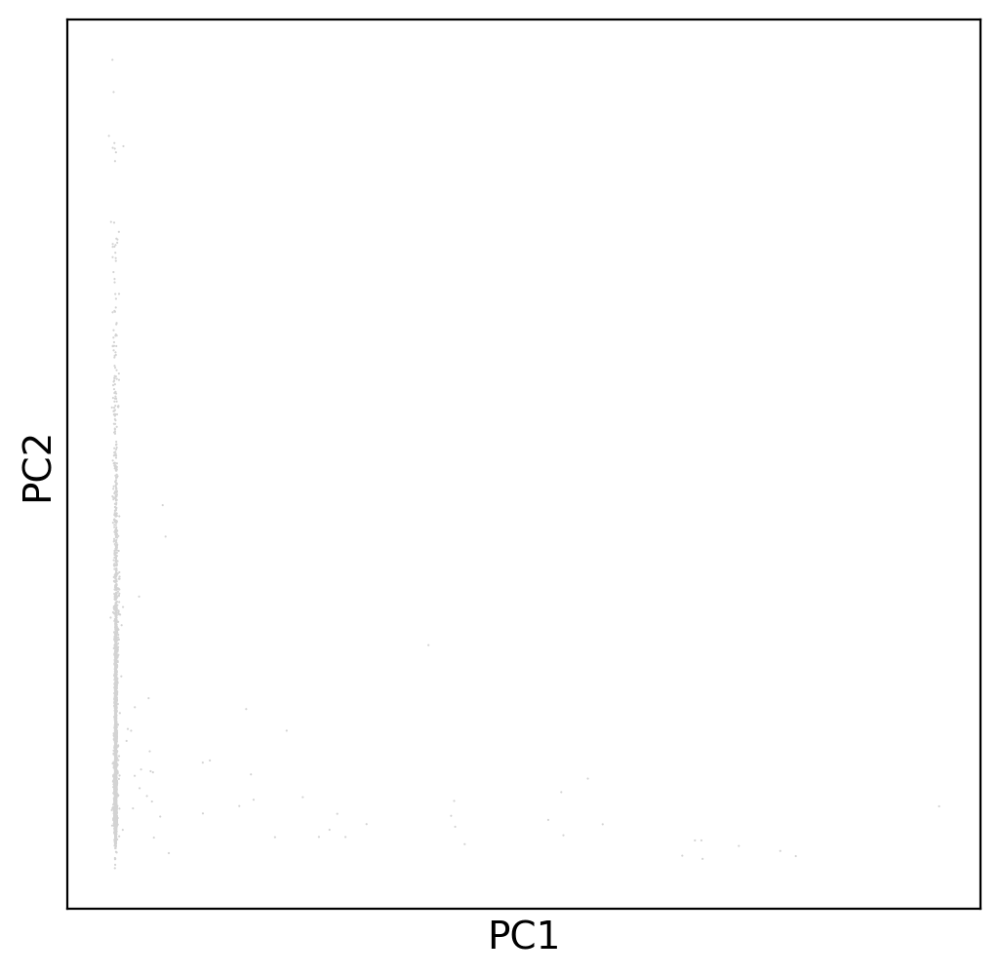

Outliers from each source:
source_8     47948
source_10     2666
source_2        10
source_11        8
source_13        6
source_3         2
source_4         0
source_5         0
source_6         0
source_7         0
Name: Metadata_Source, dtype: int64


In [ ]:
# PCA
sc.tl.pca(target2_moa)
sc.pl.pca(target2_moa)

# Get the PCs contributing the most t variance
variance_ratio = target2_moa.uns['pca']['variance_ratio']
cumulative_variance_ratio = np.cumsum(variance_ratio)
num_pcs = np.argmax(cumulative_variance_ratio > 0.95) + 1  # Number of PCs explaining 95% of the variance

# Flatten the PCA matrix to one dimension
pca_flat = target2_moa.obsm['X_pca'][:, :num_pcs].flatten()

# Identify outliers based on PCA
outliers_mask = pca_flat[~np.isnan(pca_flat)]
outliers = target2_moa.obs.iloc[outliers_mask]

# Determine the source of outliers using metadata information
outliers_sources = outliers['Metadata_Source'].value_counts()

# Print information about outliers and their sources
print("Outliers from each source:")
print(outliers_sources)

### Run 1: Transport source 3 into source 2 and visualize result with use_pca = True for 1000 epochs

In [ ]:
target2_moa = load_adata("/content/drive/MyDrive/datasets/Tim_target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")

In [ ]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

ot_cfm_model = create_ot_cfm_model(adata=target2_moa, use_pca=True)
ot_cfm_optimizer = create_ot_cfm_optimizer(ot_cfm_model)
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=0.1)

100%|██████████| 1000/1000 [05:58<00:00,  2.79it/s]


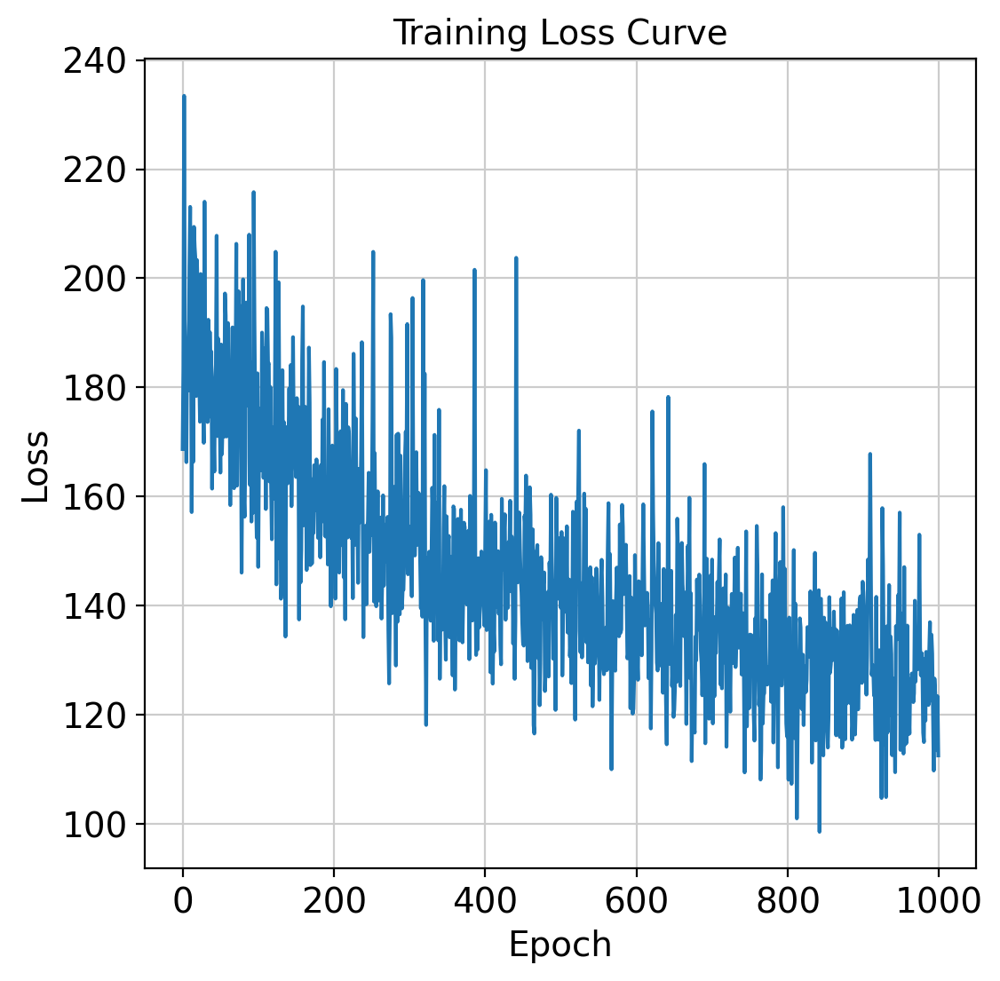

In [ ]:
dataloader = create_dataloader(target2_moa, "source_3", "source_2", batch_size=64, use_pca=True)
trained_ot_cfm_model = train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=1000, plot_loss=True)
save_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/ot_cfm_single_cell.pt")

In [ ]:
full_adata = transport(dataloader, ot_cfm_model, x1_label="source_3", x2_label="source_2", device = "cpu", save_adata_path = None)
full_adata

AnnData object with n_obs × n_vars = 11484 × 50
    obs: 'Metadata_Source'
    obsm: 'X_pca'

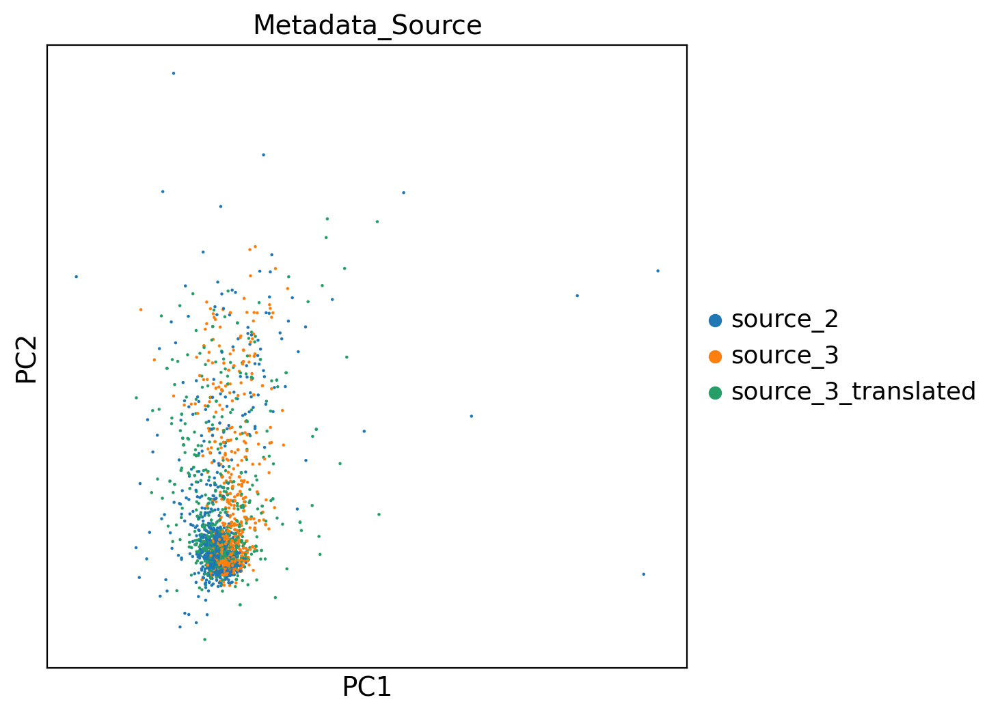

In [ ]:
sc.pl.pca(full_adata, color="Metadata_Source")

### Run 2: Transport source 11 into source 2 and visualize result with use_pca = False for 200 epochs

In [ ]:
target2_moa = load_target_data("/content/drive/MyDrive/datasets/Tim_target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")

In [ ]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

ot_cfm_model = create_ot_cfm_model(adata=target2_moa, use_pca=False)
ot_cfm_optimizer = create_ot_cfm_optimizer(ot_cfm_model)
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=0.1)

100%|██████████| 200/200 [01:02<00:00,  3.18it/s]


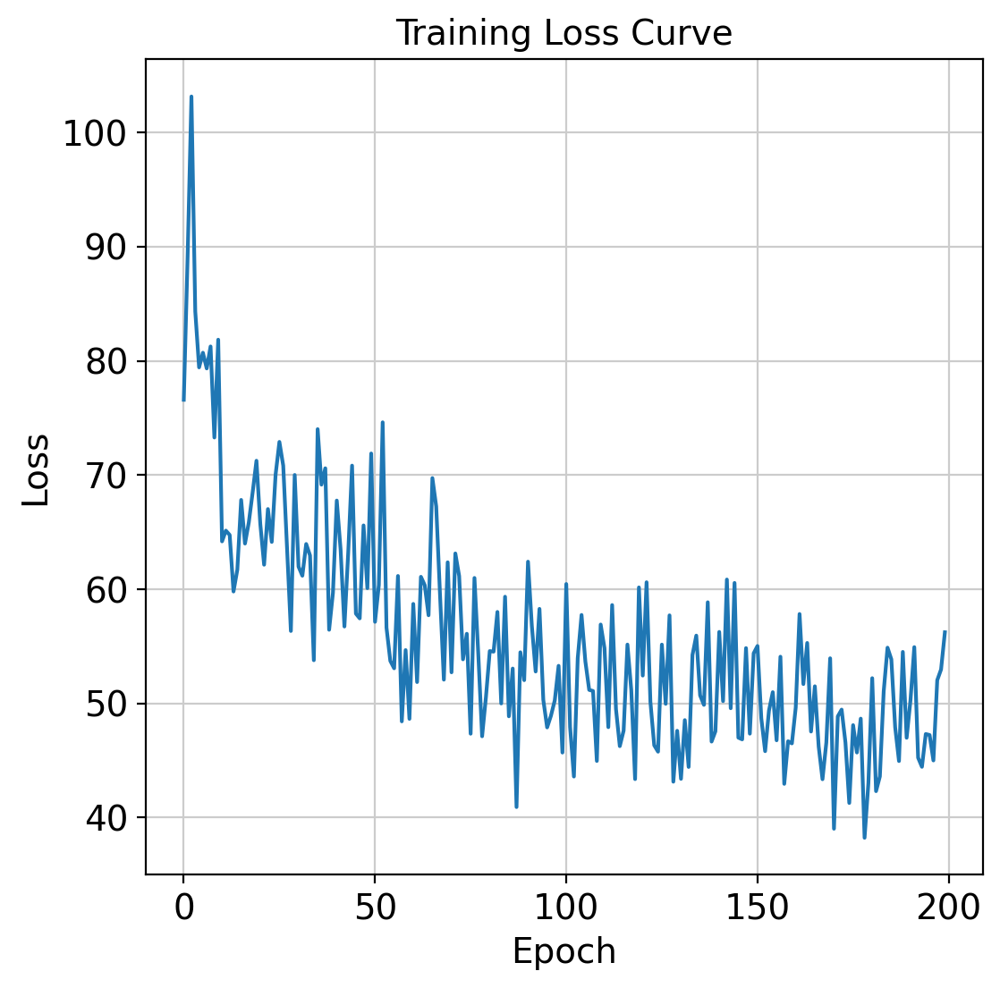

In [ ]:
dataloader = create_dataloader(target2_moa, "source_11", "source_2", batch_size=64, use_pca=False)
trained_ot_cfm_model = train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=200, plot_loss=True)
save_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/ot_cfm_single_cell.pt")

In [ ]:
full_adata = transport(dataloader, ot_cfm_model, x1_label="source_11", x2_label="source_2", device = "cpu", save_adata_path = None)
full_adata

AnnData object with n_obs × n_vars = 8052 × 591
    obs: 'Metadata_Source'
    obsm: 'X_pca'

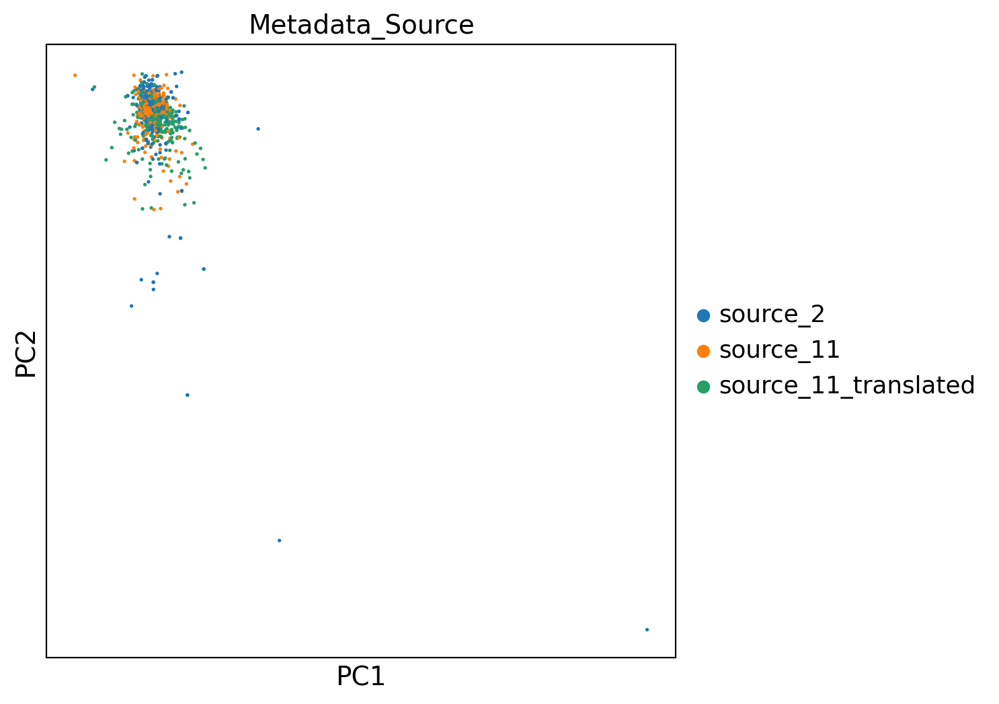

In [ ]:
sc.pl.pca(full_adata, color="Metadata_Source")

## Run 3: Transport iteratively all sources from target2_moa into source 2 and visualize result with use_pca = True for 200 epochs

In [ ]:
# Load target2_moa
target2_moa = load_adata("/content/drive/MyDrive/datasets/Tim_target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")

#setup
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

# init all stuff
ot_cfm_model = create_ot_cfm_model(adata=target2_moa, use_pca=True)
ot_cfm_optimizer = create_ot_cfm_optimizer(ot_cfm_model)
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=0.1)

100%|██████████| 200/200 [01:06<00:00,  2.99it/s]


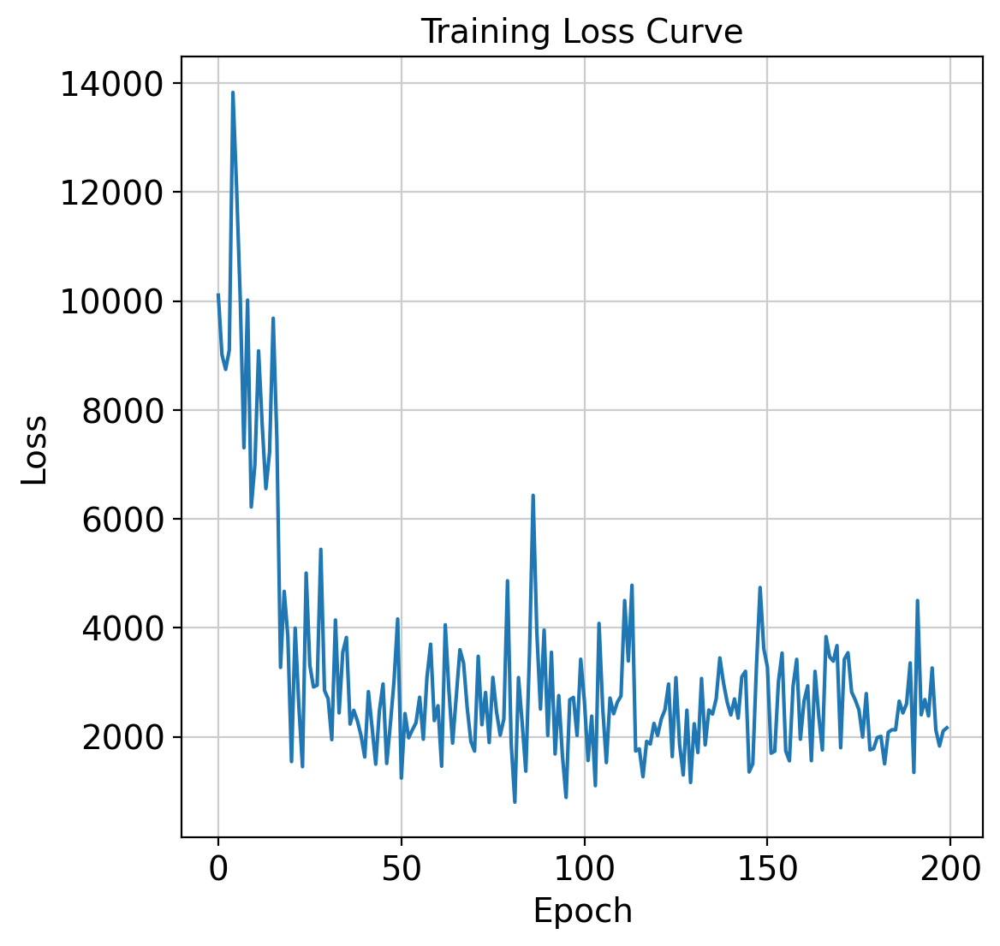

100%|██████████| 200/200 [01:03<00:00,  3.13it/s]


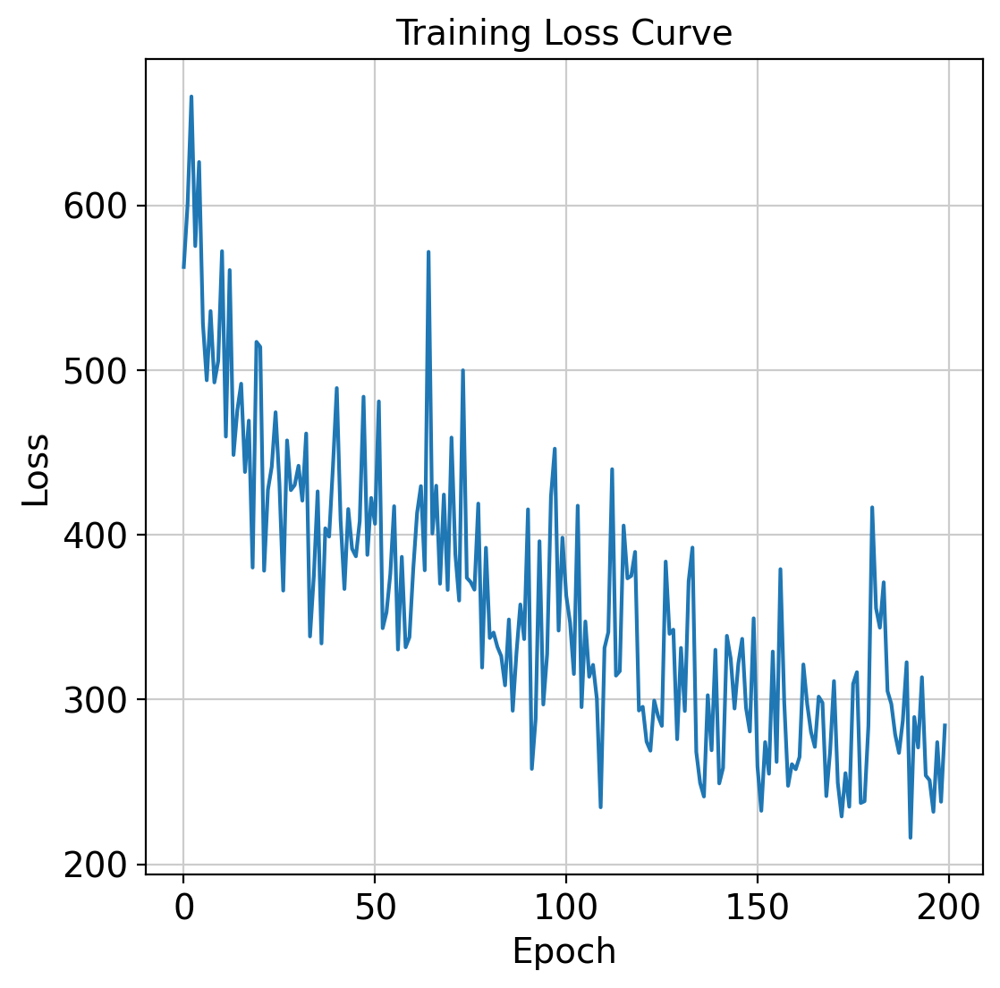

100%|██████████| 200/200 [00:59<00:00,  3.37it/s]


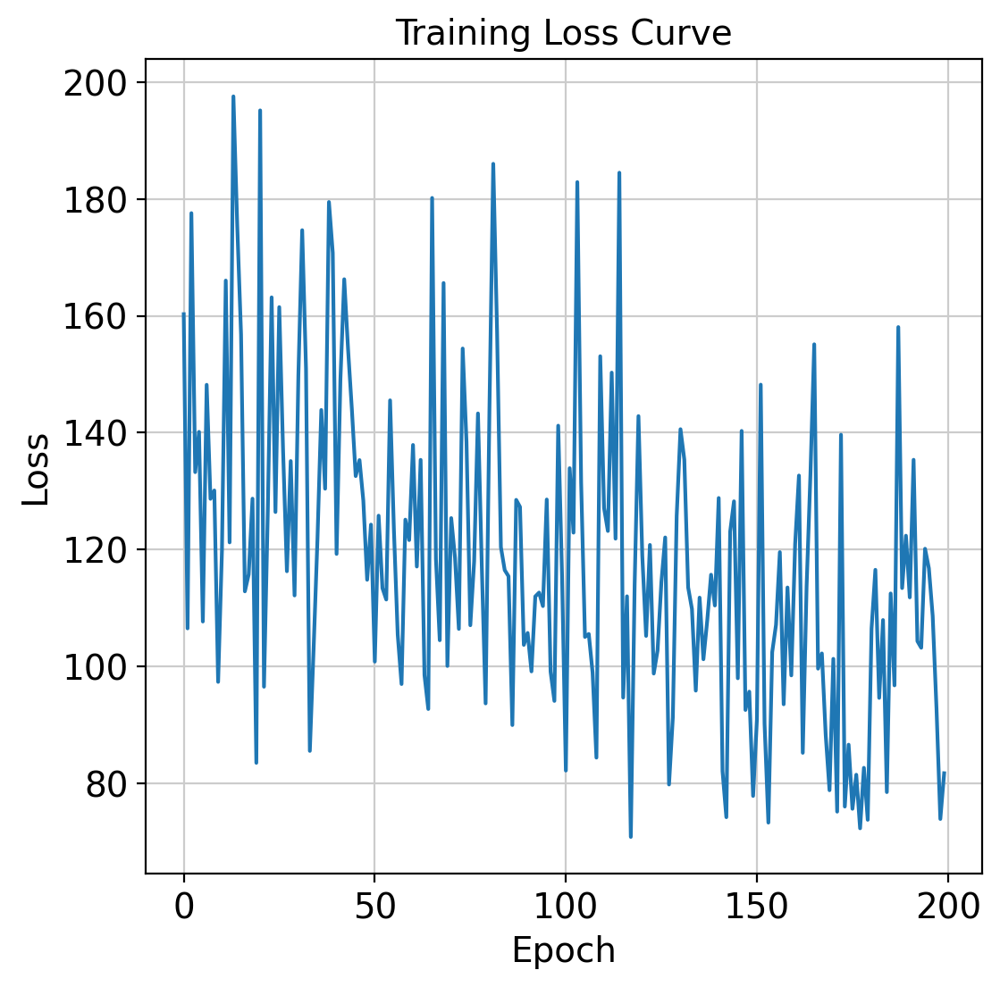

100%|██████████| 200/200 [01:29<00:00,  2.24it/s]


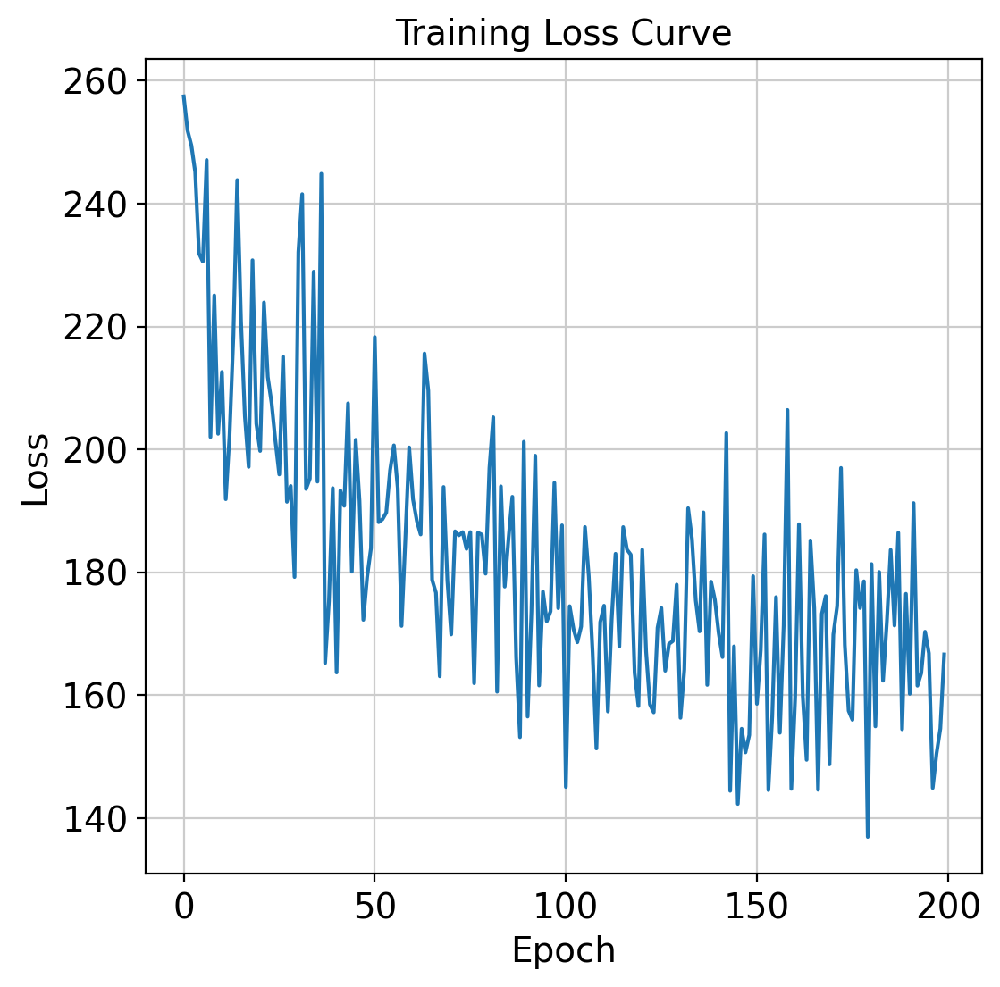

100%|██████████| 200/200 [01:27<00:00,  2.29it/s]


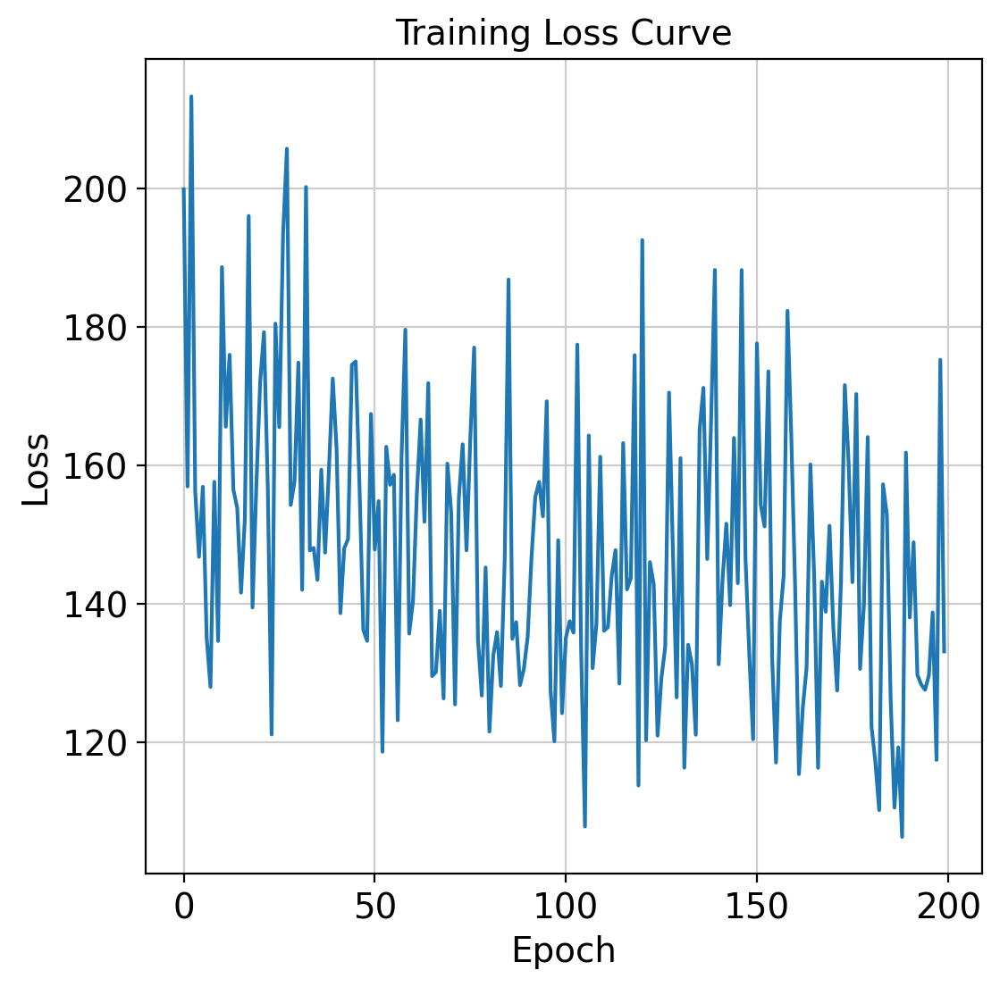

100%|██████████| 200/200 [01:34<00:00,  2.12it/s]


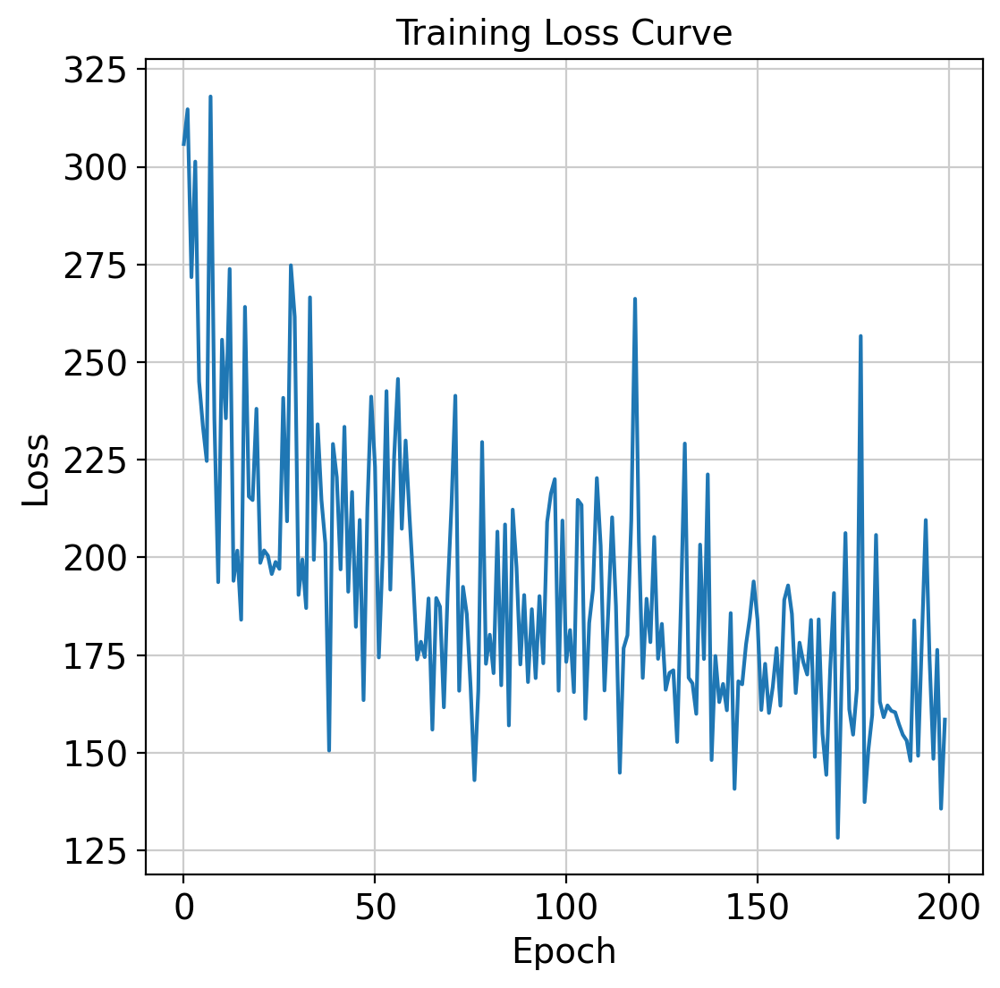

100%|██████████| 200/200 [01:26<00:00,  2.31it/s]


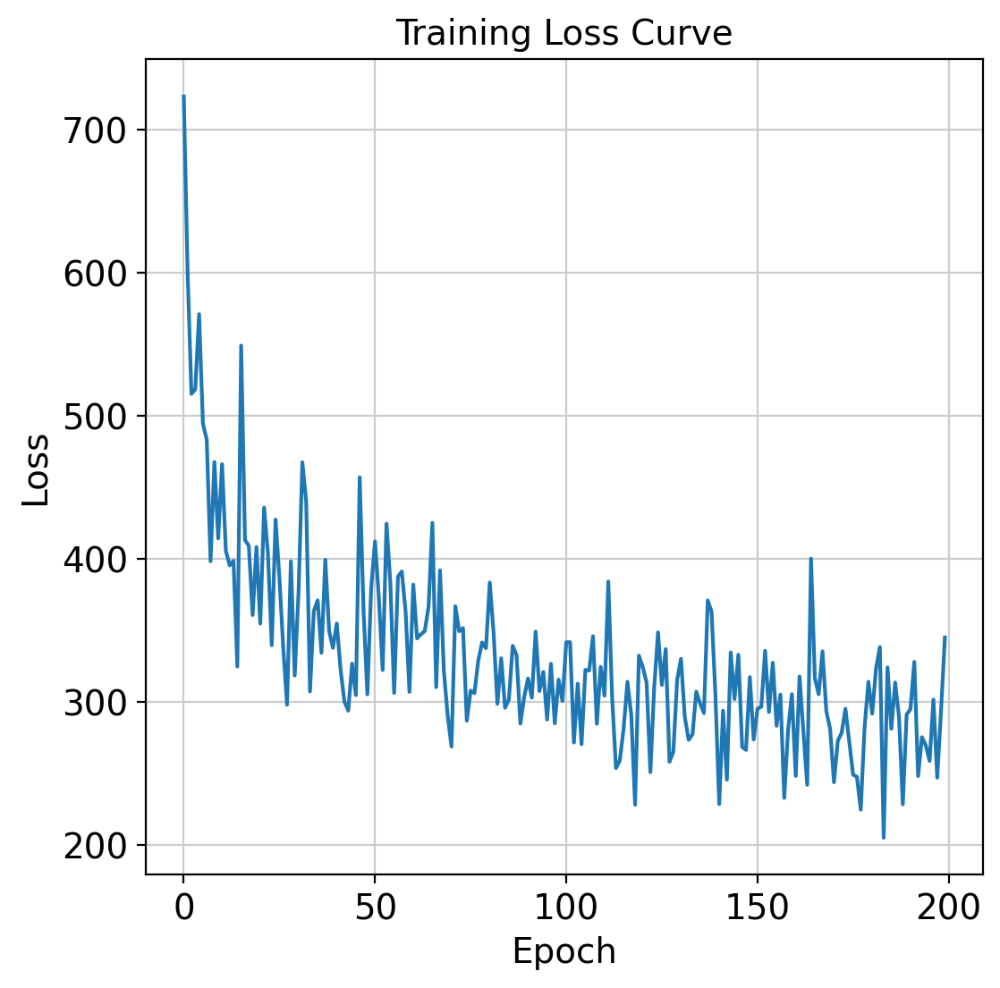

100%|██████████| 200/200 [01:03<00:00,  3.16it/s]


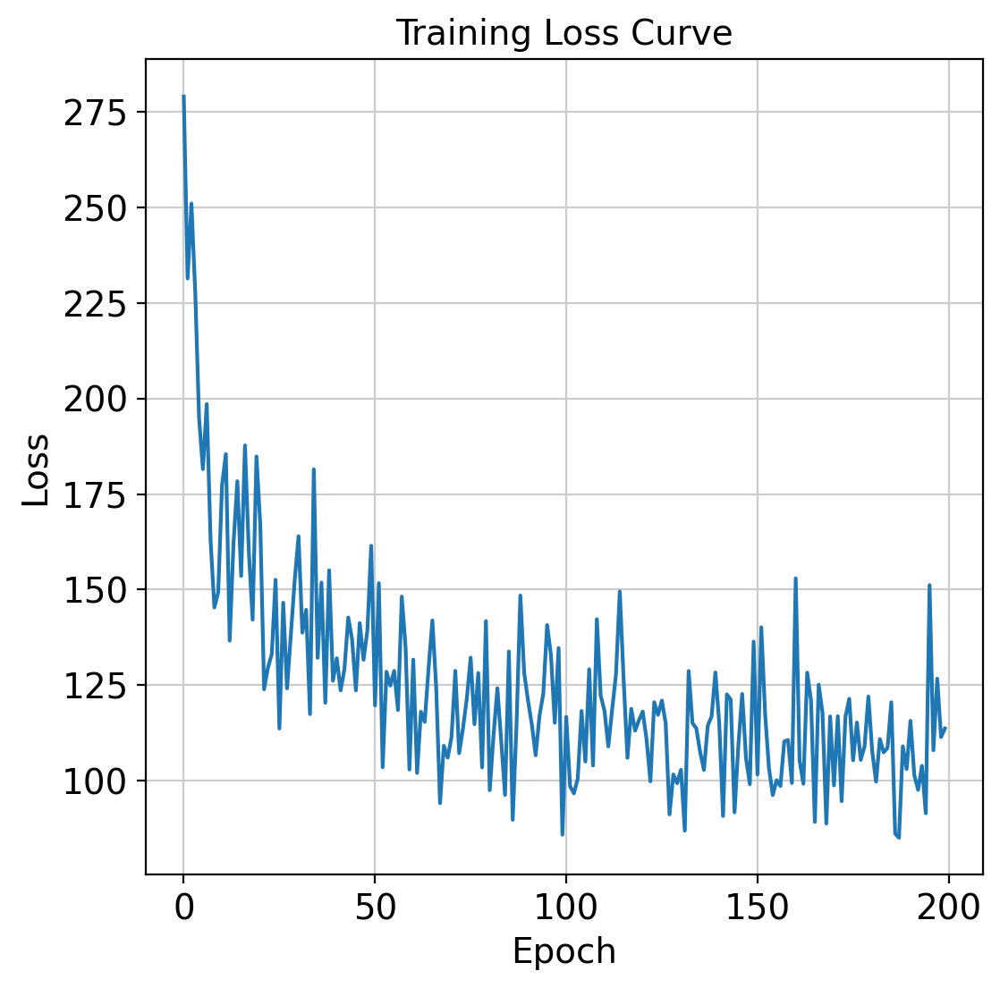

100%|██████████| 200/200 [00:38<00:00,  5.25it/s]


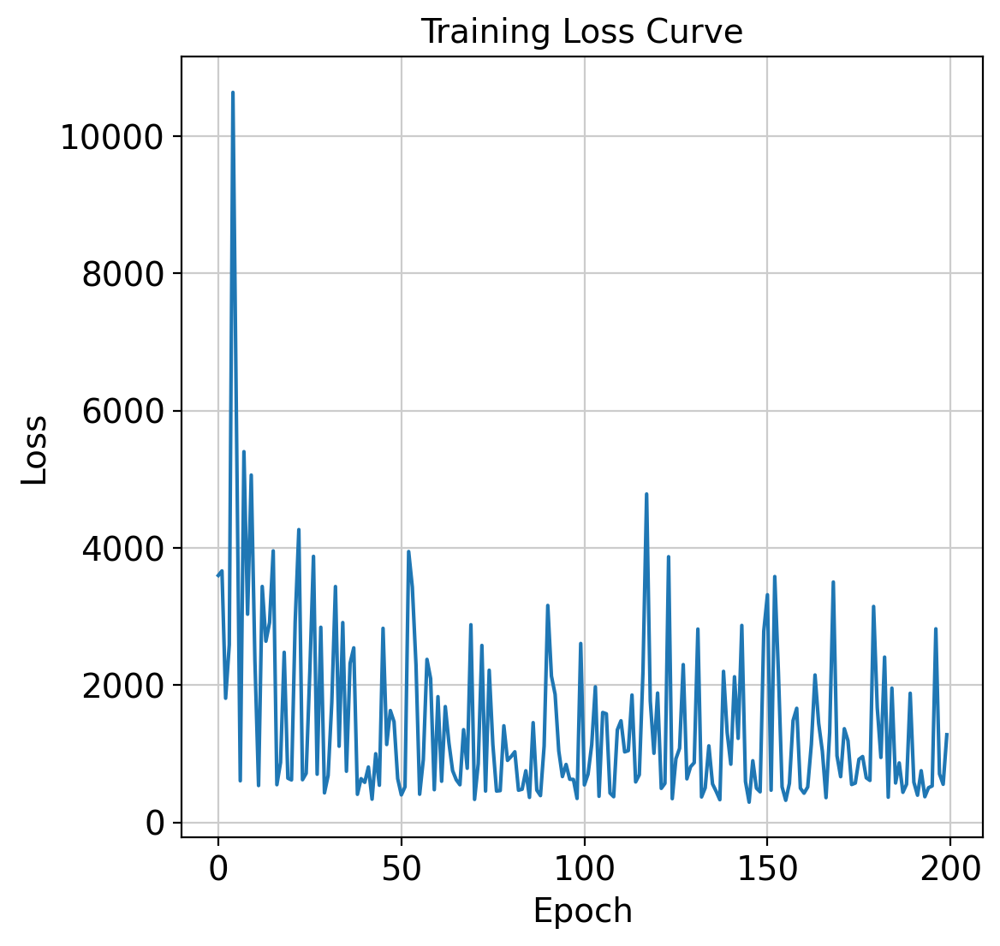

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Subset the data for the current source
    source_data = target2_moa[target2_moa.obs["Metadata_Source"] == source].copy()
    #print(source)

    # Create dataloader for the current source
    dataloader = create_training_dataloader(target2_moa, source, "source_2", batch_size=64, use_pca=True)

    # Train ot_cfm_model for the current source
    trained_ot_cfm_model = train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=200, plot_loss=True)

    # Save the trained ot_cfm_model
    save_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_3_ot_cfm_single_cell_{source}_to_source_2.pt")

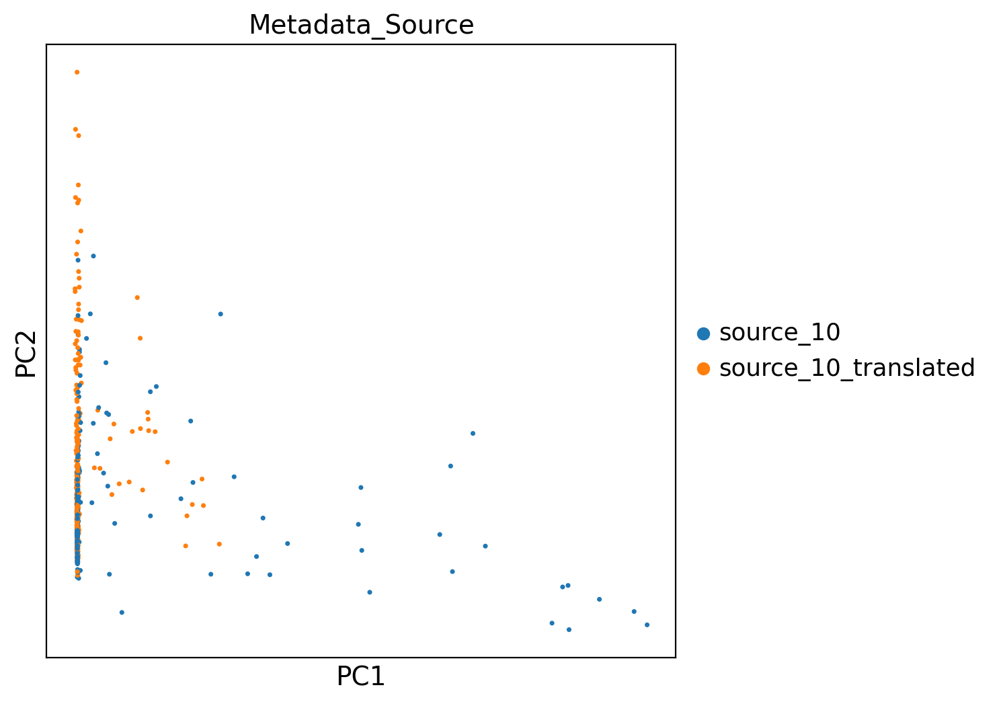

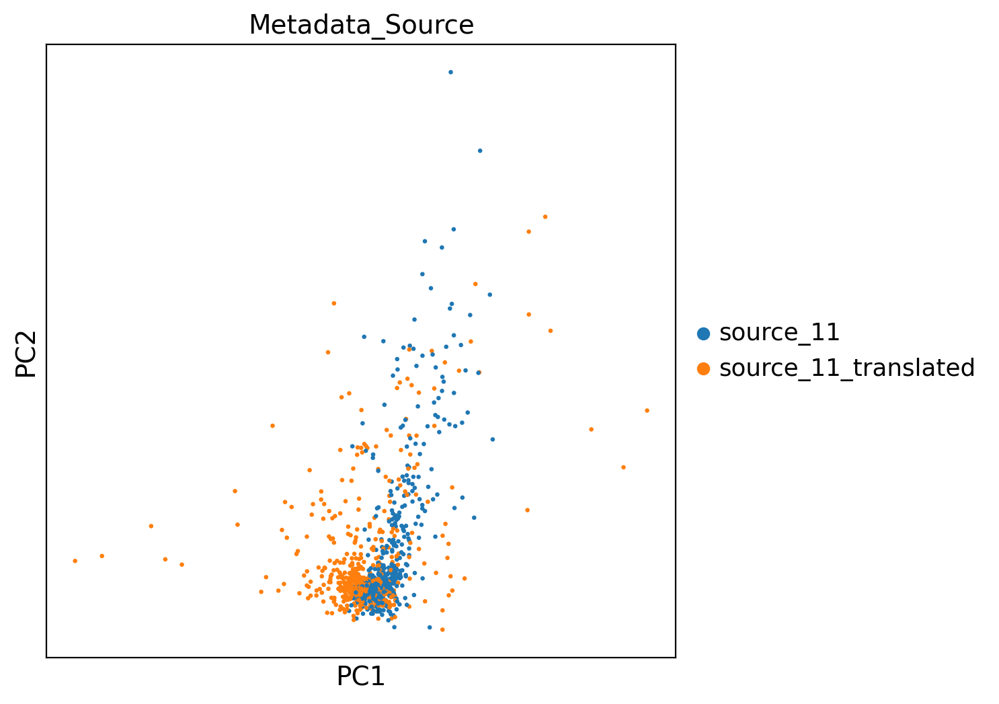

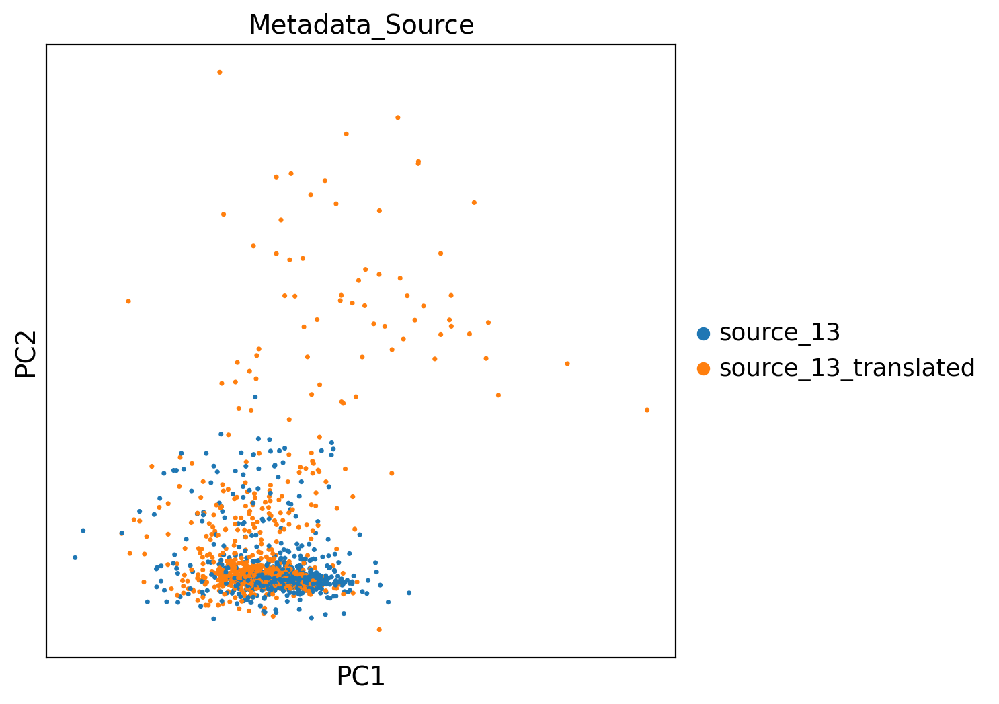

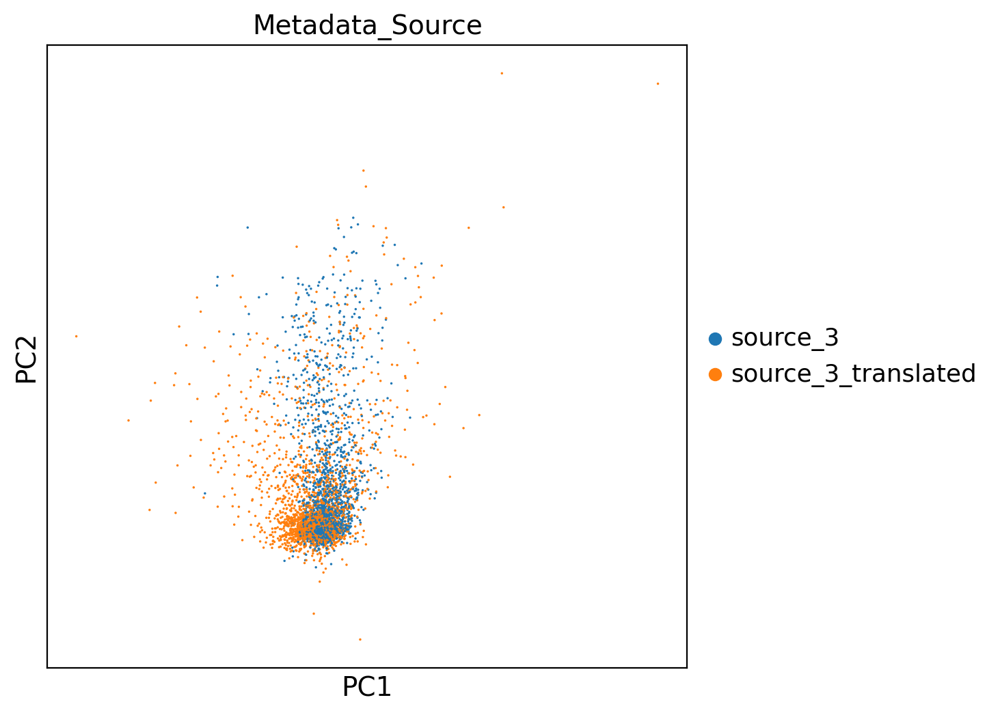

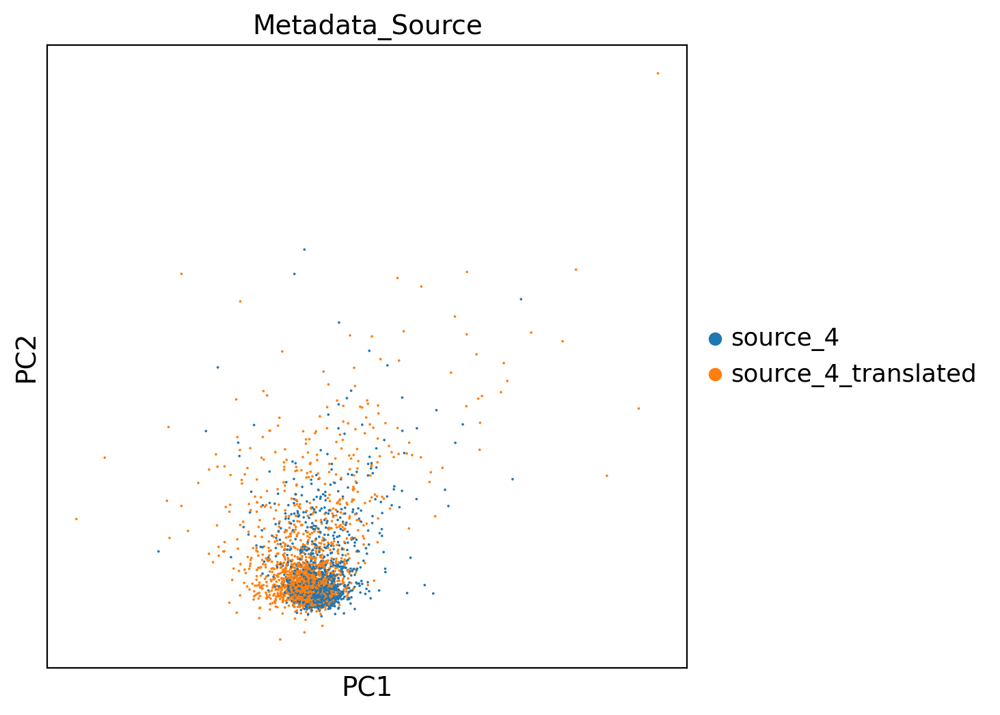

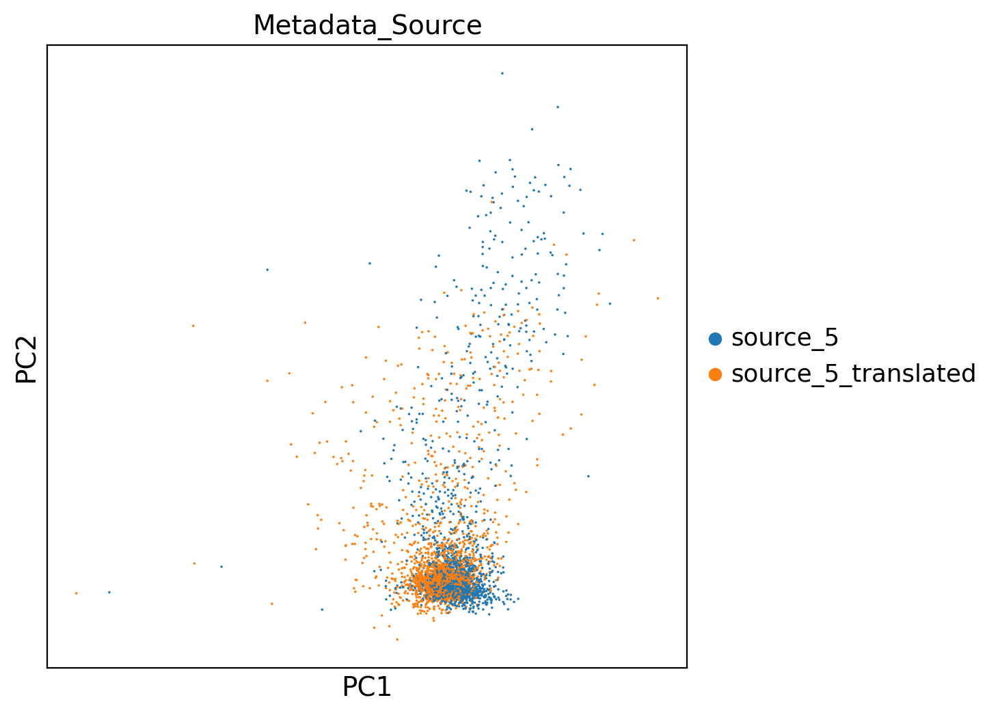

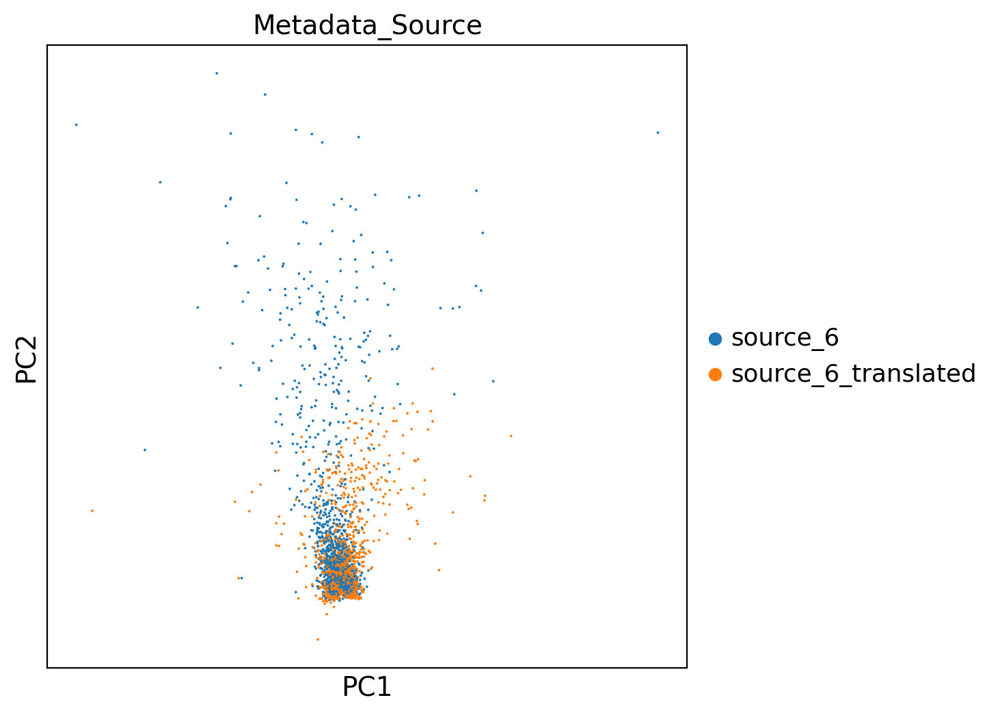

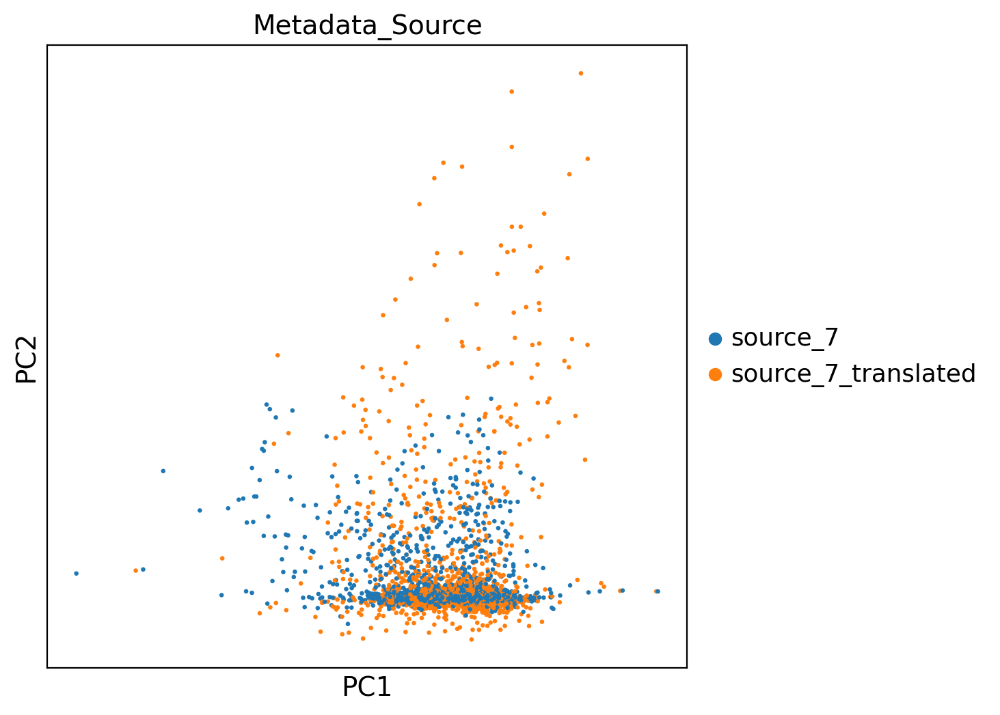

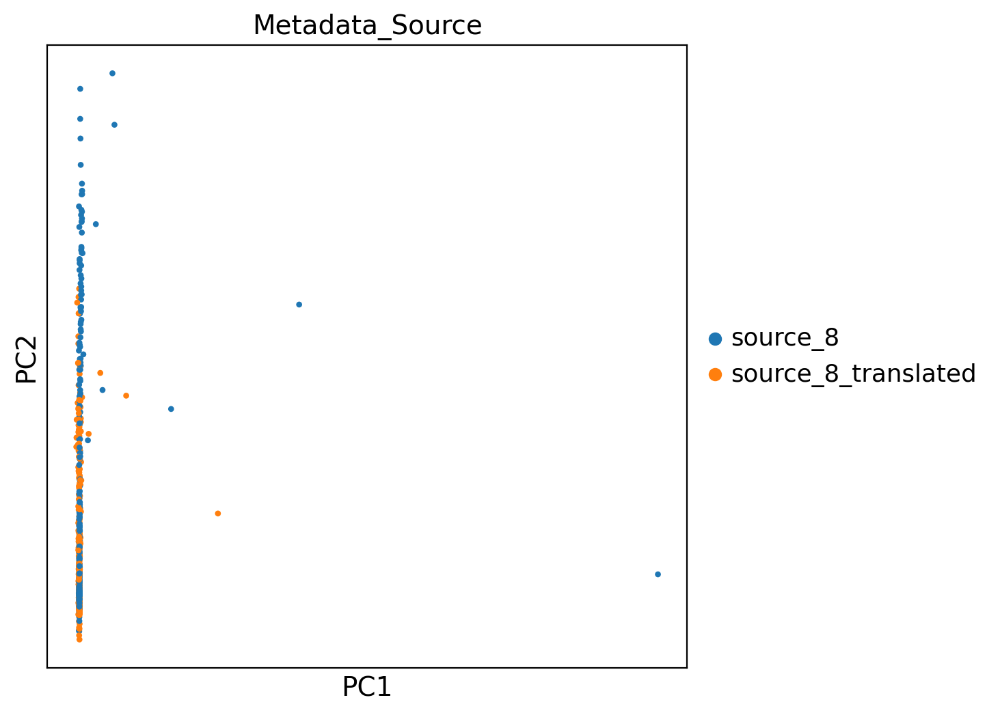

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Create dataloader for the current source
    dataloader = create_dataloader(target2_moa, source, batch_size=64, use_pca=True)

    # Load the model
    load_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_3_ot_cfm_single_cell_{source}_to_source_2.pt")

    # Perform translation for the current source
    translated_source_adata = transport(dataloader, ot_cfm_model, x1_label=source, device="cpu", save_adata_path=None)

    # Append to the list of translated sources
    translated_sources.append(translated_source_adata)

    # Plot PCA after transporting each source
    sc.pl.pca(translated_source_adata, color="Metadata_Source")

In [ ]:
all_sources_adata = sc.concat(translated_sources, axis=0)
print(all_sources_adata.shape)

(93624, 50)


In [ ]:
# Extract data corresponding to source_2 from target2_moa
source_2_data = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].copy()
source_2_data.obsm["X_pca"].shape

(3828, 50)

In [ ]:
# Extract data corresponding to source_2 from target2_moa
source_2_data = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].copy()
source_2_data.obsm["X_pca"].shape

# Save translated source as a separate Adata
translated_source_adata = sc.concat([all_sources_adata, source_2_data], join="outer")
translated_source_adata.obsm["X_pca"] = np.concatenate((all_sources_adata.obsm["X_pca"], source_2_data.obsm["X_pca"]), axis=0)

all_sources_adata = translated_source_adata
print(all_sources_adata.shape)
all_sources_adata.obs

(97452, 641)


,Metadata_Source,Metadata_moa,Metadata_JCP2022,Metadata_Microscope_Name,Metadata_Plate,Metadata_Well,Metadata_Batch,Metadata_InChIKey,Metadata_InChI,Metadata_InChIKey_standardized,...,Metadata_disease_area,Metadata_indication,Metadata_Widefield_vs_Confocal,Metadata_Excitation_Type,Metadata_Objective_NA,Metadata_N_Brightfield_Planes_Min,Metadata_N_Brightfield_Planes_Max,Metadata_Distance_Between_Z_Microns,Metadata_Sites_Per_Well,Metadata_Filter_Configuration
0,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,source_10_translated,glutamate receptor antagonist,JCP2022_042261,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,source_10_translated,sphingosine 1 phosphate receptor agonist,JCP2022_020718,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,source_10_translated,histamine receptor antagonist,JCP2022_016288,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
source_2__1086293911__P20,source_2,calcium channel blocker,JCP2022_032357,CV8000,1086293911,P20,20210719_Batch_6,HSUGRBWQSSZJOP-UHFFFAOYSA-N,InChI=1S/C22H26N2O4S/c1-15(25)28-20-21(16-9-11...,HSUGRBWQSSZJOP-UHFFFAOYSA-N,...,cardiology,hypertension|angina pectoris,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P21,source_2,Bruton's tyrosine kinase (BTK) inhibitor,JCP2022_047545,CV8000,1086293911,P21,20210719_Batch_6,KXBDTLQSDKGAEB-UHFFFAOYSA-N,InChI=1S/C22H22FN5O3/c1-3-20(29)25-16-5-4-6-17...,KXBDTLQSDKGAEB-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P22,source_2,cyclooxygenase inhibitor,JCP2022_043099,CV8000,1086293911,P22,20210719_Batch_6,JZFPYUNJRRFVQU-UHFFFAOYSA-N,"InChI=1S/C13H9F3N2O2/c14-13(15,16)8-3-1-4-9(7-...",JZFPYUNJRRFVQU-UHFFFAOYSA-N,...,rheumatology|neurology/psychiatry,joint pain|muscle pain,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P23,source_2,growth factor receptor inhibitor,JCP2022_050516,CV8000,1086293911,P23,20210719_Batch_6,LNFZRMDSZJCZTG-UHFFFAOYSA-N,InChI=1S/C28H21F4N5O2/c1-15-4-6-19(35-27(39)37...,LNFZRMDSZJCZTG-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A


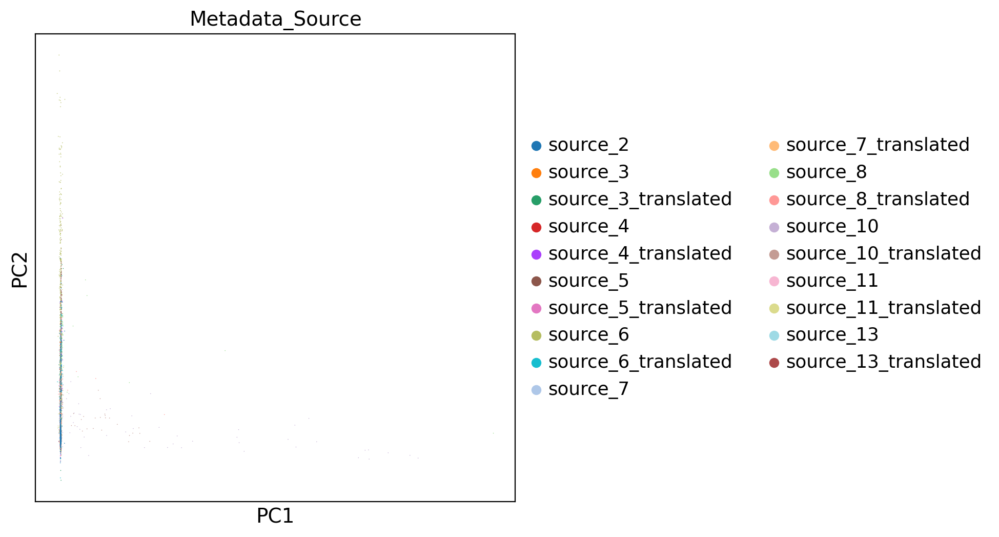

In [ ]:
# Plot PCA with all transported sources
sc.pl.pca(all_sources_adata, color="Metadata_Source")

We note that it is not performing well for source 8 and source 10 but doing well for all other sources.

In [ ]:
all_sources_adata = sc.read_h5ad('./run_3_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

In [ ]:
#subset all_sources_adata to only contain translated_sources and source2 and plot UMAP showing Metadata_Source again
selected_sources = ['source_2', 'source_3_translated', 'source_4_translated', 'source_5_translated', 'source_6_translated', 'source_7_translated', 'source_8_translated', 'source_10_translated', 'source_11_translated', 'source_13_translated']
subset_adata = all_sources_adata[all_sources_adata.obs['Metadata_Source'].isin(selected_sources)].copy()

# UMAP for the subsetted adata
sc.pp.neighbors(subset_adata, use_rep="X_pca")
sc.tl.umap(subset_adata)

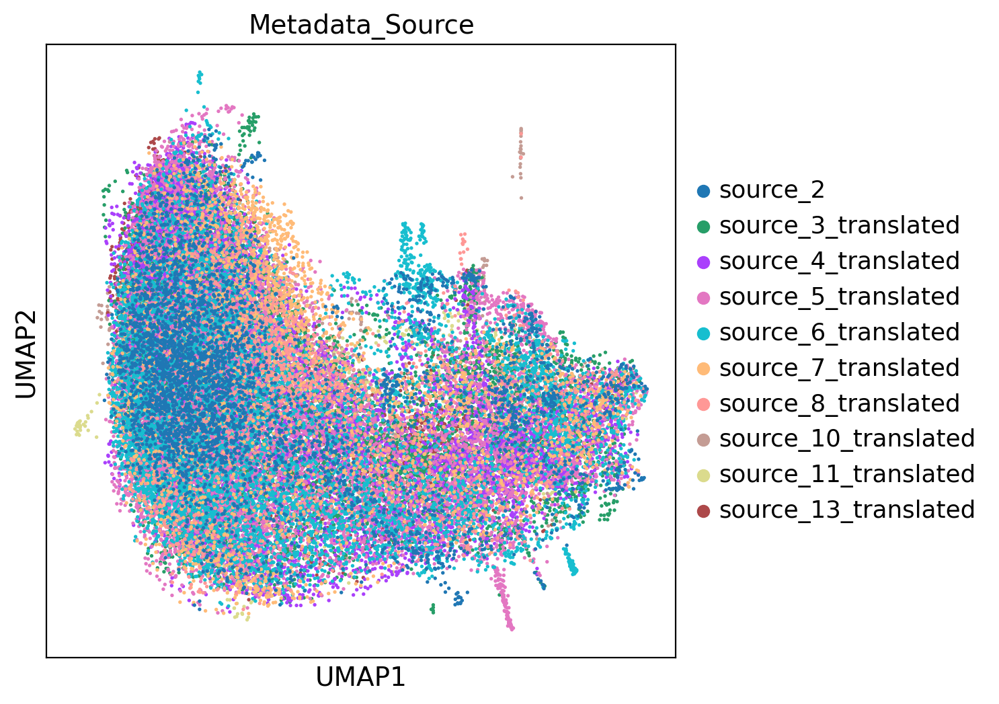

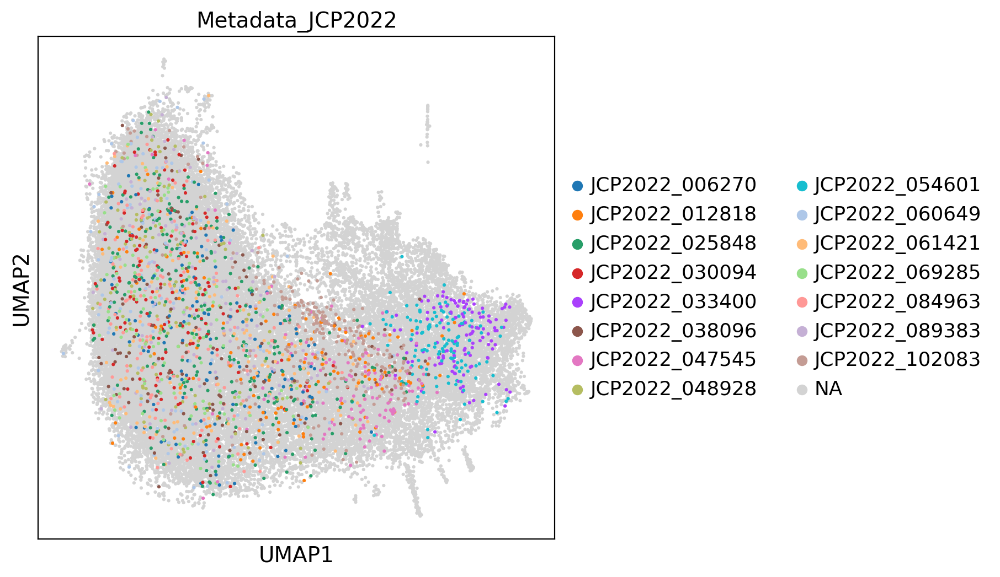

In [ ]:
#Plot Metadata_source
sc.pl.umap(subset_adata, color="Metadata_Source", s = 15)

# Convert Metadata_JCP2022 to category type
subset_adata.obs["Metadata_JCP2022"] = subset_adata.obs["Metadata_JCP2022"].astype("category")

# Randomly sample a smaller set of categories
jcp_examples = random.sample(subset_adata.obs["Metadata_JCP2022"].unique().tolist(), 15)

# Assign none to categories not in the random sample to be grey
subset_adata.obs["Metadata_JCP2022"] = [jcp if jcp in jcp_examples else None for jcp in subset_adata.obs["Metadata_JCP2022"].values]

# Plot UMAP with Metadata_JCP2022
sc.pl.umap(subset_adata, color="Metadata_JCP2022", s = 20)

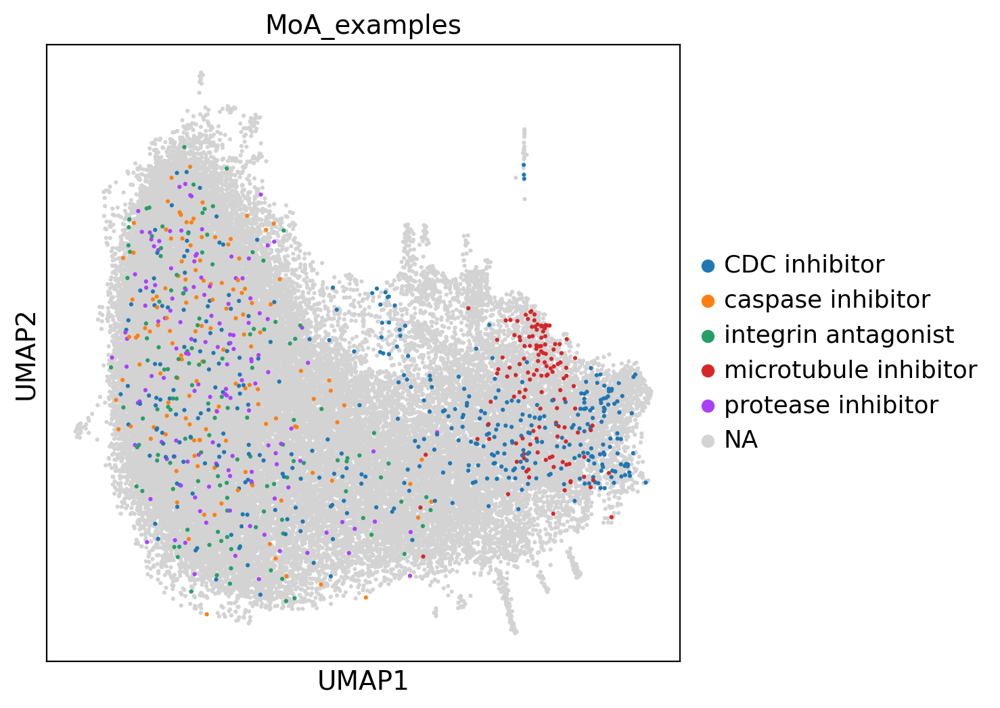

In [ ]:
moa_examples = ["CDC inhibitor", "caspase inhibitor", "integrin antagonist", "microtubule inhibitor", "protease inhibitor"]
subset_adata.obs["MoA_examples"] = [moa if moa in moa_examples else None for moa in subset_adata.obs.Metadata_moa]
subset_adata.obs["MoA_examples"] = subset_adata.obs["MoA_examples"].astype("category")
sc.pl.umap(subset_adata, color="MoA_examples", s=20)

In [ ]:
#Save the resulting adata to file
all_sources_adata.write('./run_3_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

### Run 4: Transport iteratively all sources from target2_moa into source 2 and visualize result with use_pca = False for 200 epochs

In [ ]:
# Load target2_moa
target2_moa = load_adata("/content/drive/MyDrive/datasets/Tim_target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")

#setup
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

# init all stuff
ot_cfm_model = create_ot_cfm_model(adata=target2_moa, use_pca=False)
ot_cfm_optimizer = create_ot_cfm_optimizer(ot_cfm_model)
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=0.1)

100%|██████████| 200/200 [01:22<00:00,  2.42it/s]


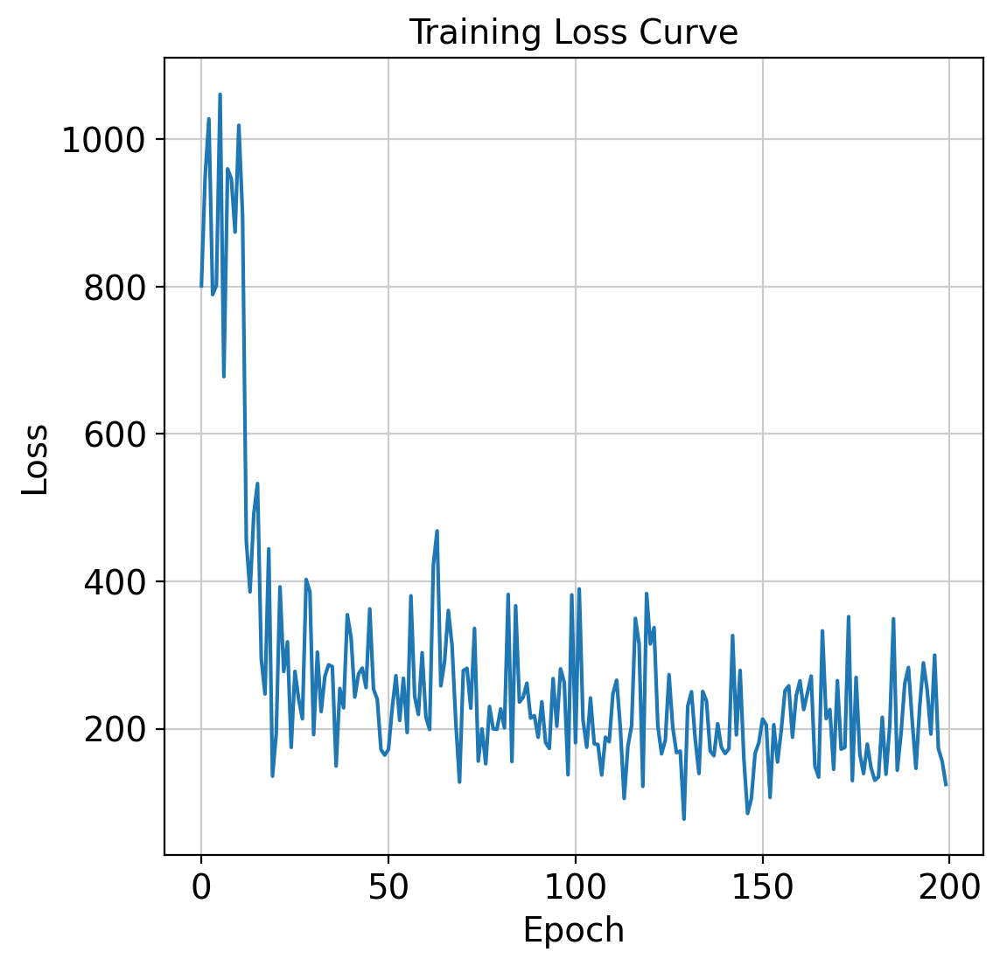

100%|██████████| 200/200 [01:23<00:00,  2.38it/s]


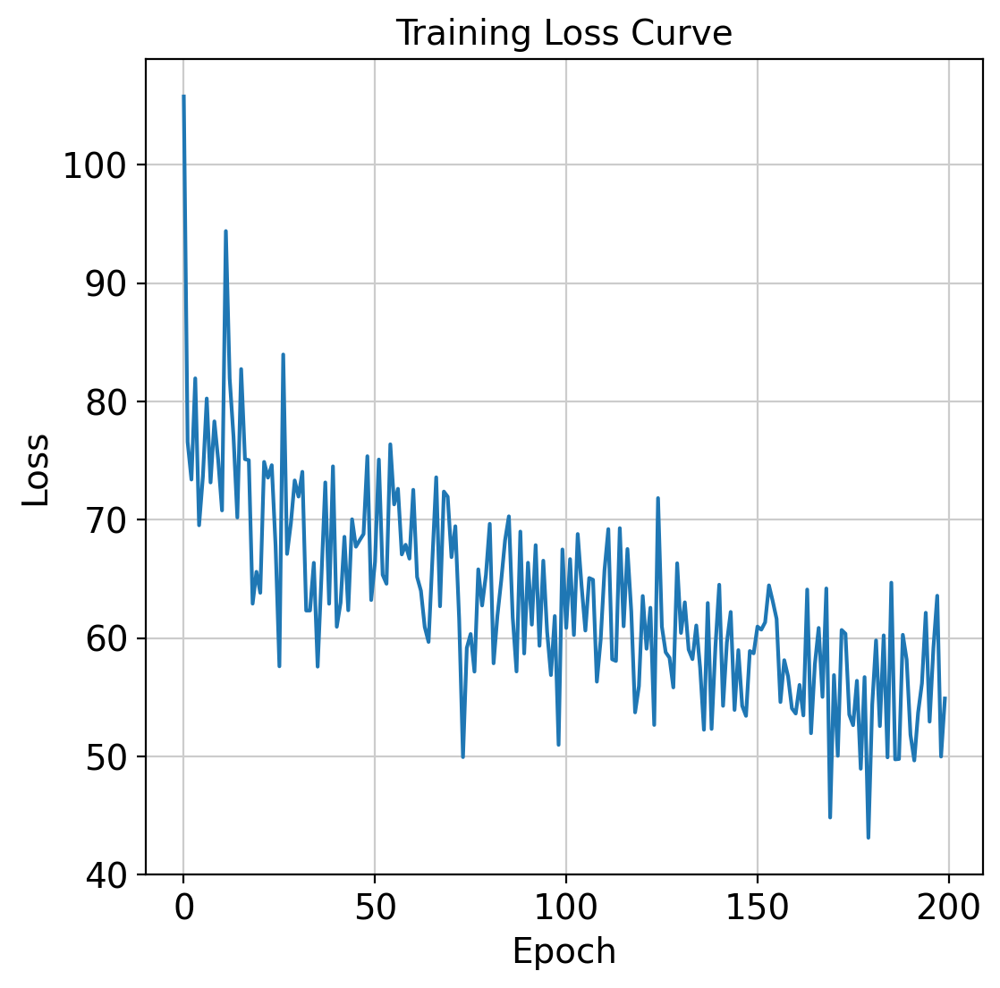

100%|██████████| 200/200 [01:11<00:00,  2.81it/s]


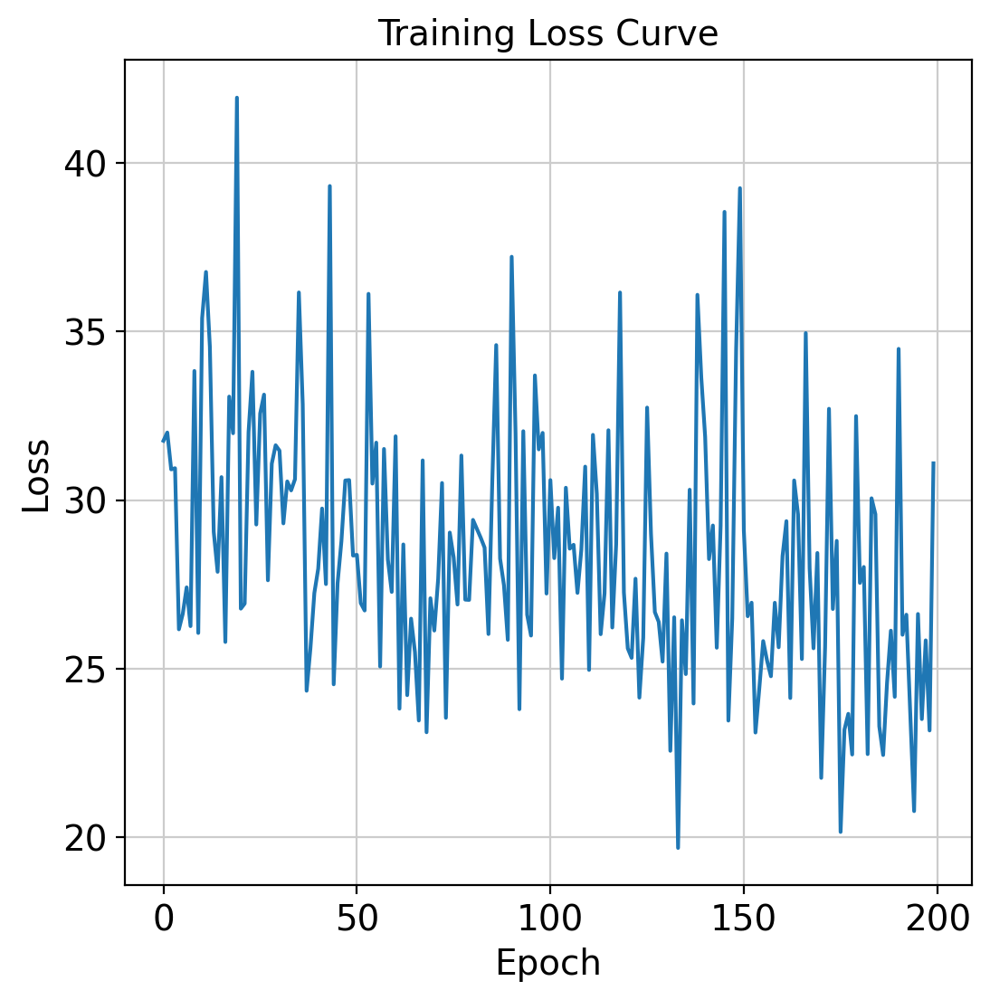

100%|██████████| 200/200 [02:04<00:00,  1.60it/s]


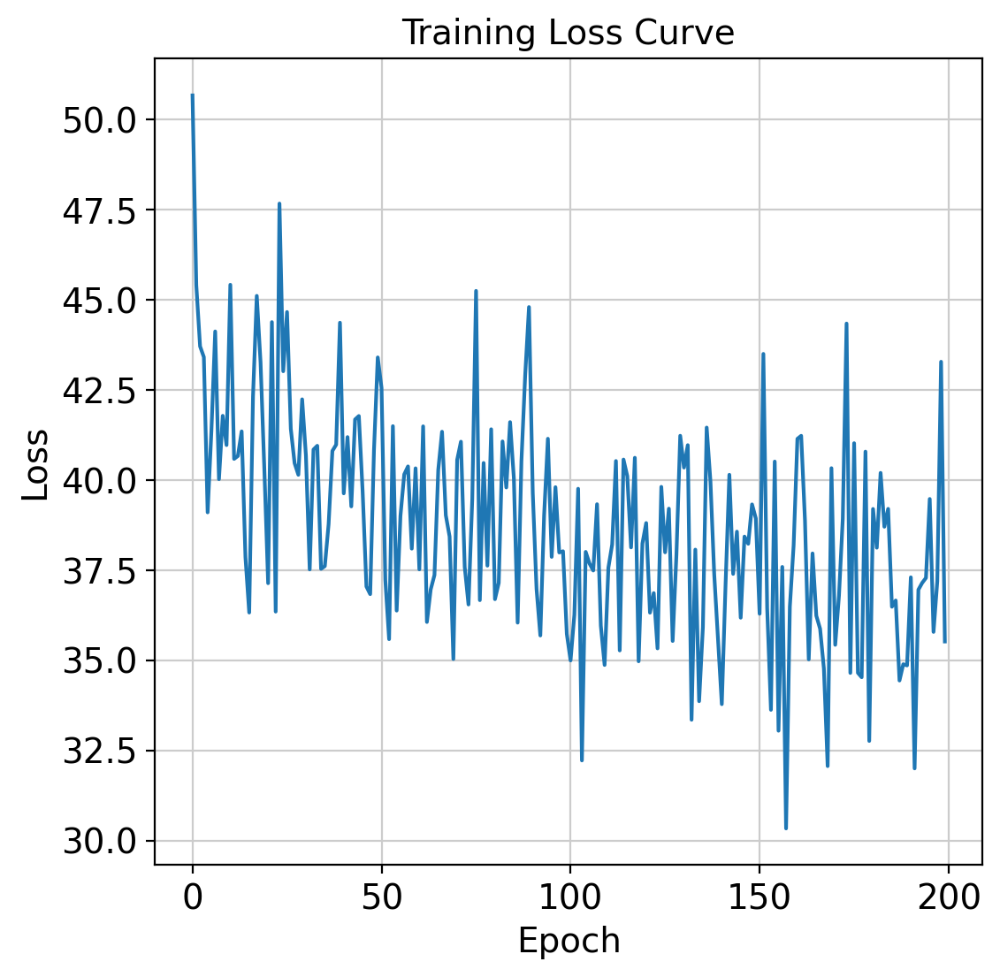

100%|██████████| 200/200 [01:58<00:00,  1.69it/s]


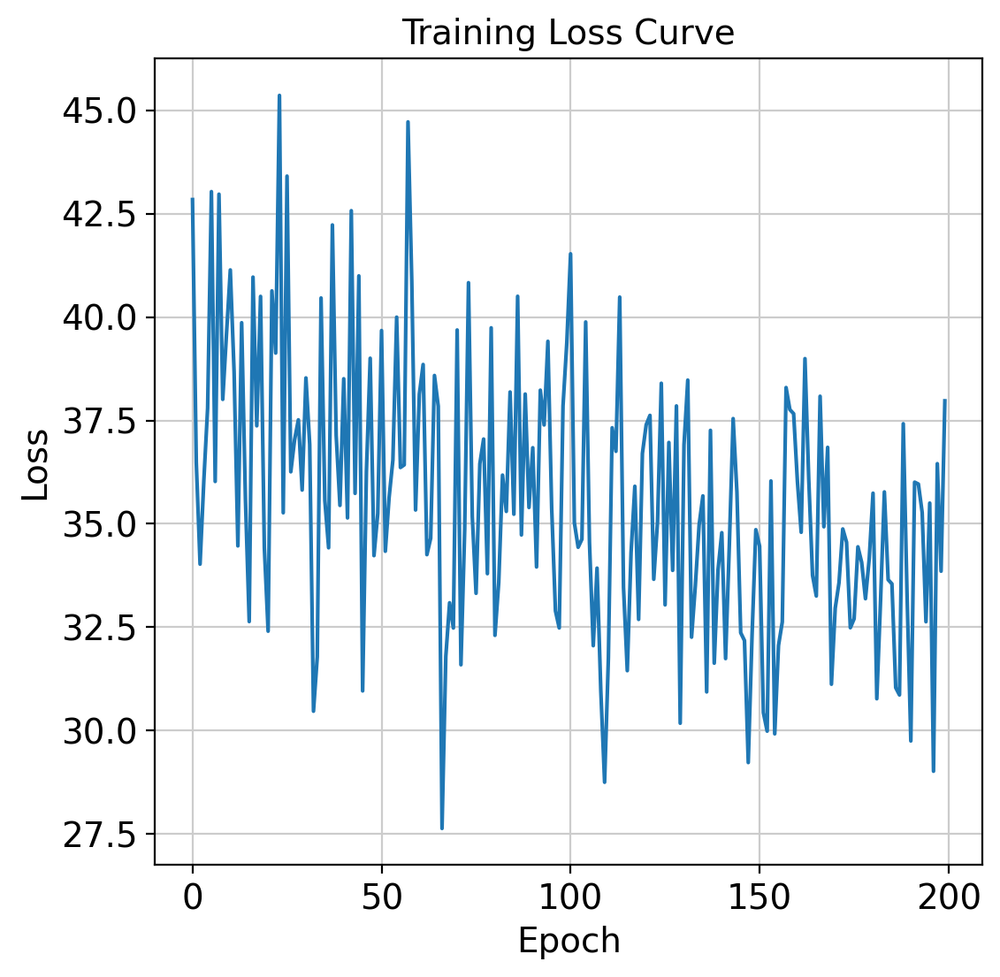

100%|██████████| 200/200 [01:56<00:00,  1.71it/s]


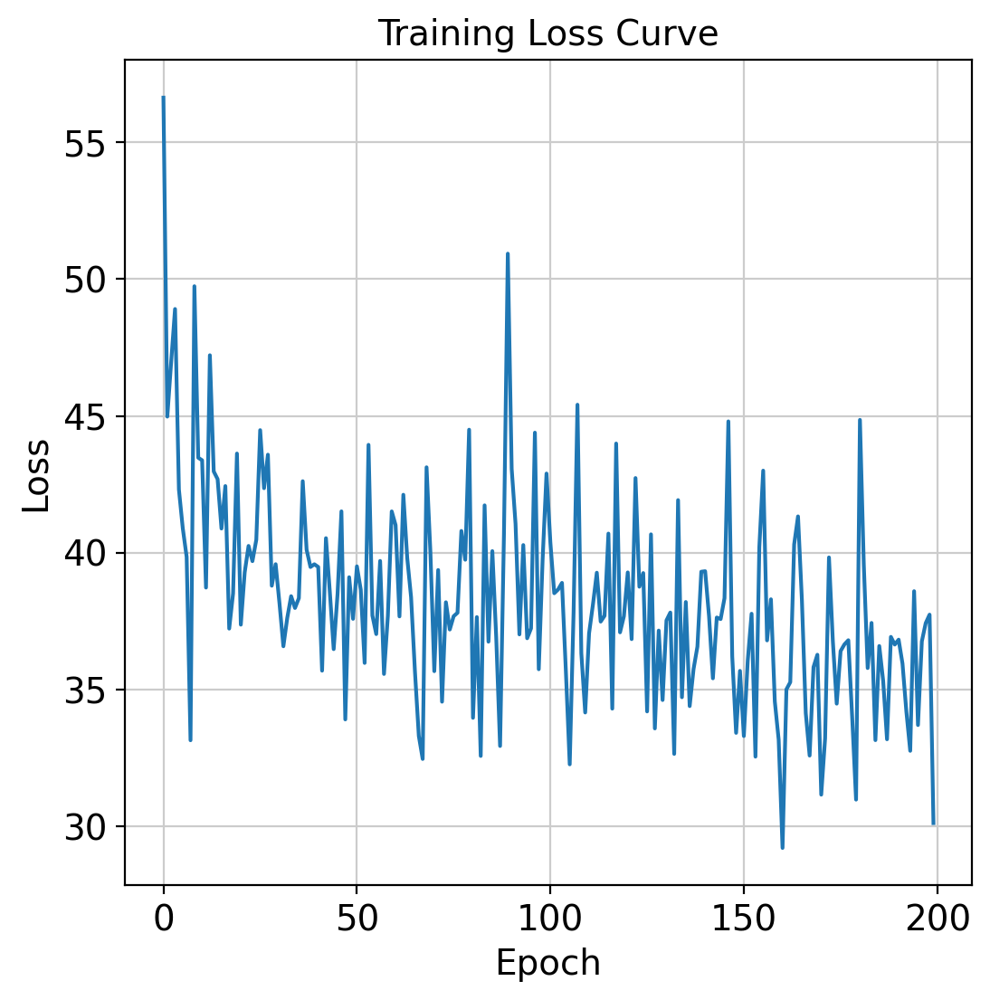

100%|██████████| 200/200 [01:57<00:00,  1.70it/s]


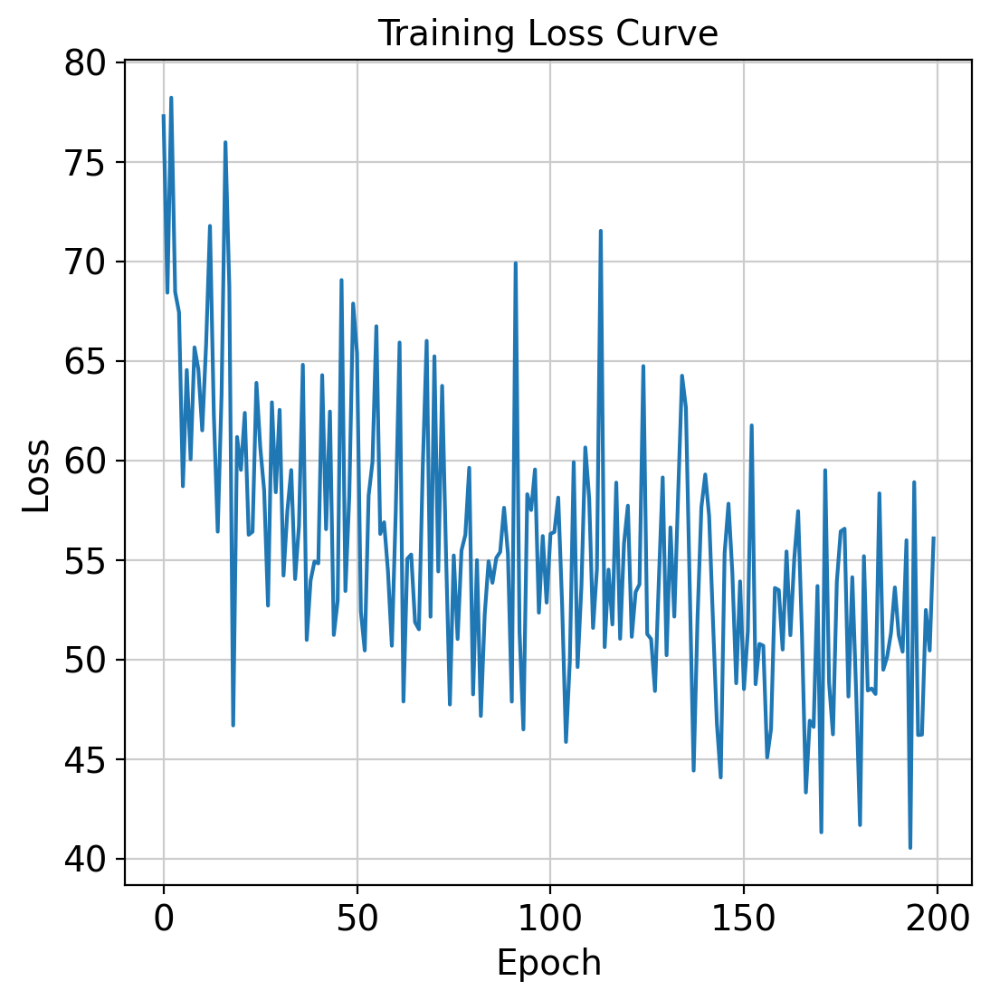

100%|██████████| 200/200 [01:24<00:00,  2.36it/s]


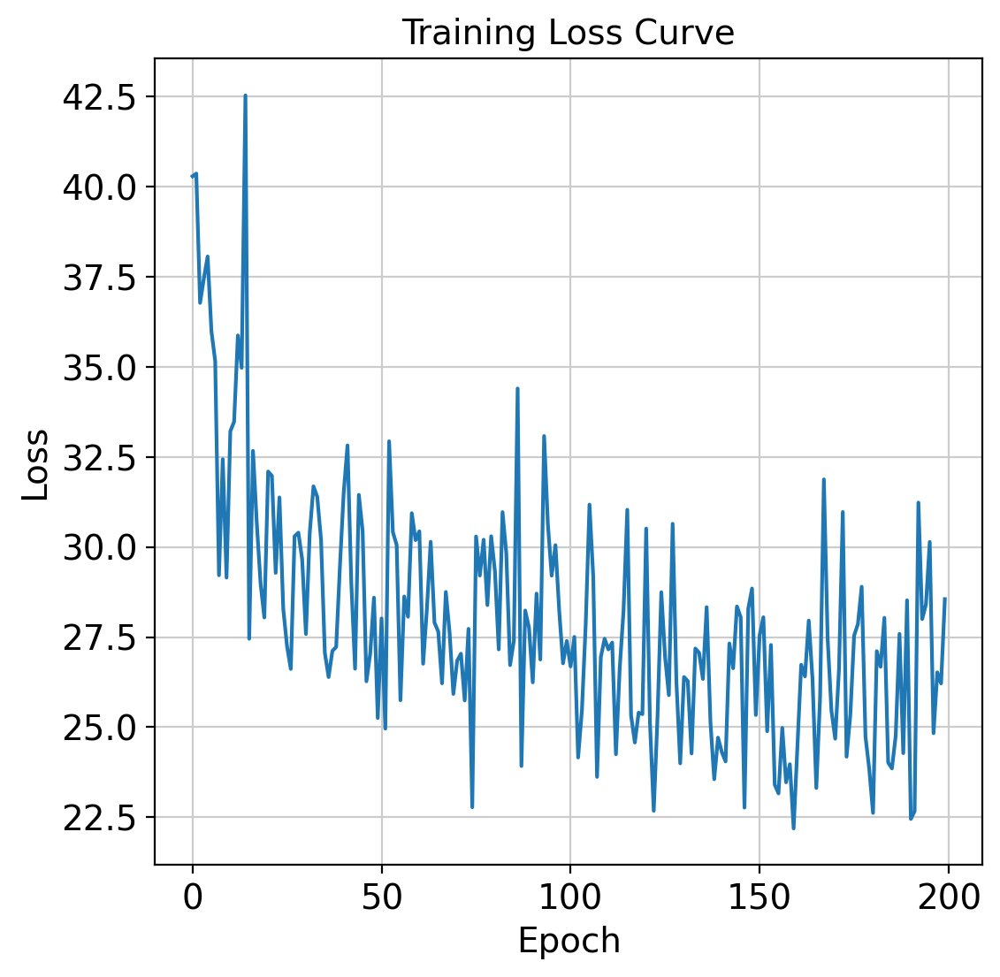

100%|██████████| 200/200 [00:49<00:00,  4.03it/s]


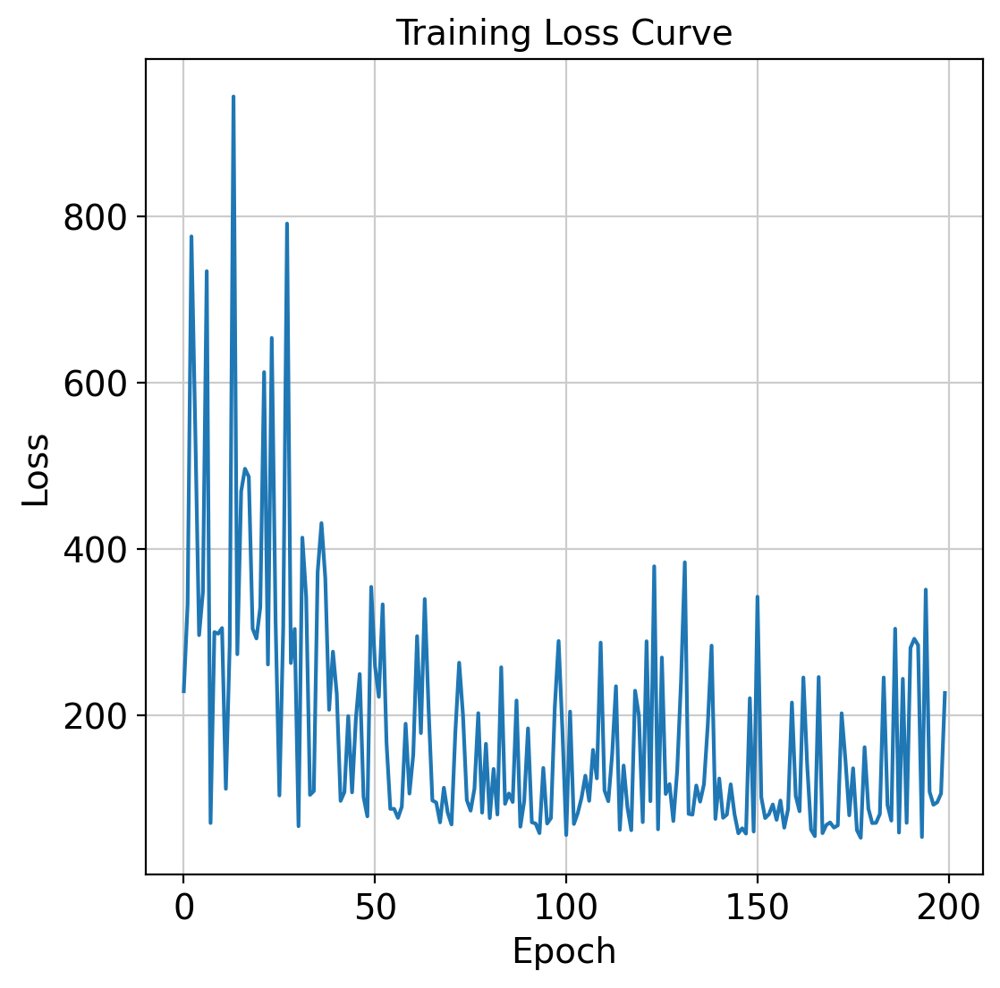

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Subset the data for the current source
    source_data = target2_moa[target2_moa.obs["Metadata_Source"] == source].copy()
    #print(source)

    # Create dataloader for the current source
    dataloader = create_training_dataloader(target2_moa, source, "source_2", batch_size=64, use_pca=False)

    # Train ot_cfm_model for the current source
    trained_ot_cfm_model = train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=200, plot_loss=True)

    # Save the trained ot_cfm_model
    save_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_4_ot_cfm_single_cell_{source}_to_source_2.pt")

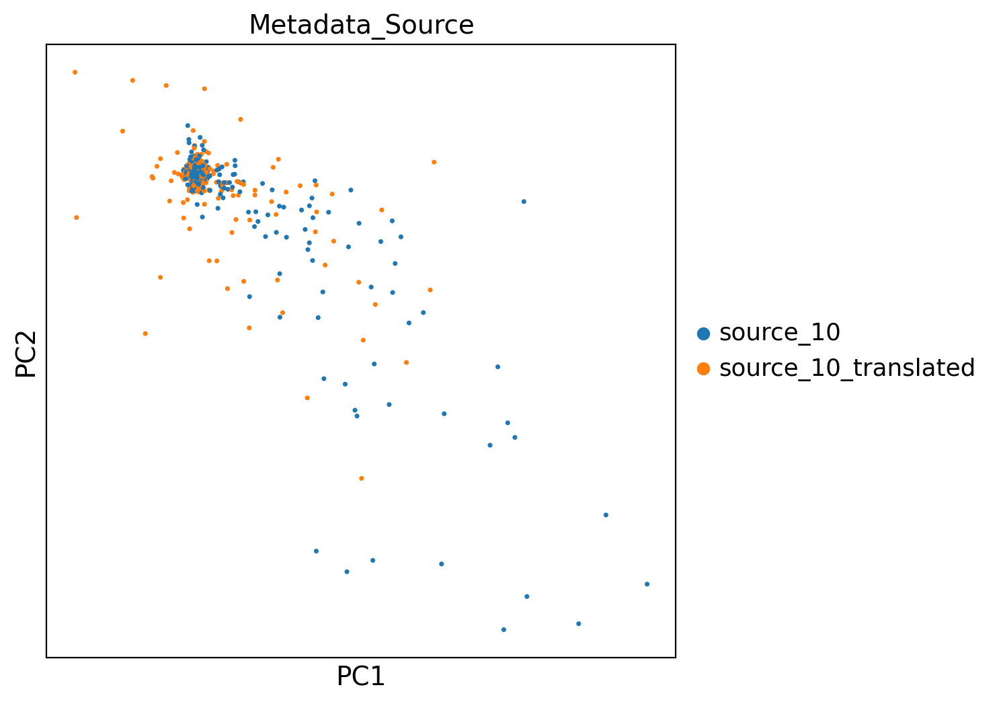

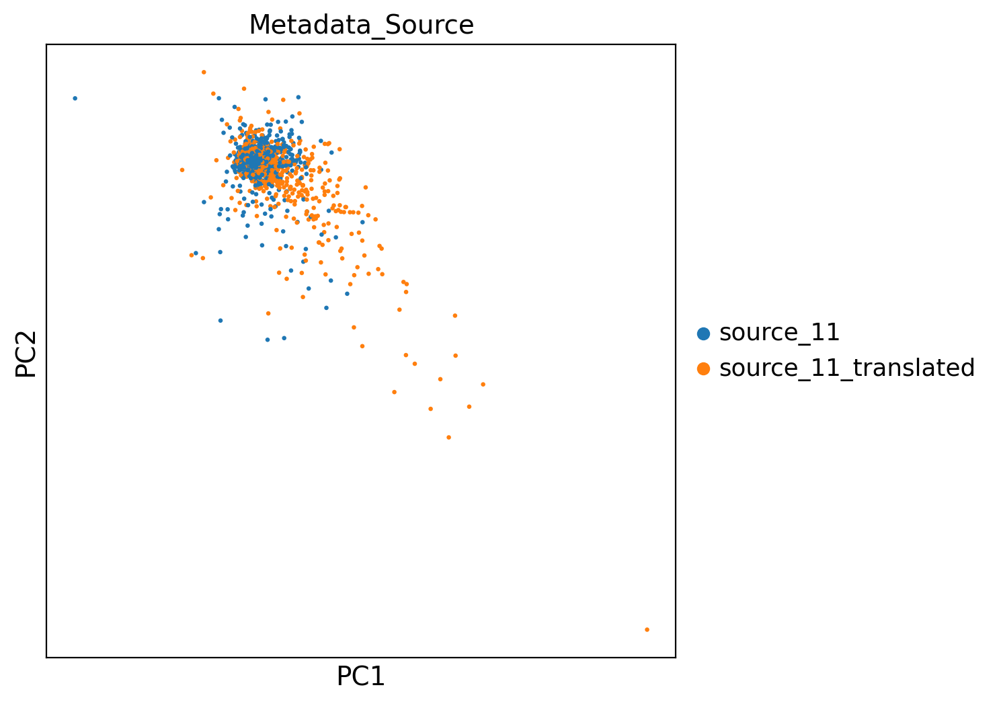

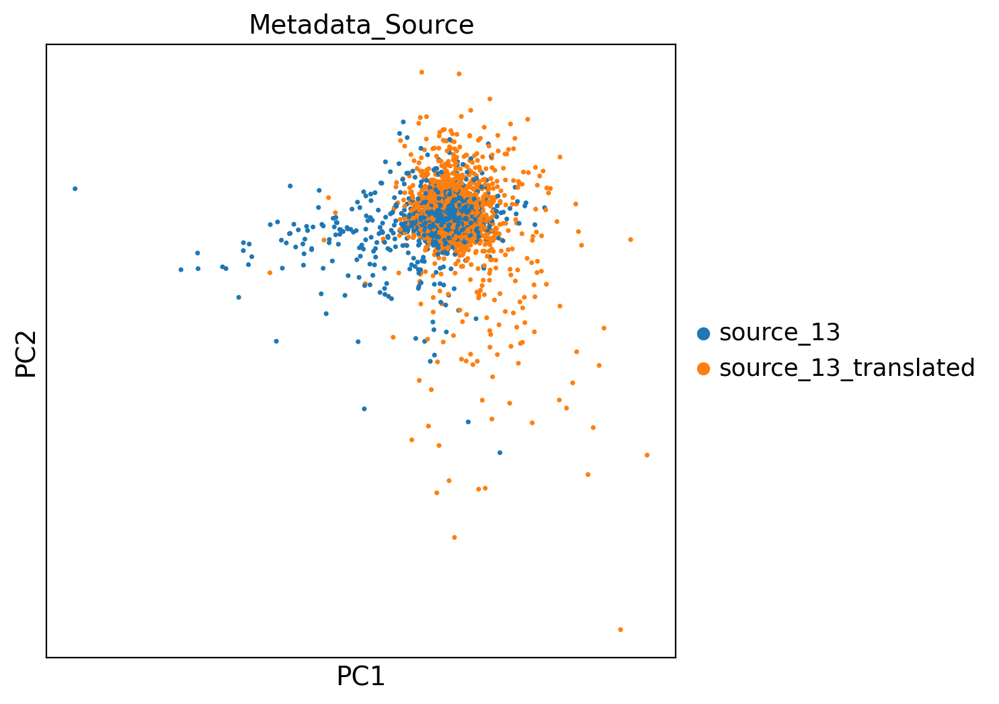

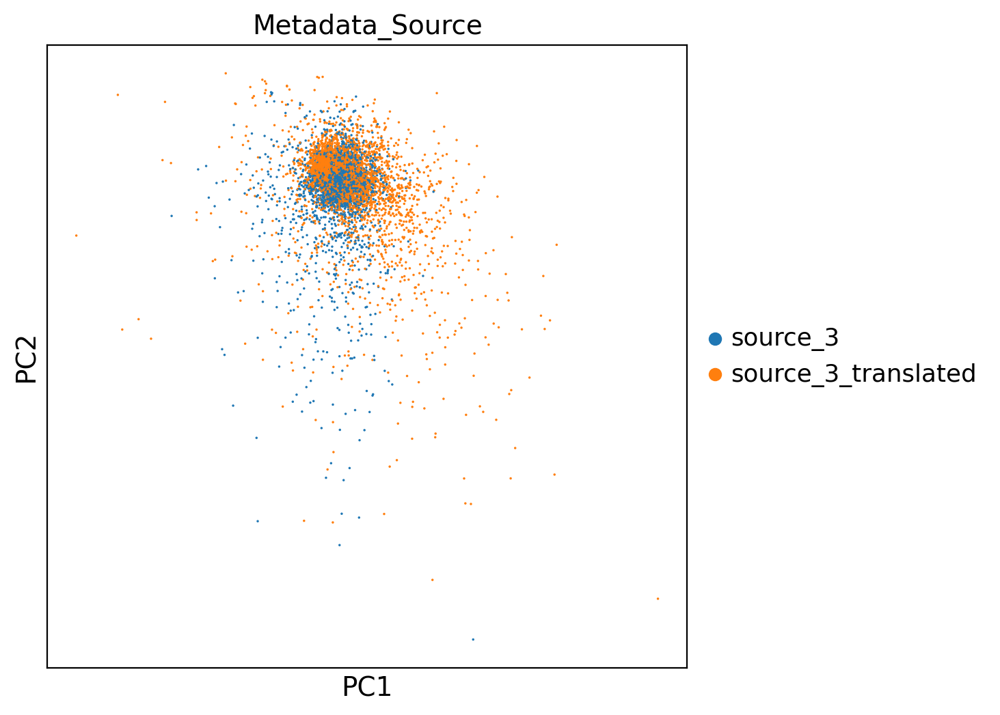

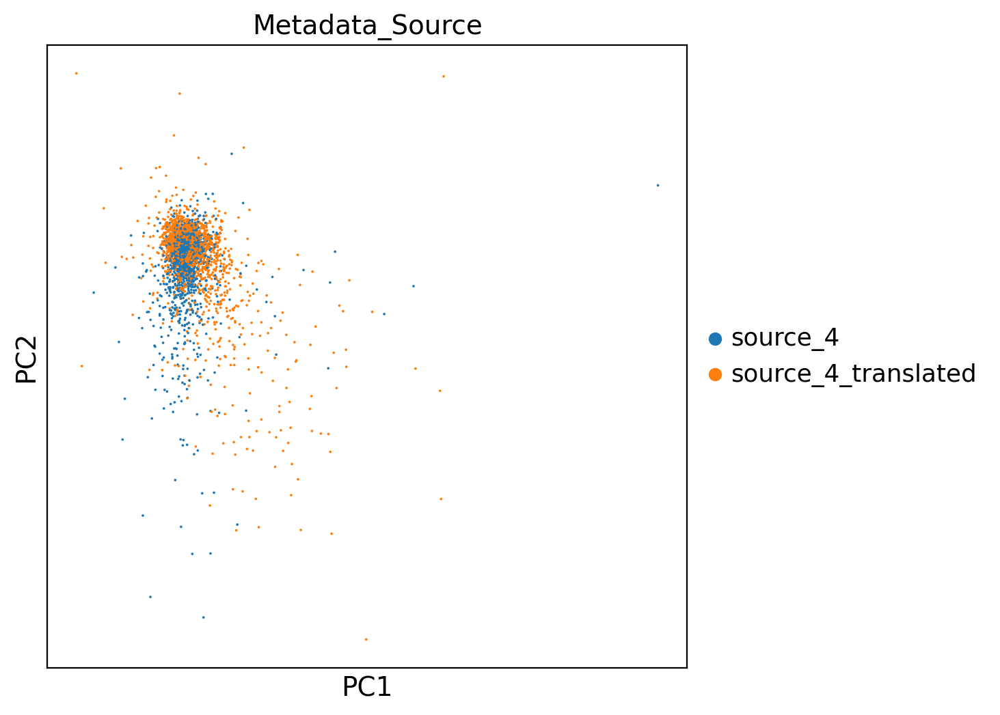

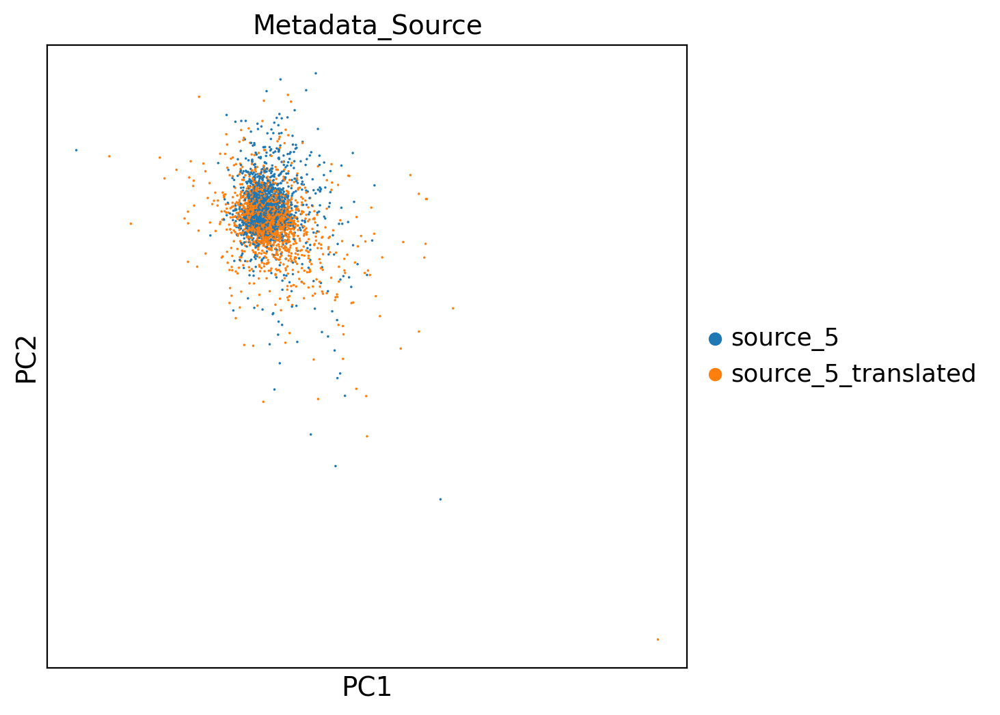

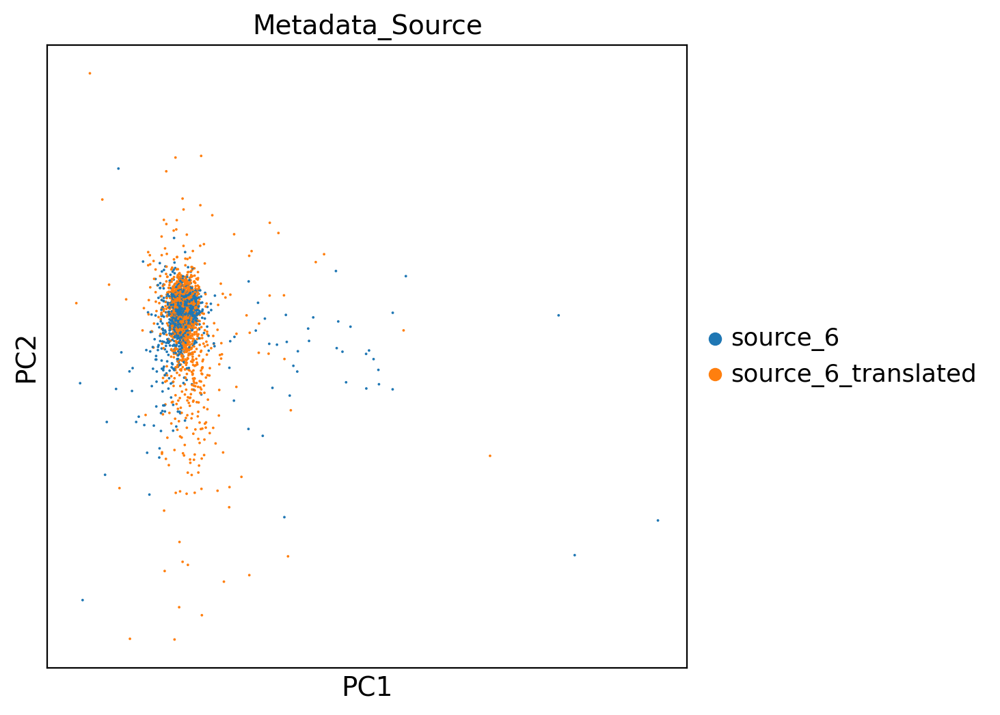

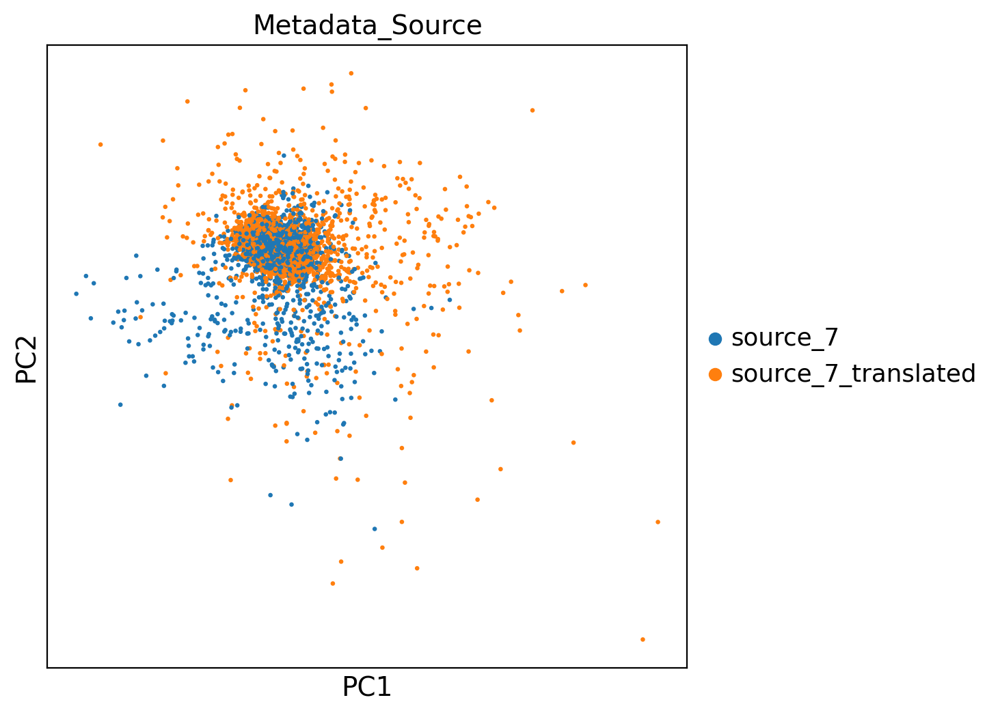

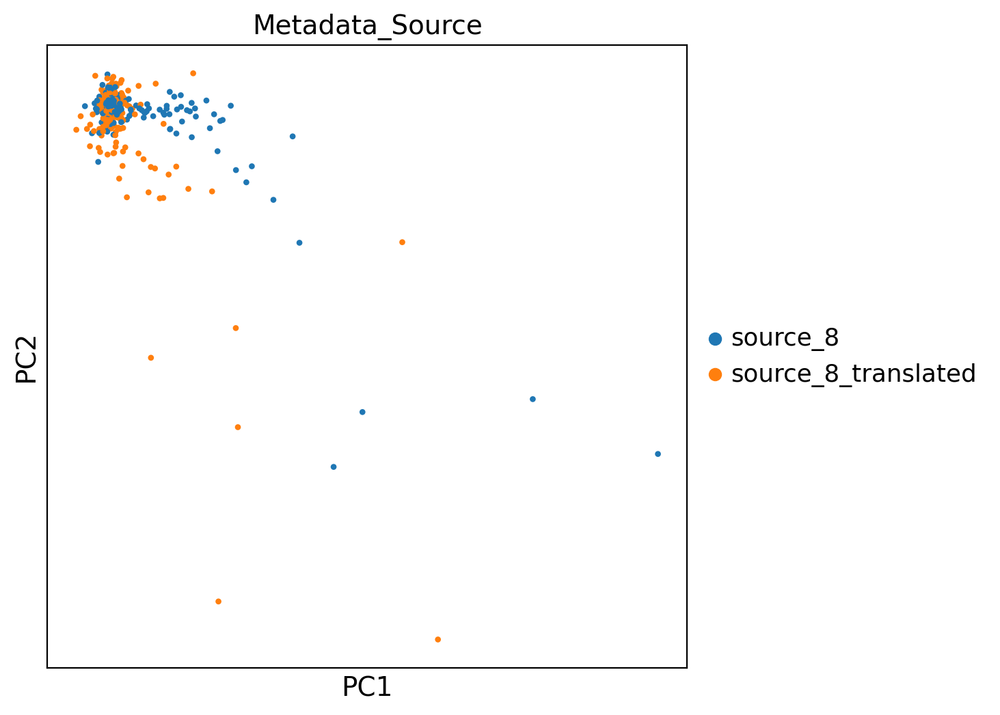

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Create dataloader for the current source
    dataloader = create_dataloader(target2_moa, source, batch_size=64, use_pca=False)

    # Load the model
    load_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_4_ot_cfm_single_cell_{source}_to_source_2.pt")

    # Perform translation for the current source
    translated_source_adata = transport(dataloader, ot_cfm_model, x1_label=source, device="cpu", save_adata_path=None)

    # Append to the list of translated sources
    translated_sources.append(translated_source_adata)

    # Plot PCA after transporting each source
    sc.pl.pca(translated_source_adata, color="Metadata_Source")

In [ ]:
all_sources_adata = sc.concat(translated_sources, axis=0)
print(all_sources_adata.shape)

(93624, 591)


In [ ]:
# Extract data corresponding to source_2 from target2_moa
source_2_data = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].copy()
#print(source_2_data.shape)

# Save translated source as a separate Adata
translated_source_adata = sc.concat([all_sources_adata, source_2_data], join="outer")
translated_source_adata.obsm["X_pca"] = np.concatenate((all_sources_adata.obsm["X_pca"], source_2_data.X), axis=0)

all_sources_adata = translated_source_adata
print(all_sources_adata.shape)
all_sources_adata.obs

(3828, 591)
(97452, 1182)


,Metadata_Source,Metadata_moa,Metadata_JCP2022,Metadata_Microscope_Name,Metadata_Plate,Metadata_Well,Metadata_Batch,Metadata_InChIKey,Metadata_InChI,Metadata_InChIKey_standardized,...,Metadata_disease_area,Metadata_indication,Metadata_Widefield_vs_Confocal,Metadata_Excitation_Type,Metadata_Objective_NA,Metadata_N_Brightfield_Planes_Min,Metadata_N_Brightfield_Planes_Max,Metadata_Distance_Between_Z_Microns,Metadata_Sites_Per_Well,Metadata_Filter_Configuration
0,source_10_translated,HSP inhibitor,JCP2022_030049,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,source_10_translated,transglutaminase inhibitor,JCP2022_055397,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,source_10_translated,aldose reductase inhibitor,JCP2022_052259,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,source_10_translated,FAAH inhibitor,JCP2022_034137,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
source_2__1086293911__P20,source_2,calcium channel blocker,JCP2022_032357,CV8000,1086293911,P20,20210719_Batch_6,HSUGRBWQSSZJOP-UHFFFAOYSA-N,InChI=1S/C22H26N2O4S/c1-15(25)28-20-21(16-9-11...,HSUGRBWQSSZJOP-UHFFFAOYSA-N,...,cardiology,hypertension|angina pectoris,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P21,source_2,Bruton's tyrosine kinase (BTK) inhibitor,JCP2022_047545,CV8000,1086293911,P21,20210719_Batch_6,KXBDTLQSDKGAEB-UHFFFAOYSA-N,InChI=1S/C22H22FN5O3/c1-3-20(29)25-16-5-4-6-17...,KXBDTLQSDKGAEB-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P22,source_2,cyclooxygenase inhibitor,JCP2022_043099,CV8000,1086293911,P22,20210719_Batch_6,JZFPYUNJRRFVQU-UHFFFAOYSA-N,"InChI=1S/C13H9F3N2O2/c14-13(15,16)8-3-1-4-9(7-...",JZFPYUNJRRFVQU-UHFFFAOYSA-N,...,rheumatology|neurology/psychiatry,joint pain|muscle pain,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P23,source_2,growth factor receptor inhibitor,JCP2022_050516,CV8000,1086293911,P23,20210719_Batch_6,LNFZRMDSZJCZTG-UHFFFAOYSA-N,InChI=1S/C28H21F4N5O2/c1-15-4-6-19(35-27(39)37...,LNFZRMDSZJCZTG-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A


In [ ]:
all_sources_adata = sc.read_h5ad('./run_4_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

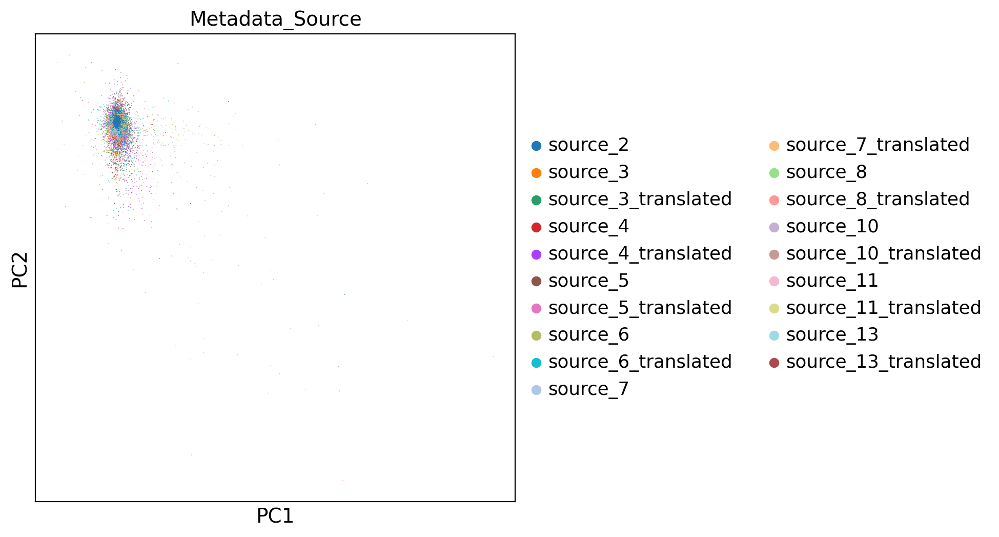

In [ ]:
# Plot PCA with all transported sources
sc.pl.pca(all_sources_adata, color="Metadata_Source")

In [ ]:
#subset all_sources_adata to only contain translated_sources and source2 and plot UMAP showing Metadata_Source again
selected_sources = ['source_2', 'source_3_translated', 'source_4_translated', 'source_5_translated', 'source_6_translated', 'source_7_translated', 'source_8_translated', 'source_10_translated', 'source_11_translated', 'source_13_translated']
subset_adata = all_sources_adata[all_sources_adata.obs['Metadata_Source'].isin(selected_sources)].copy()

# UMAP for the subsetted adata
sc.pp.neighbors(subset_adata, use_rep="X_pca")
sc.tl.umap(subset_adata)

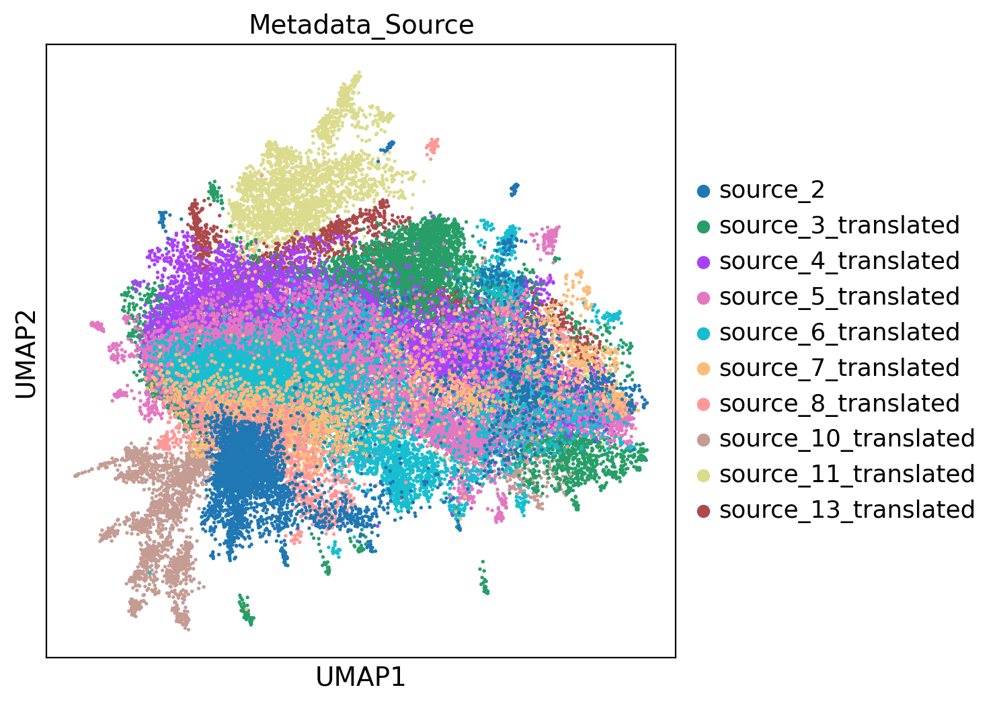

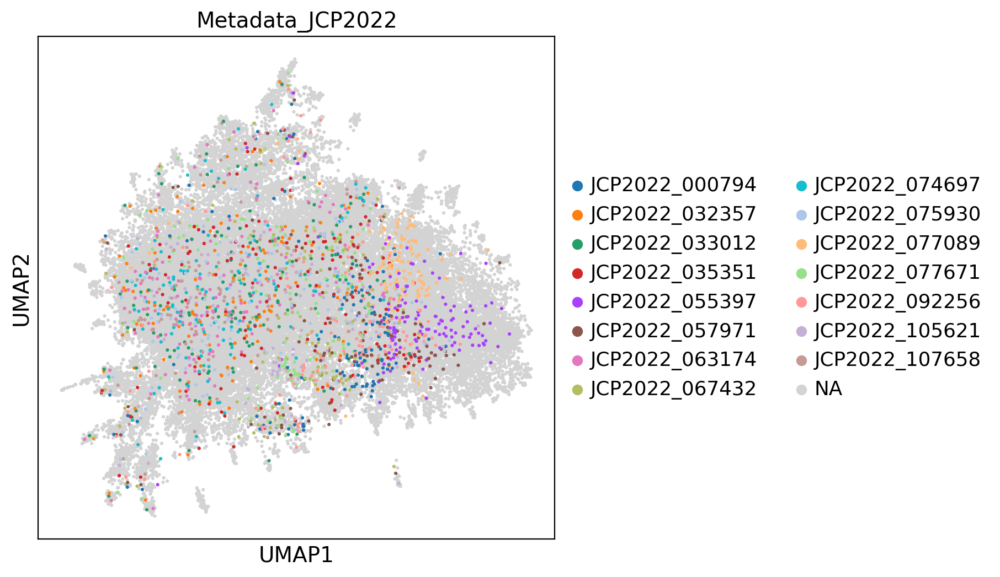

In [ ]:
#Plot Metadata_source
sc.pl.umap(subset_adata, color="Metadata_Source", s = 15)

# Convert Metadata_JCP2022 to category type
subset_adata.obs["Metadata_JCP2022"] = subset_adata.obs["Metadata_JCP2022"].astype("category")

# Randomly sample a smaller set of categories
jcp_examples = random.sample(subset_adata.obs["Metadata_JCP2022"].unique().tolist(), 15)

# Assign none to categories not in the random sample to be grey
subset_adata.obs["Metadata_JCP2022"] = [jcp if jcp in jcp_examples else None for jcp in subset_adata.obs["Metadata_JCP2022"].values]

# Plot UMAP with Metadata_JCP2022 as color
sc.pl.umap(subset_adata, color="Metadata_JCP2022", s = 20)

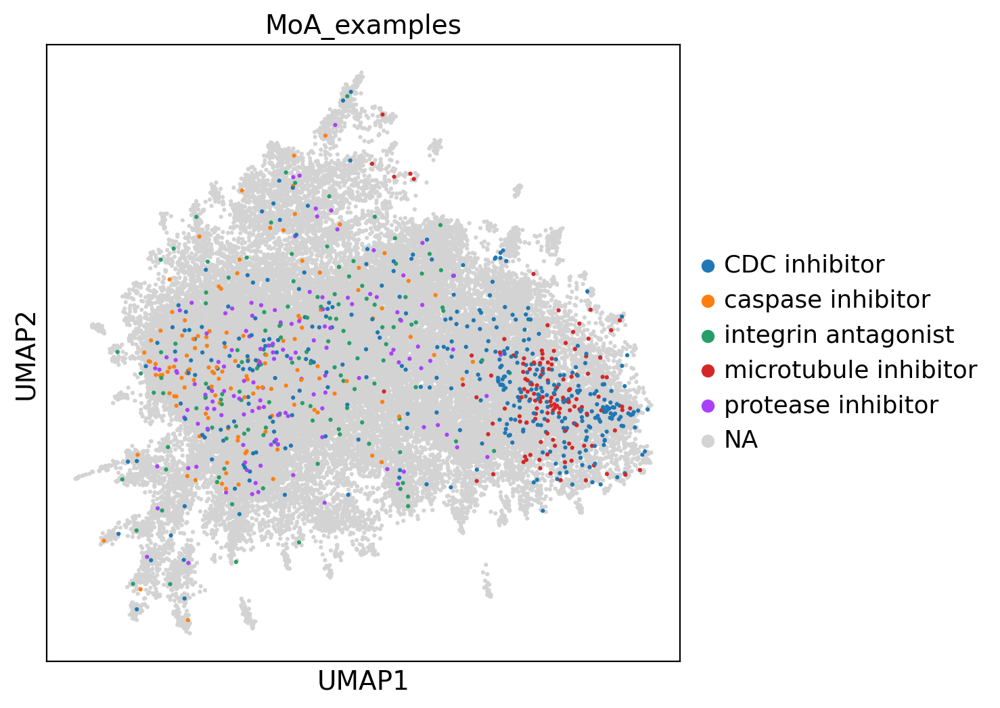

In [ ]:
moa_examples = ["CDC inhibitor", "caspase inhibitor", "integrin antagonist", "microtubule inhibitor", "protease inhibitor"]
subset_adata.obs["MoA_examples"] = [moa if moa in moa_examples else None for moa in subset_adata.obs.Metadata_moa]
subset_adata.obs["MoA_examples"] = subset_adata.obs["MoA_examples"].astype("category")
sc.pl.umap(subset_adata, color="MoA_examples", s=20)

In [ ]:
#Save the resulting adata to file
all_sources_adata.write('./run_4_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

### Run 5: Transport iteratively all sources from target2_moa into source 2 and visualize result with use_pca = False for 3000 epochs, batch size = 512 and sigma = 0.001

In [ ]:
# Load target2_moa
target2_moa = load_adata("/content/drive/MyDrive/datasets/Tim_target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")

#setup
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)

# init all stuff
ot_cfm_model = create_ot_cfm_model(adata=target2_moa, use_pca=False)
ot_cfm_optimizer = create_ot_cfm_optimizer(ot_cfm_model)
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=0.001)

cpu


100%|██████████| 3000/3000 [30:48<00:00,  1.62it/s]


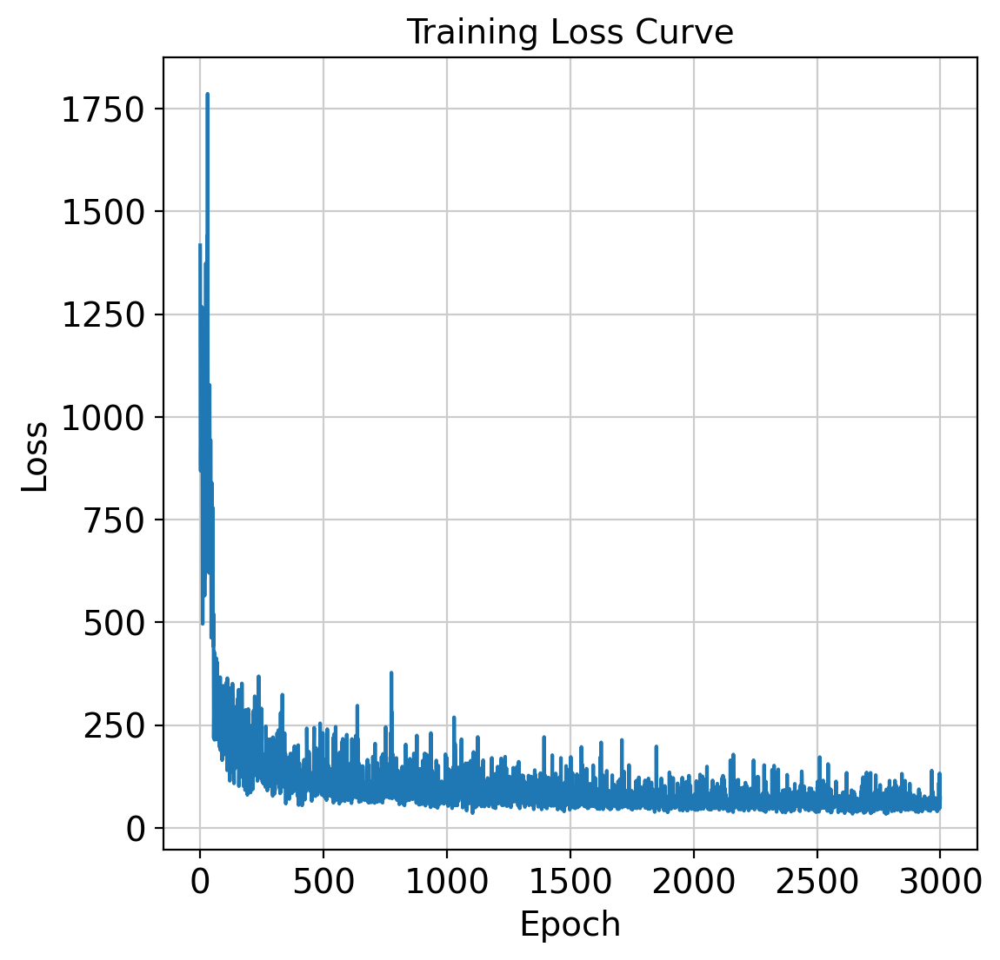

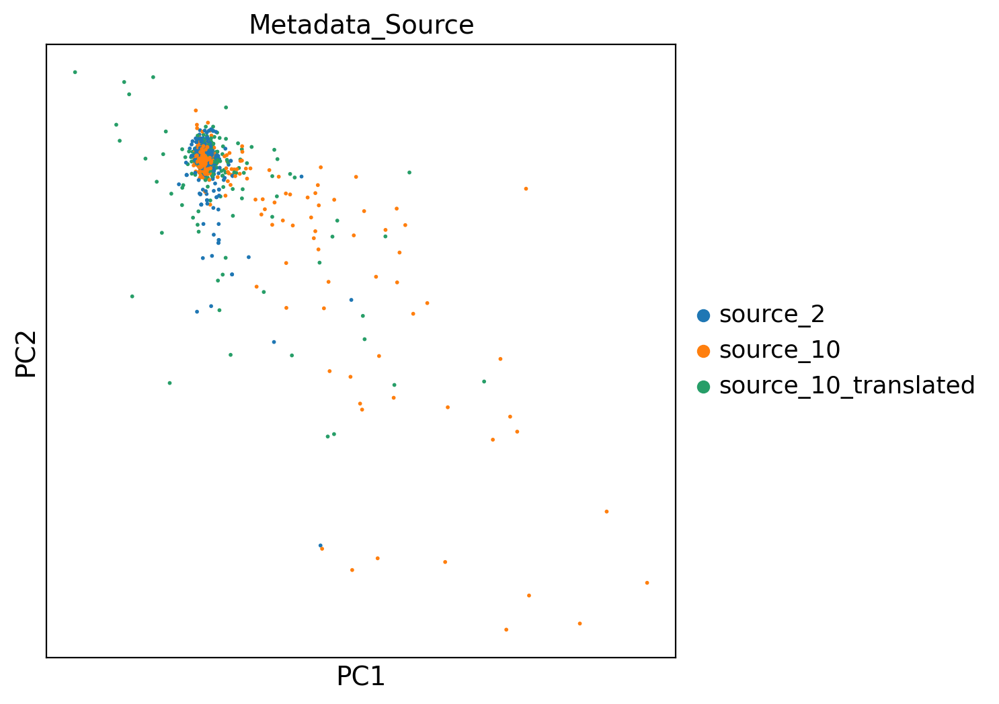

100%|██████████| 3000/3000 [36:23<00:00,  1.37it/s]


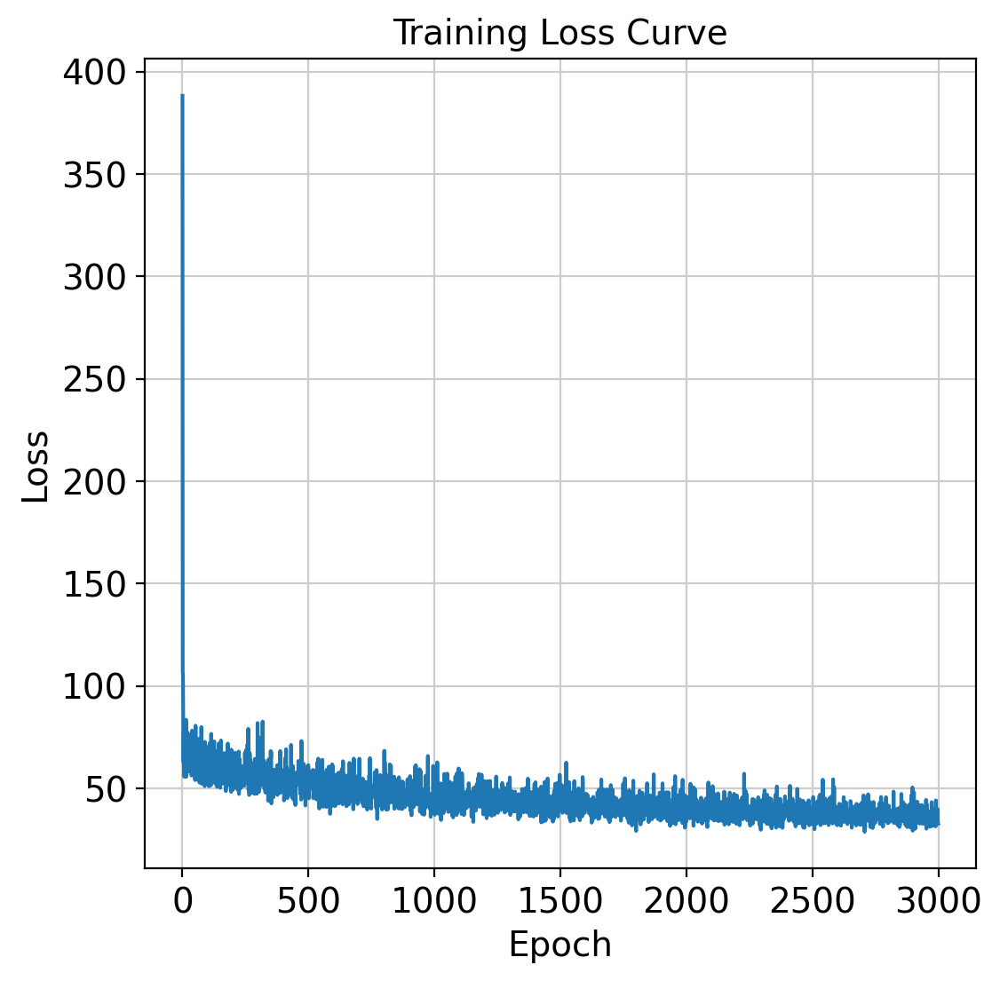

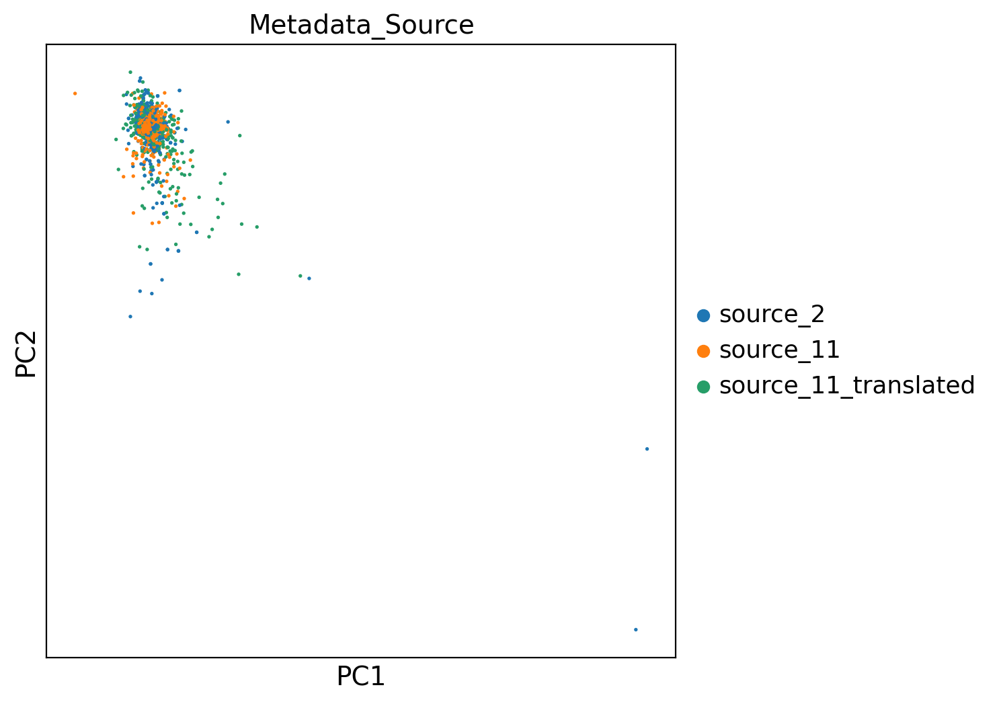

100%|██████████| 3000/3000 [30:59<00:00,  1.61it/s]


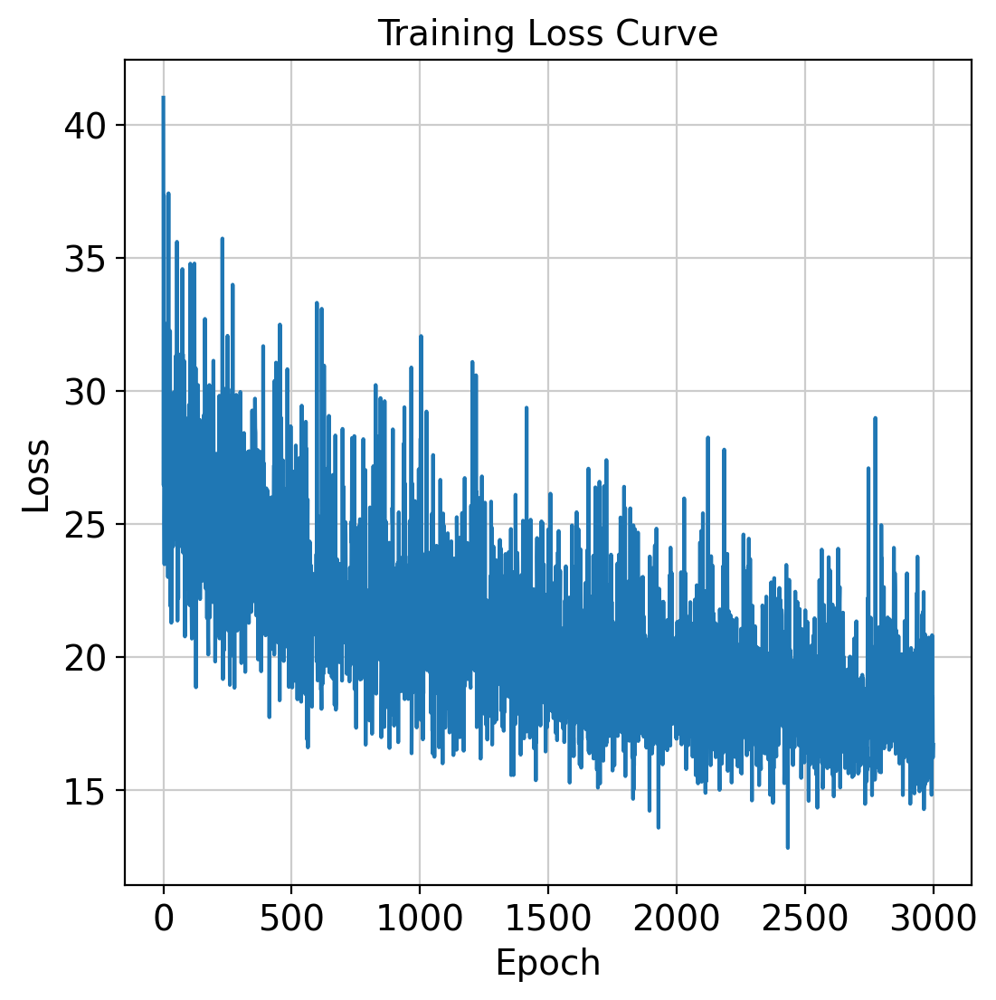

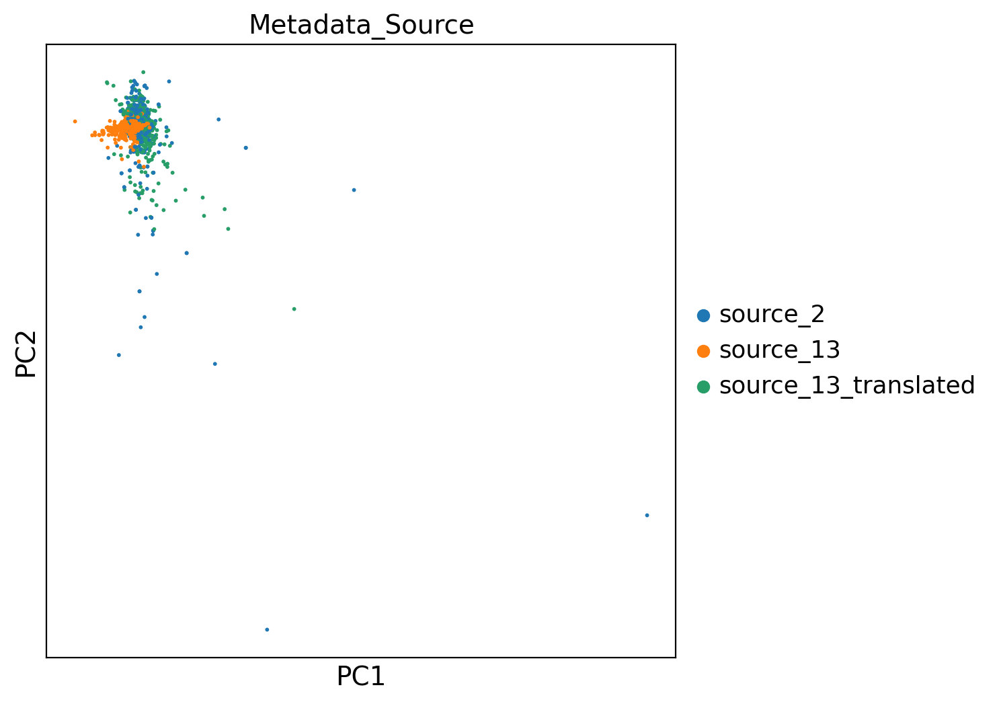

100%|██████████| 3000/3000 [52:00<00:00,  1.04s/it]


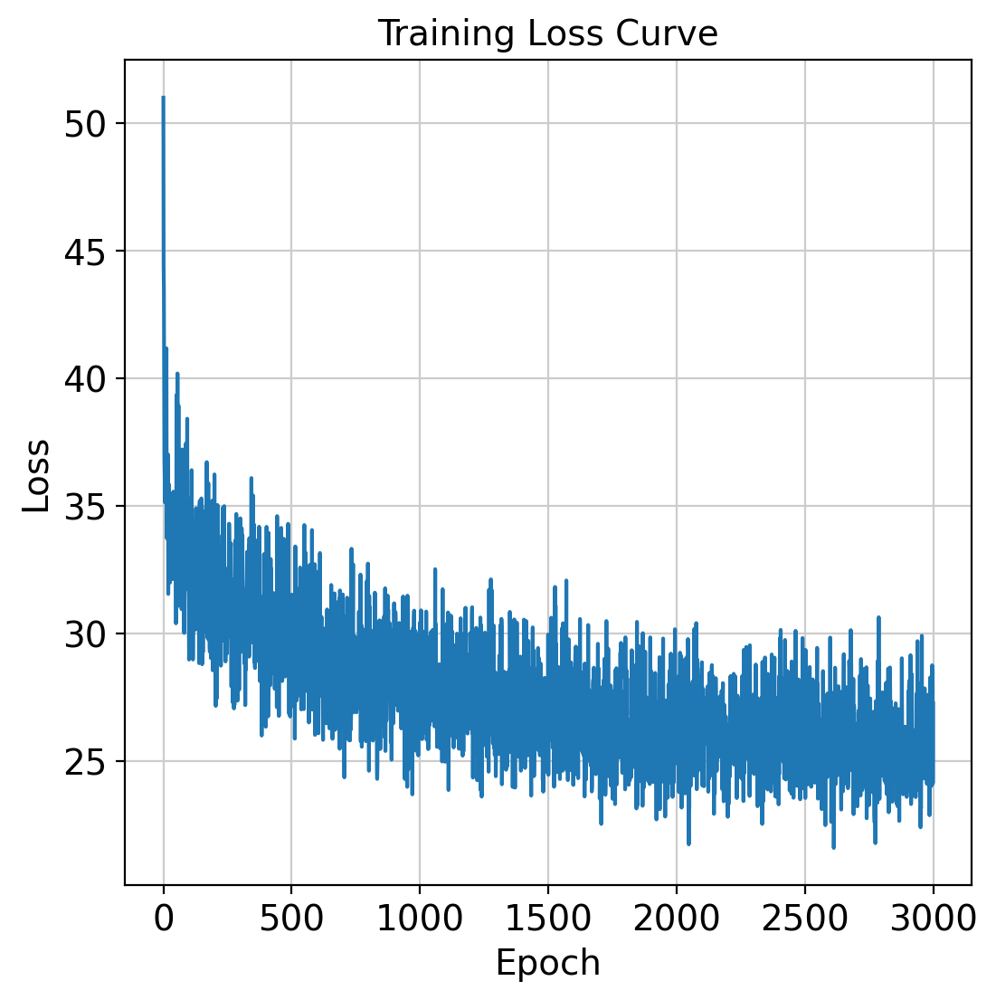

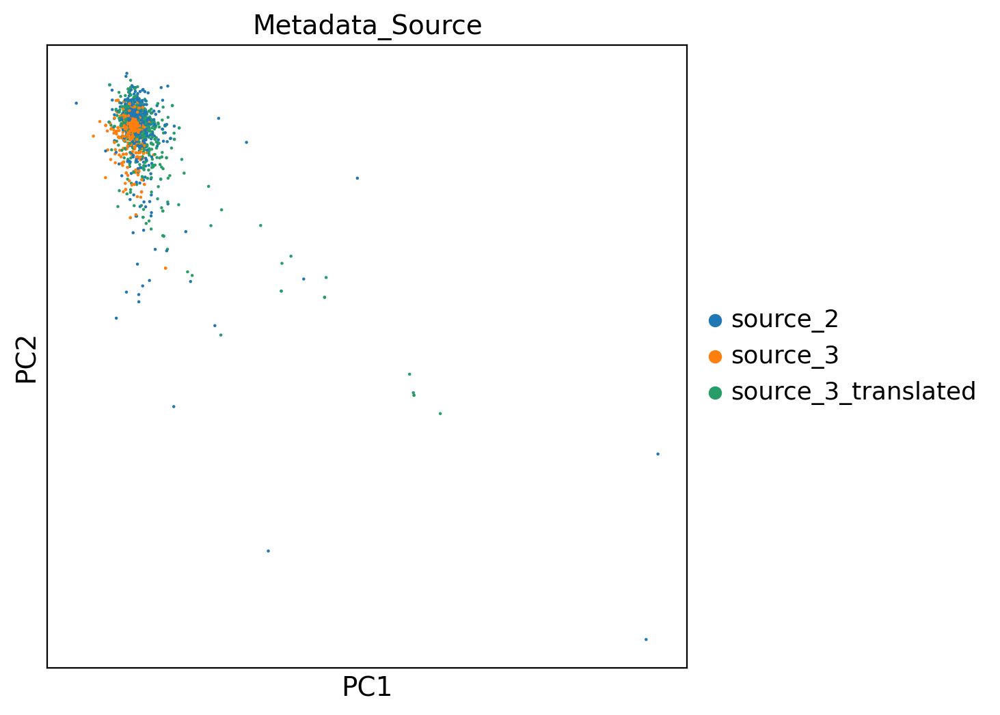

100%|██████████| 3000/3000 [51:09<00:00,  1.02s/it]


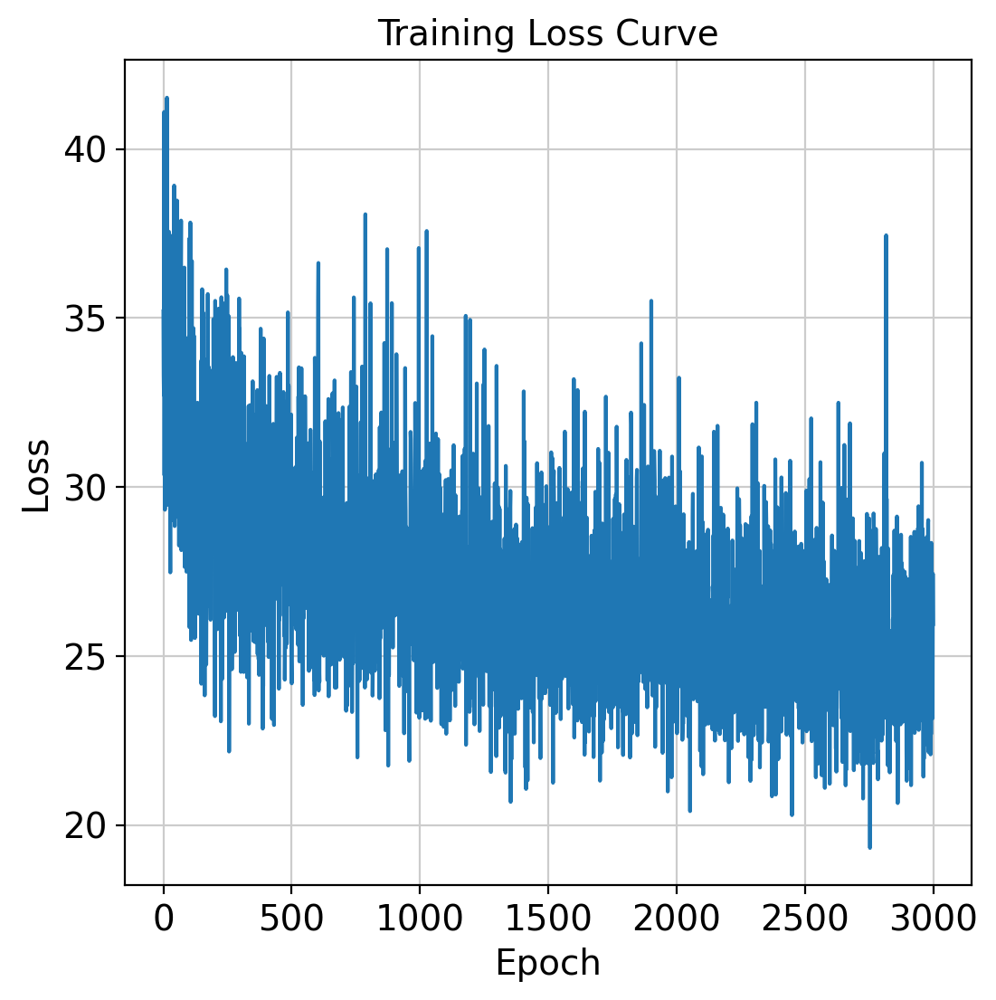

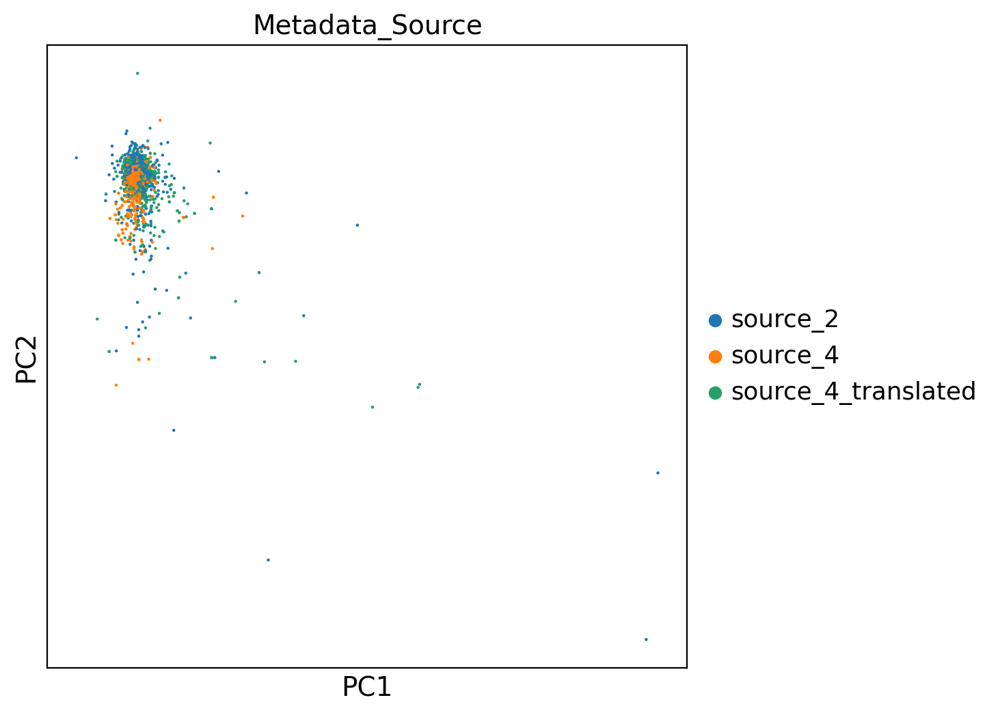

100%|██████████| 3000/3000 [50:39<00:00,  1.01s/it]


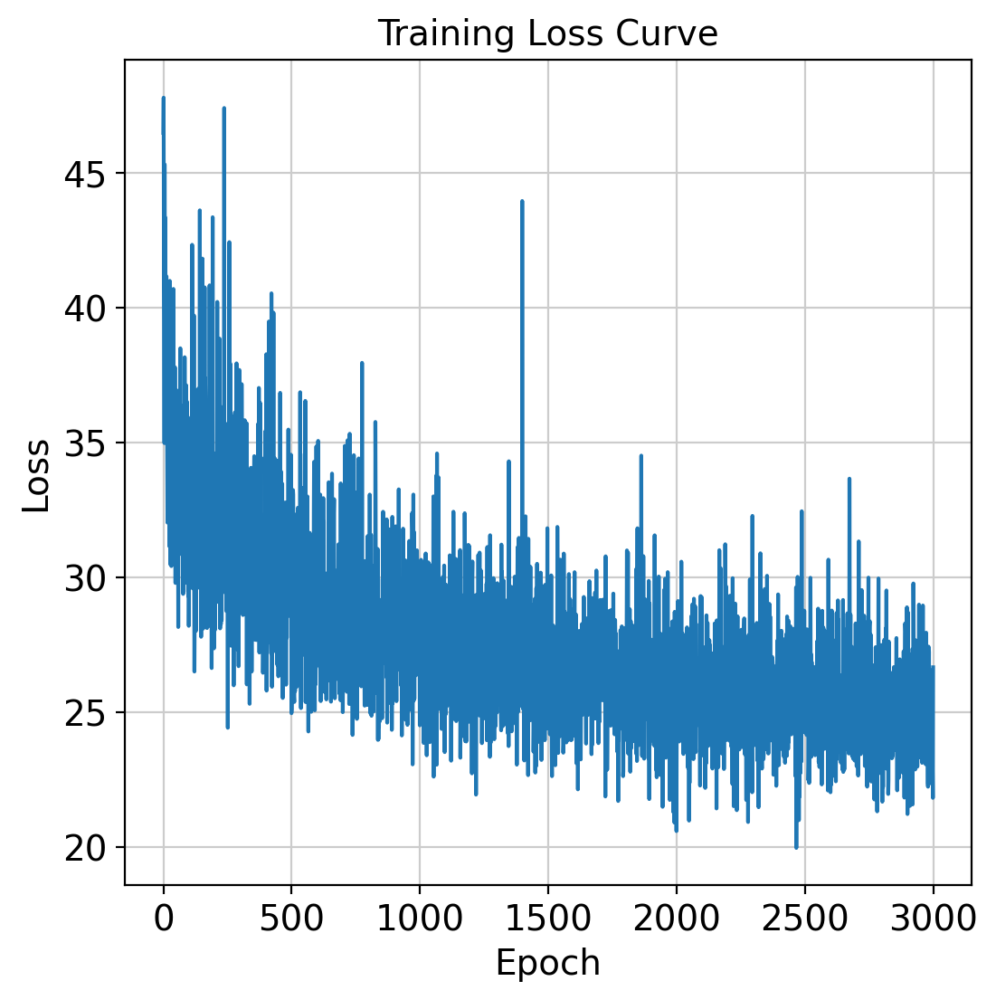

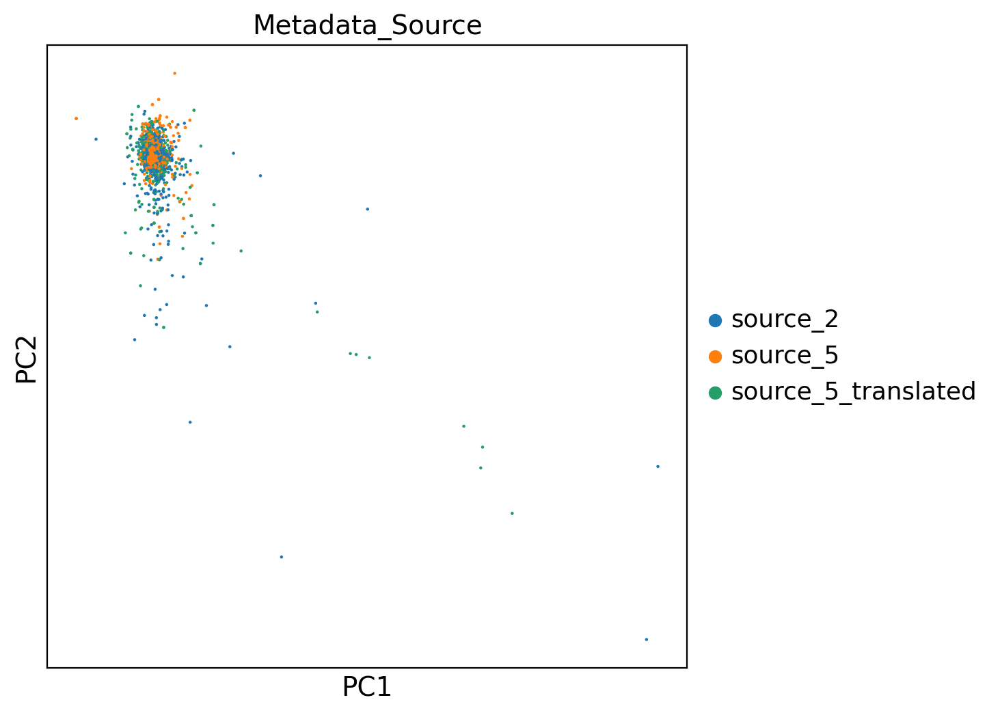

100%|██████████| 3000/3000 [50:40<00:00,  1.01s/it]


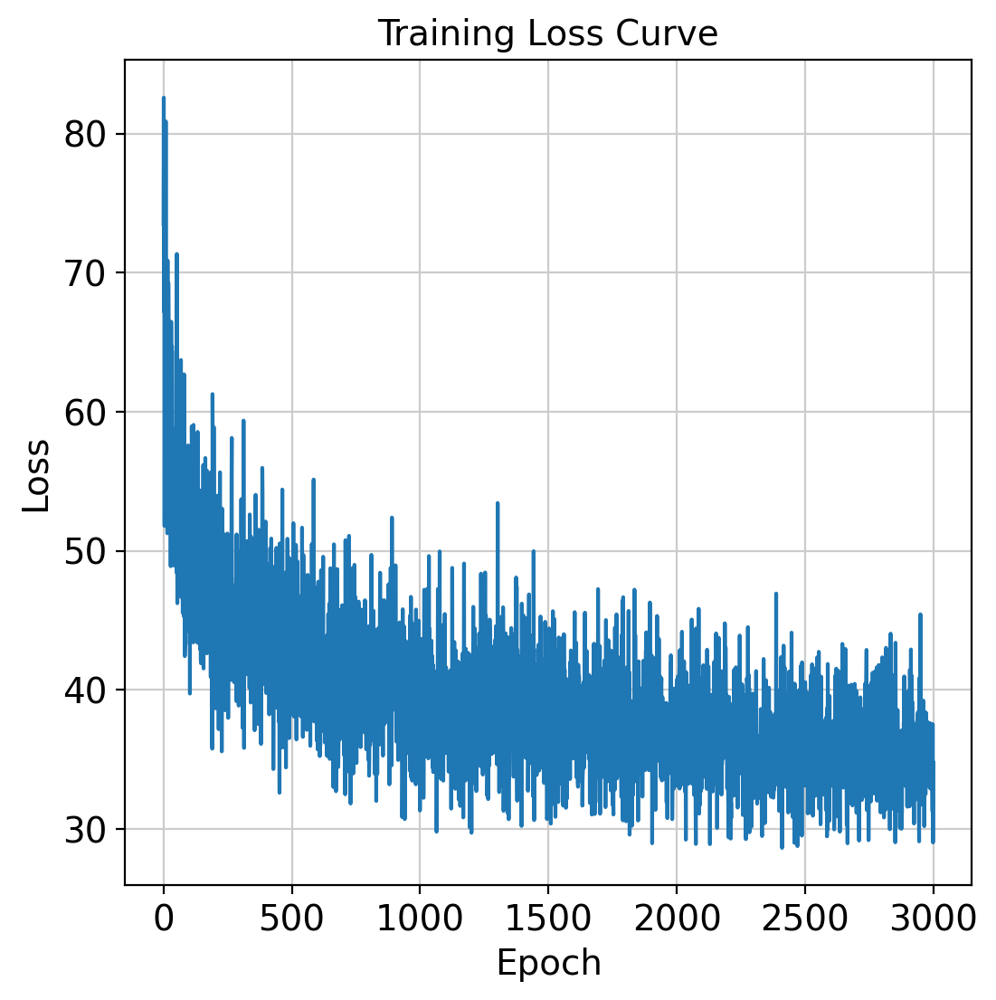

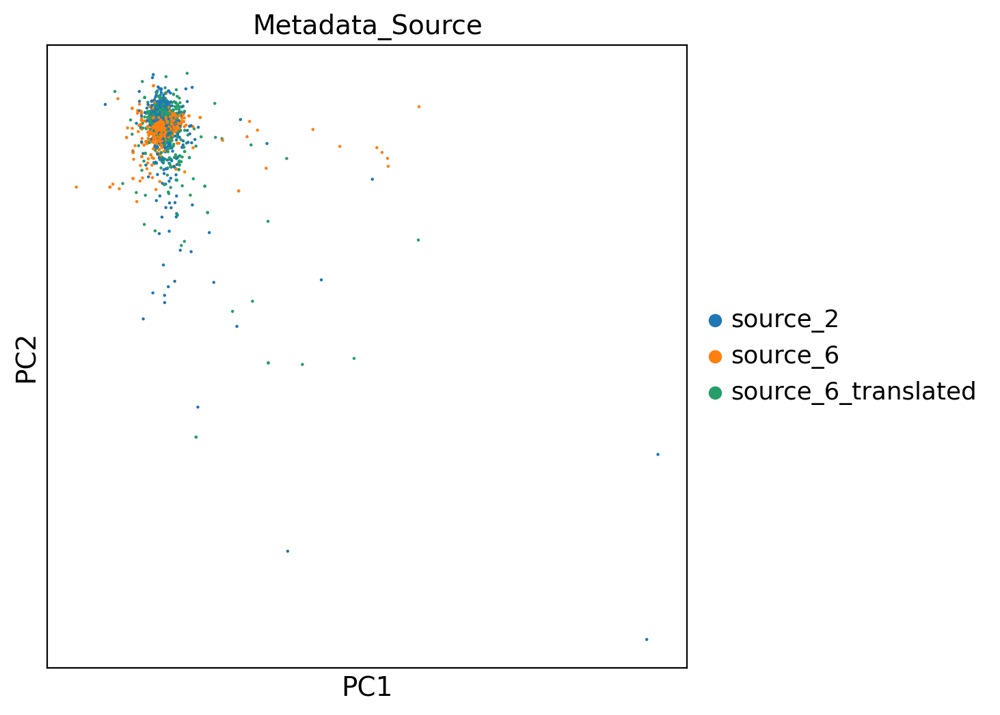

100%|██████████| 3000/3000 [35:57<00:00,  1.39it/s]


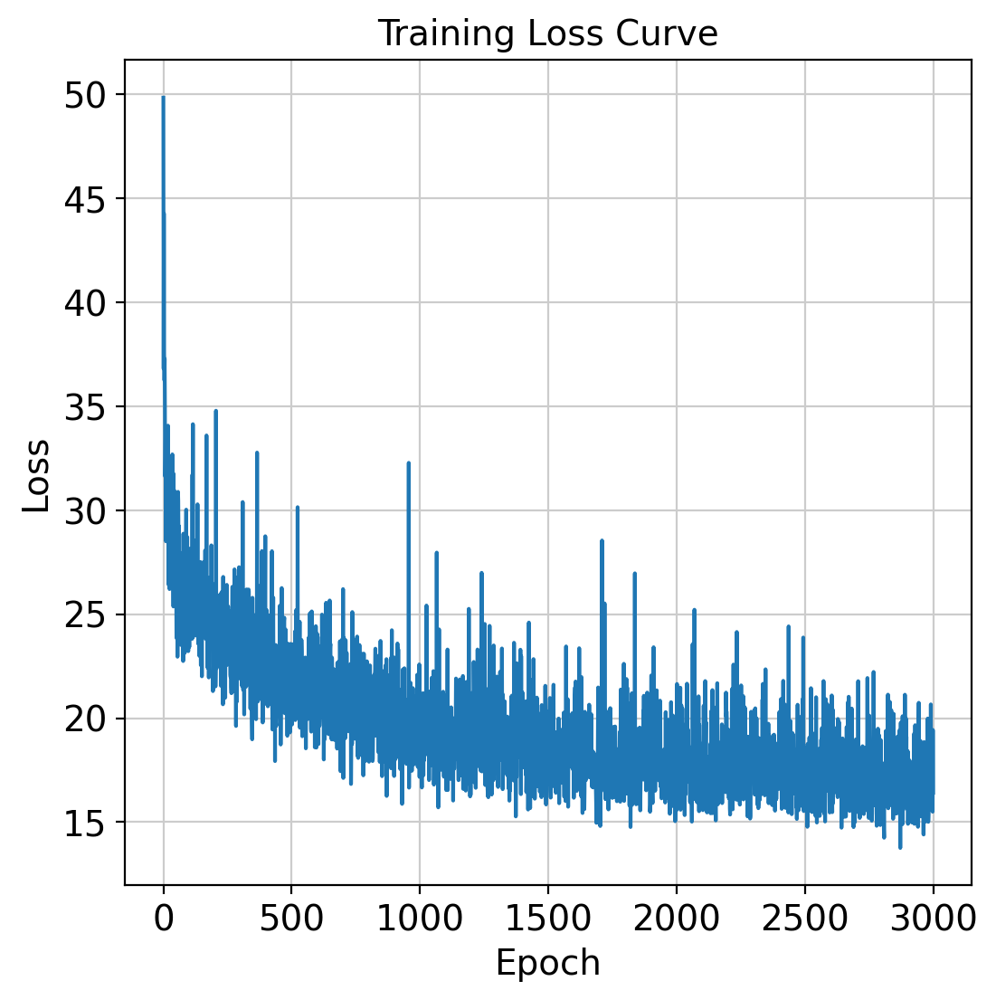

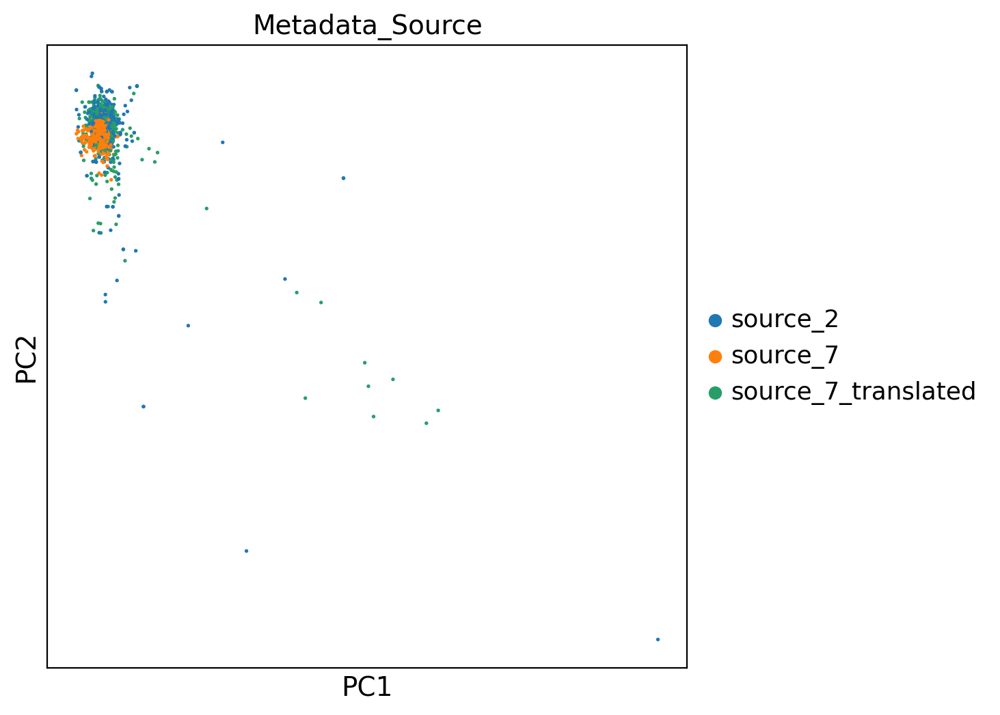

100%|██████████| 3000/3000 [21:56<00:00,  2.28it/s]


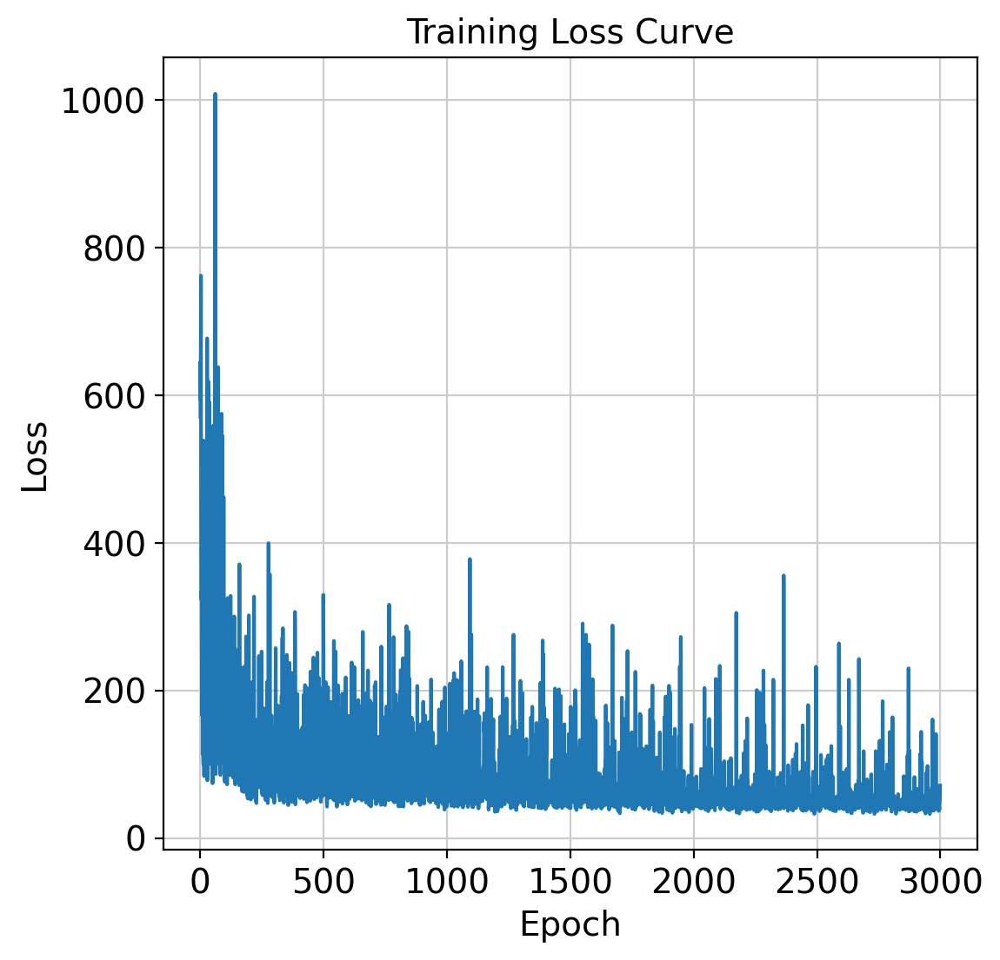

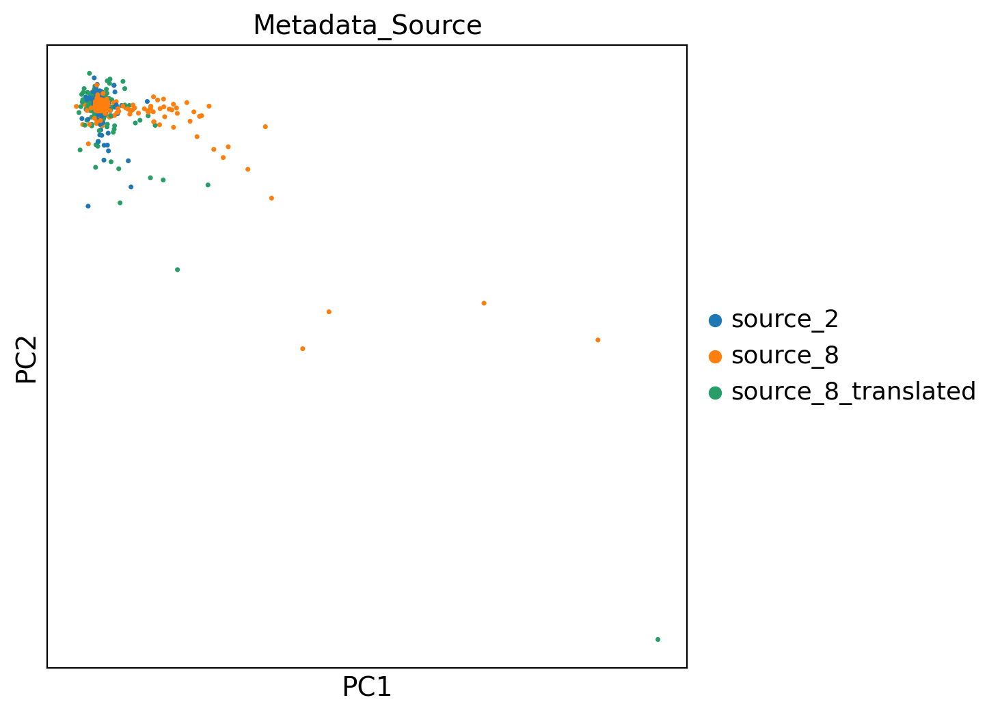

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Subset the data for the current source
    source_data = target2_moa[target2_moa.obs["Metadata_Source"] == source].copy()
    #print(source)

    # Create dataloader for the current source
    dataloader = create_training_dataloader(target2_moa, source, "source_2", batch_size=512, use_pca=False)

    # Train ot_cfm_model for the current source
    trained_ot_cfm_model = train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=3000, plot_loss=True)

    # Save the trained ot_cfm_model
    save_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_5_ot_cfm_single_cell_{source}_to_source_2.pt")

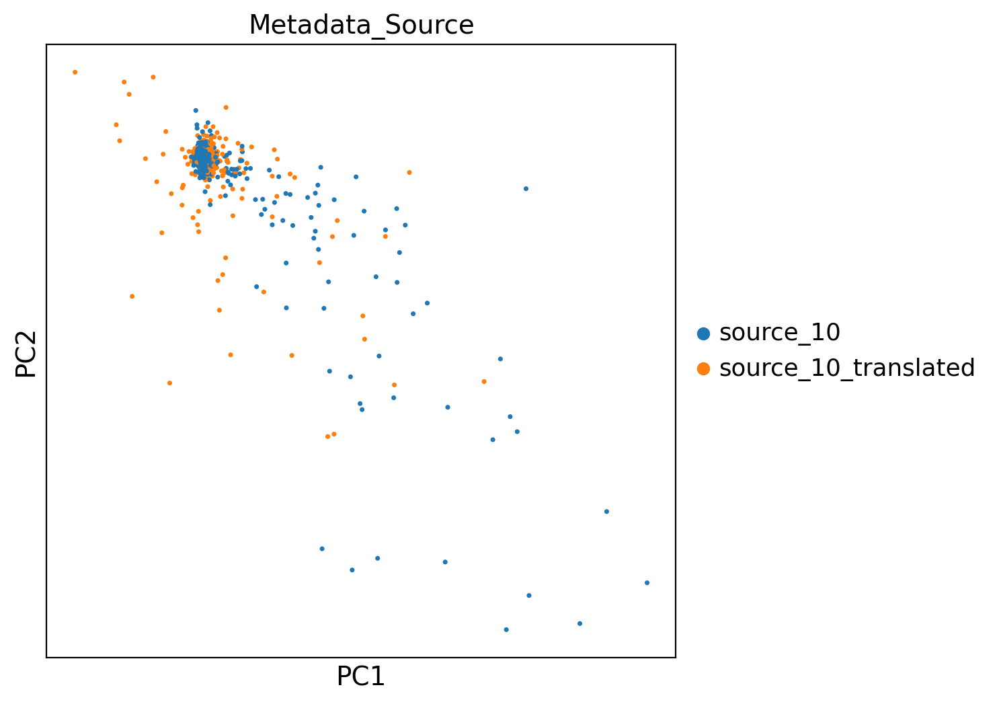

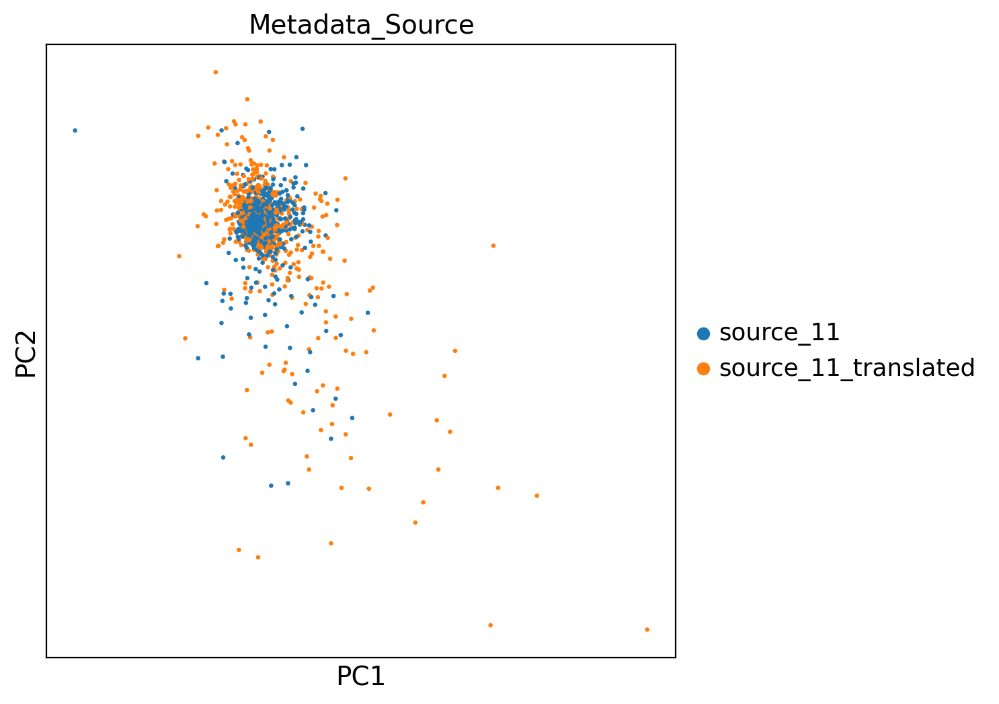

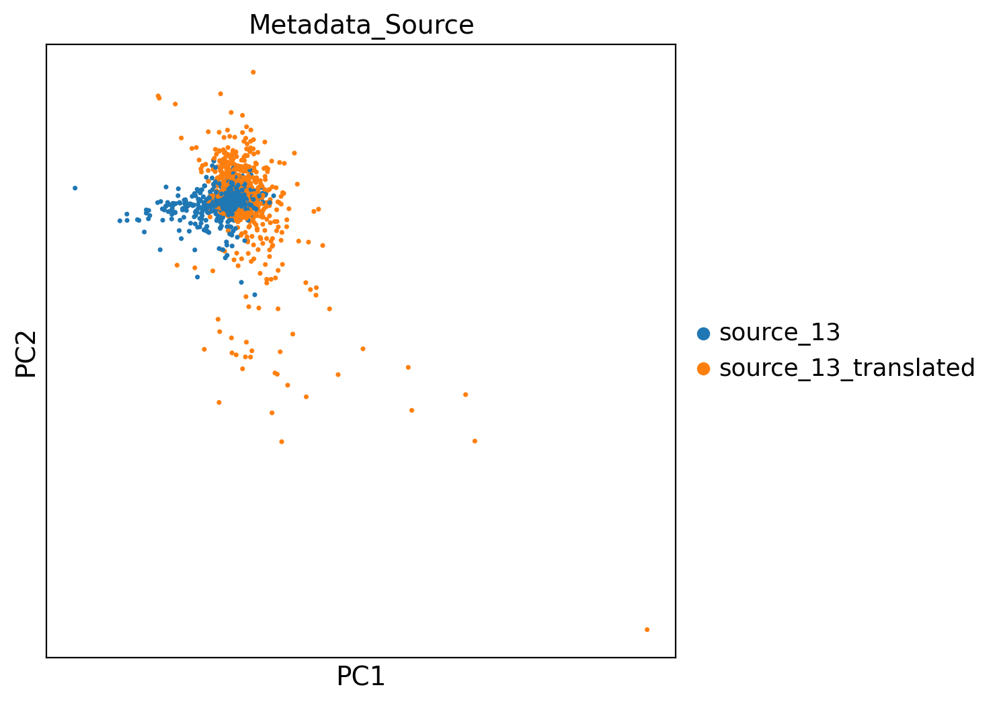

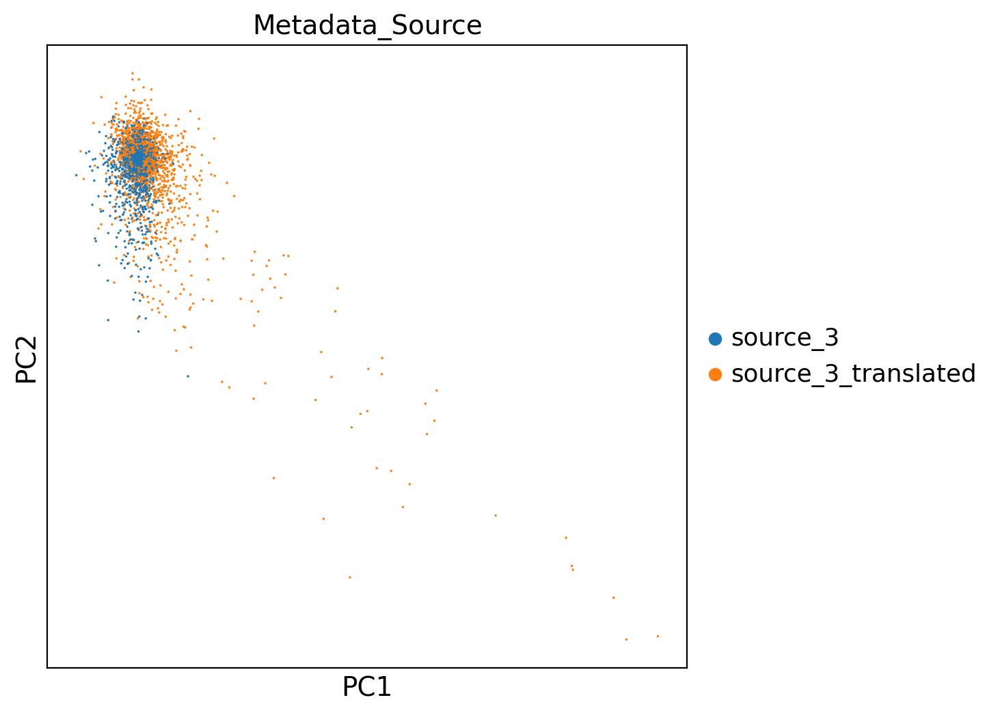

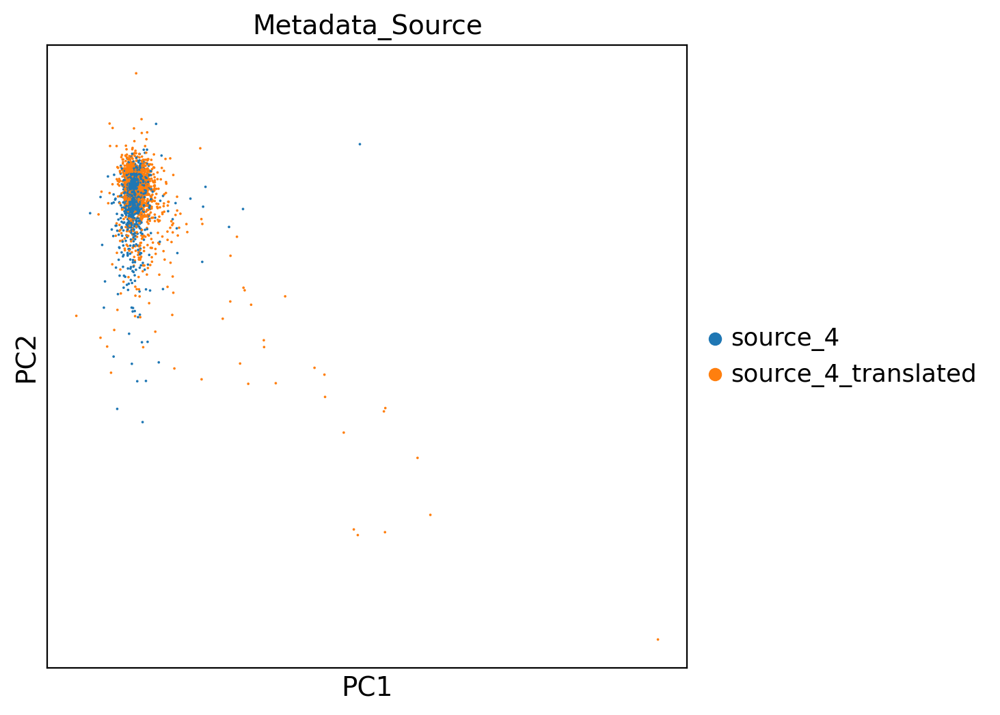

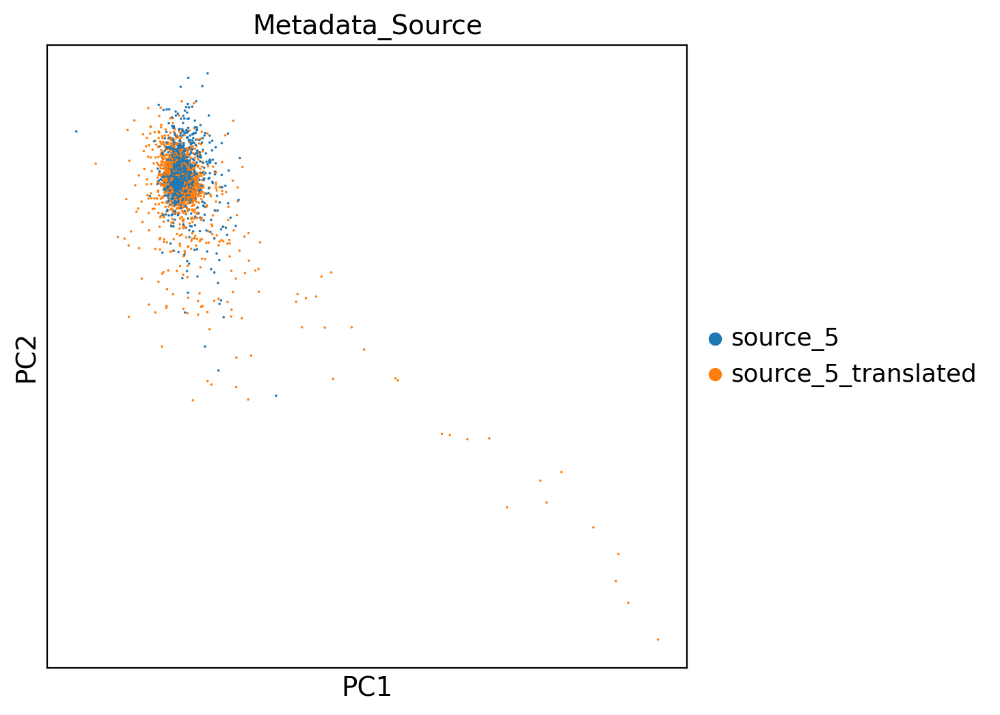

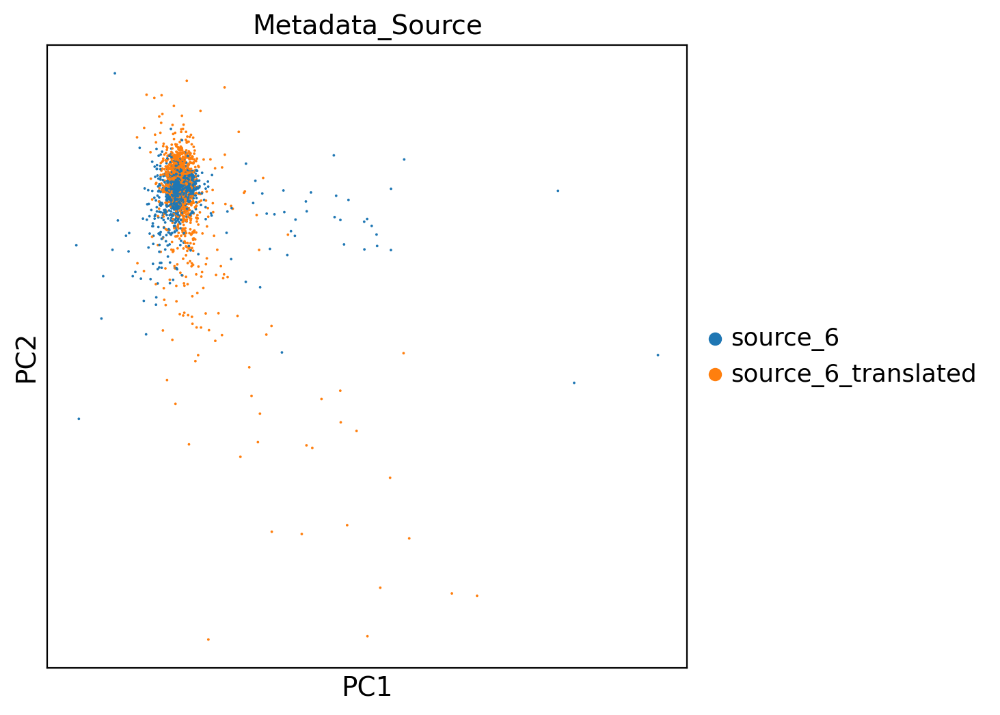

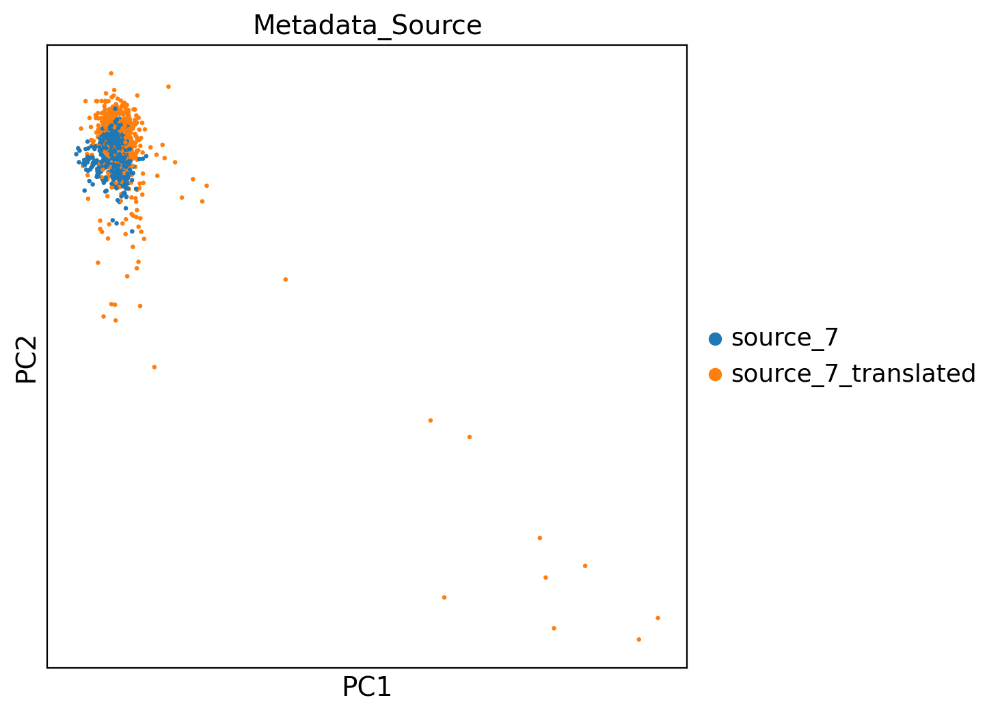

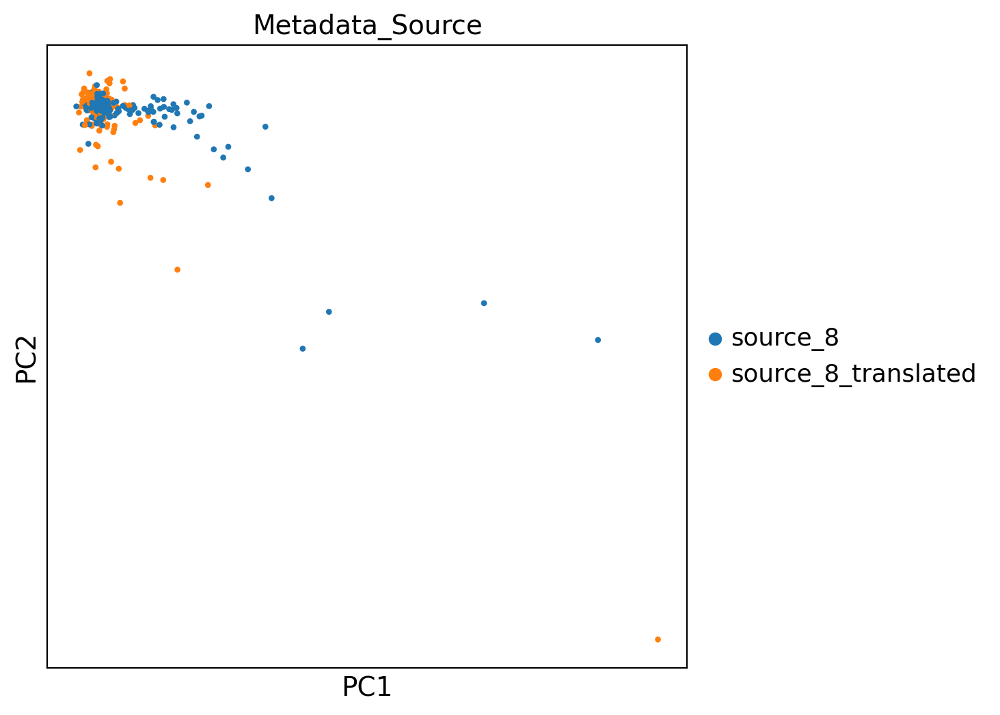

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Create dataloader for the current source
    dataloader = create_dataloader(target2_moa, source, batch_size=512, use_pca=False)

    # Load the model
    load_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_5_ot_cfm_single_cell_{source}_to_source_2.pt")

    # Perform translation for the current source
    translated_source_adata = transport(dataloader, ot_cfm_model, x1_label=source, device="cpu", save_adata_path=None)

    # Append to the list of translated sources
    translated_sources.append(translated_source_adata)

    # Plot PCA after transporting each source
    sc.pl.pca(translated_source_adata, color="Metadata_Source")

In [ ]:
all_sources_adata = sc.concat(translated_sources, axis=0)
print(all_sources_adata.shape)

(93624, 591)


In [ ]:
# Extract data corresponding to source_2 from target2_moa
source_2_data = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].copy()
#print(source_2_data.shape)

# Save translated source as a separate Adata
translated_source_adata = sc.concat([all_sources_adata, source_2_data], join="outer")
translated_source_adata.obsm["X_pca"] = np.concatenate((all_sources_adata.obsm["X_pca"], source_2_data.X), axis=0)

all_sources_adata = translated_source_adata
print(all_sources_adata.shape)
all_sources_adata.obs

(97452, 1182)


,Metadata_Source,Metadata_moa,Metadata_JCP2022,Metadata_Microscope_Name,Metadata_Plate,Metadata_Well,Metadata_Batch,Metadata_InChIKey,Metadata_InChI,Metadata_InChIKey_standardized,...,Metadata_disease_area,Metadata_indication,Metadata_Widefield_vs_Confocal,Metadata_Excitation_Type,Metadata_Objective_NA,Metadata_N_Brightfield_Planes_Min,Metadata_N_Brightfield_Planes_Max,Metadata_Distance_Between_Z_Microns,Metadata_Sites_Per_Well,Metadata_Filter_Configuration
0,source_10_translated,CDK inhibitor|CHK inhibitor|PKC inhibitor,JCP2022_067441,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,source_10_translated,protein synthesis inhibitor,JCP2022_033400,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,source_10_translated,DNA synthesis inhibitor,JCP2022_109043,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,source_10_translated,EGFR inhibitor|PKC inhibitor,JCP2022_079715,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
source_2__1086293911__P20,source_2,calcium channel blocker,JCP2022_032357,CV8000,1086293911,P20,20210719_Batch_6,HSUGRBWQSSZJOP-UHFFFAOYSA-N,InChI=1S/C22H26N2O4S/c1-15(25)28-20-21(16-9-11...,HSUGRBWQSSZJOP-UHFFFAOYSA-N,...,cardiology,hypertension|angina pectoris,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P21,source_2,Bruton's tyrosine kinase (BTK) inhibitor,JCP2022_047545,CV8000,1086293911,P21,20210719_Batch_6,KXBDTLQSDKGAEB-UHFFFAOYSA-N,InChI=1S/C22H22FN5O3/c1-3-20(29)25-16-5-4-6-17...,KXBDTLQSDKGAEB-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P22,source_2,cyclooxygenase inhibitor,JCP2022_043099,CV8000,1086293911,P22,20210719_Batch_6,JZFPYUNJRRFVQU-UHFFFAOYSA-N,"InChI=1S/C13H9F3N2O2/c14-13(15,16)8-3-1-4-9(7-...",JZFPYUNJRRFVQU-UHFFFAOYSA-N,...,rheumatology|neurology/psychiatry,joint pain|muscle pain,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P23,source_2,growth factor receptor inhibitor,JCP2022_050516,CV8000,1086293911,P23,20210719_Batch_6,LNFZRMDSZJCZTG-UHFFFAOYSA-N,InChI=1S/C28H21F4N5O2/c1-15-4-6-19(35-27(39)37...,LNFZRMDSZJCZTG-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A


In [ ]:
"""# Extract data corresponding to source_2 from target2_moa
source_2_data = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].copy()

# Concatenate with existing all_sources_adata
all_sources_adata = sc.concat([all_sources_adata, source_2_data])

# Print shape
print(all_sources_adata.shape)

all_sources_adata.obs"""

(97452, 0)


,Metadata_Source,Metadata_moa,Metadata_JCP2022,Metadata_Microscope_Name
0,source_10_translated,PI3K inhibitor,JCP2022_013856,CV8000
1,source_10_translated,control vehicle,JCP2022_033924,CV8000
2,source_10_translated,cyclooxygenase inhibitor,JCP2022_043099,CV8000
3,source_10_translated,adrenergic receptor antagonist|serotonin recep...,JCP2022_068606,CV8000
4,source_10_translated,glutamate receptor antagonist,JCP2022_023781,CV8000
...,...,...,...,...
source_2__1086293911__P20,source_2,calcium channel blocker,JCP2022_032357,CV8000
source_2__1086293911__P21,source_2,Bruton's tyrosine kinase (BTK) inhibitor,JCP2022_047545,CV8000
source_2__1086293911__P22,source_2,cyclooxygenase inhibitor,JCP2022_043099,CV8000
source_2__1086293911__P23,source_2,growth factor receptor inhibitor,JCP2022_050516,CV8000


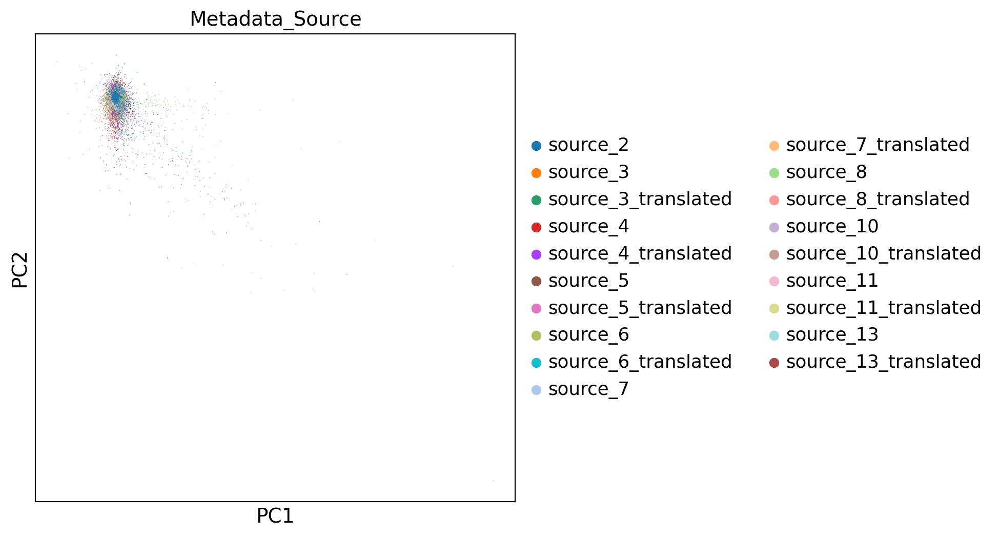

In [ ]:
# Plot PCA with all transported sources
sc.pl.pca(all_sources_adata, color="Metadata_Source")

In [ ]:
all_sources_adata = sc.read_h5ad('./run_5_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

In [ ]:
#subset all_sources_adata to only contain translated_sources and source2 and plot UMAP showing Metadata_Source again
selected_sources = ['source_2', 'source_3_translated', 'source_4_translated', 'source_5_translated', 'source_6_translated', 'source_7_translated', 'source_8_translated', 'source_10_translated', 'source_11_translated', 'source_13_translated']
subset_adata = all_sources_adata[all_sources_adata.obs['Metadata_Source'].isin(selected_sources)].copy()

# UMAP for the subsetted adata
sc.pp.neighbors(subset_adata, use_rep="X_pca")
sc.tl.umap(subset_adata)

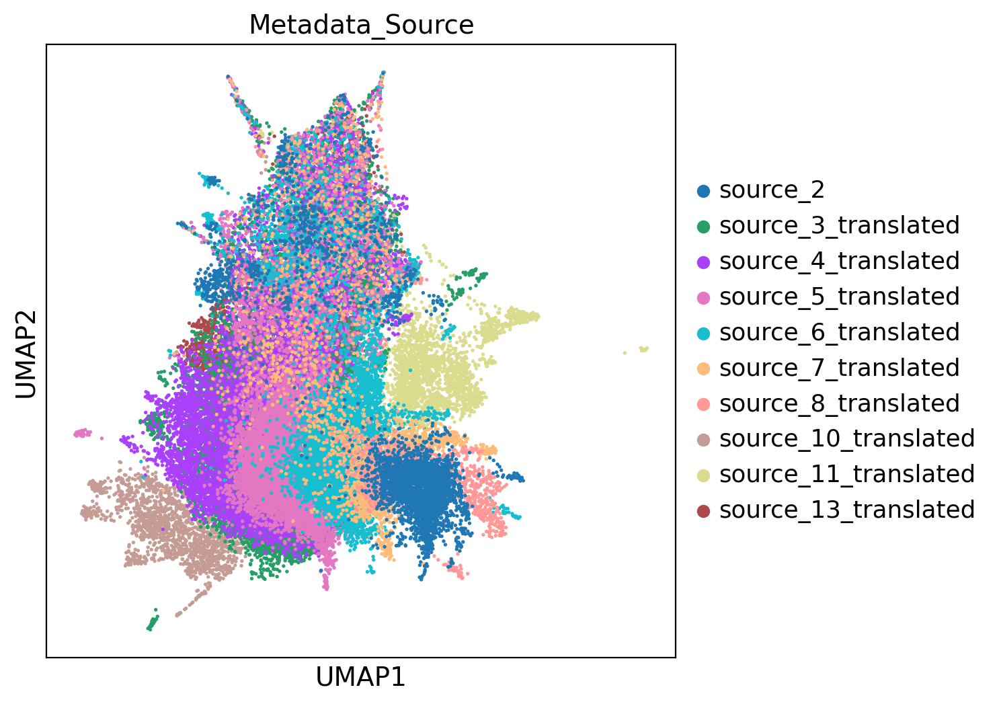

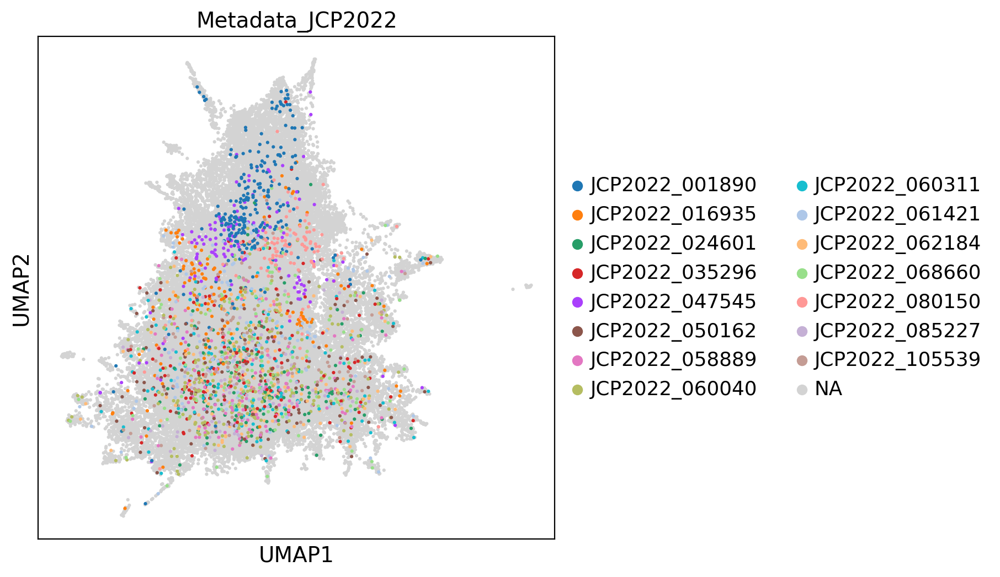

In [ ]:
#Plot Metadata_source
sc.pl.umap(subset_adata, color="Metadata_Source", s = 15)

# Convert Metadata_JCP2022 to category type
subset_adata.obs["Metadata_JCP2022"] = subset_adata.obs["Metadata_JCP2022"].astype("category")

# Randomly sample a smaller set of categories
jcp_examples = random.sample(subset_adata.obs["Metadata_JCP2022"].unique().tolist(), 15)

# Assign none to categories not in the random sample to be grey
subset_adata.obs["Metadata_JCP2022"] = [jcp if jcp in jcp_examples else None for jcp in subset_adata.obs["Metadata_JCP2022"].values]

# Plot UMAP with Metadata_JCP2022 as color
sc.pl.umap(subset_adata, color="Metadata_JCP2022", s = 20)

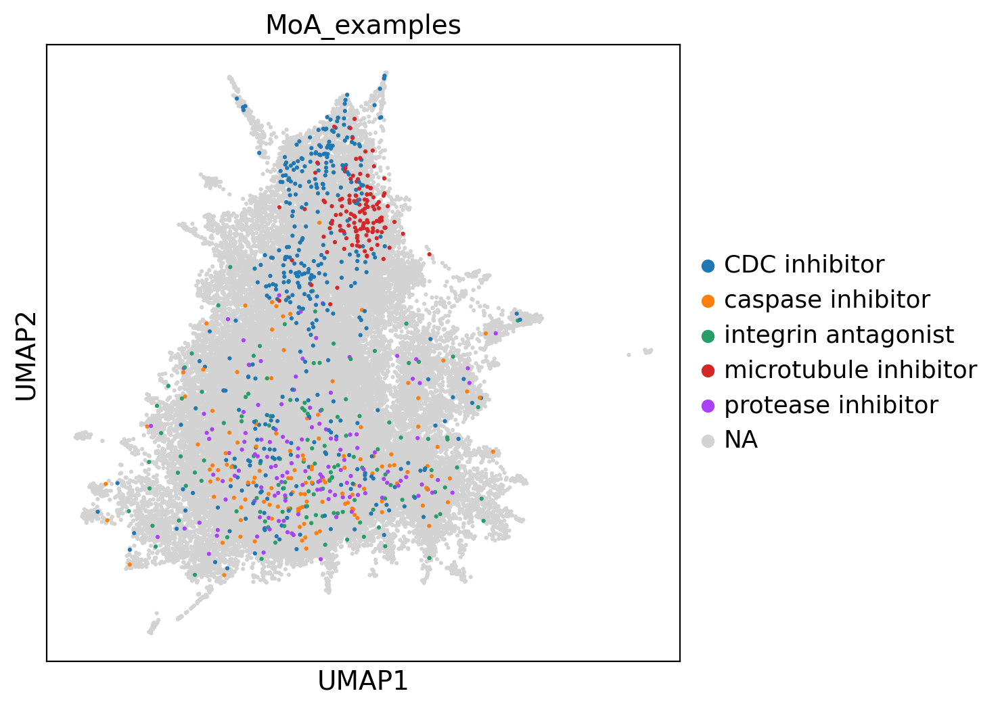

In [ ]:
moa_examples = ["CDC inhibitor", "caspase inhibitor", "integrin antagonist", "microtubule inhibitor", "protease inhibitor"]
subset_adata.obs["MoA_examples"] = [moa if moa in moa_examples else None for moa in subset_adata.obs.Metadata_moa]
subset_adata.obs["MoA_examples"] = subset_adata.obs["MoA_examples"].astype("category")
sc.pl.umap(subset_adata, color="MoA_examples", s=20)

In [ ]:
#Save the resulting adata to file
all_sources_adata.write('./run_5_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

### Run 6: Transport iteratively all sources from target2_moa into source 2 and visualize result with use_pca = True for 3000 epochs, batch size = 512 and sigma = 0.001

In [ ]:
# Load target2_moa
target2_moa = load_adata("/content/drive/MyDrive/datasets/Tim_target2_wellres_featuresimputed_druginfoadded_pycytominer.h5ad")

#setup
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)

# init all stuff
ot_cfm_model = create_ot_cfm_model(adata=target2_moa, use_pca=True)
ot_cfm_optimizer = create_ot_cfm_optimizer(ot_cfm_model)
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=0.001)

cpu


#### Training

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Subset the data for the current source
    source_data = target2_moa[target2_moa.obs["Metadata_Source"] == source].copy()

    # Create dataloader for the current source
    dataloader = create_training_dataloader(target2_moa, source, "source_2", batch_size=512, use_pca=True)

    # Train ot_cfm_model for the current source
    trained_ot_cfm_model = train_cfm(ot_cfm_model, ot_cfm_optimizer, FM, dataloader, epochs=3000, plot_loss=True)

    # Save the trained ot_cfm_model
    save_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_6_ot_cfm_single_cell_{source}_to_source_2.pt")

Output hidden; open in https://colab.research.google.com to view.

#### Interpolation

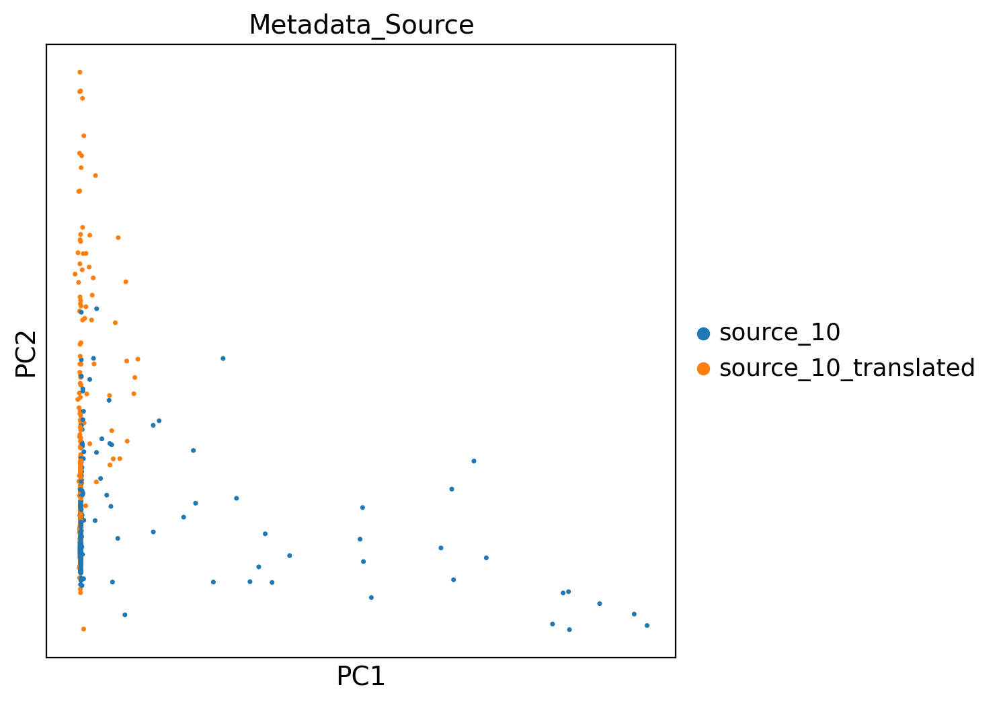

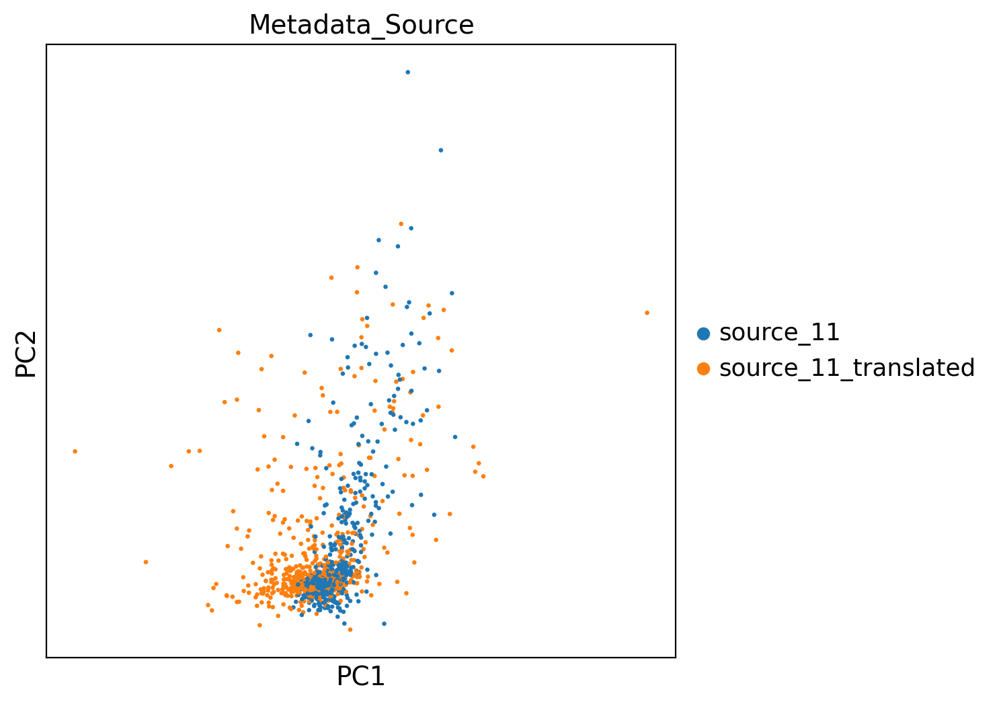

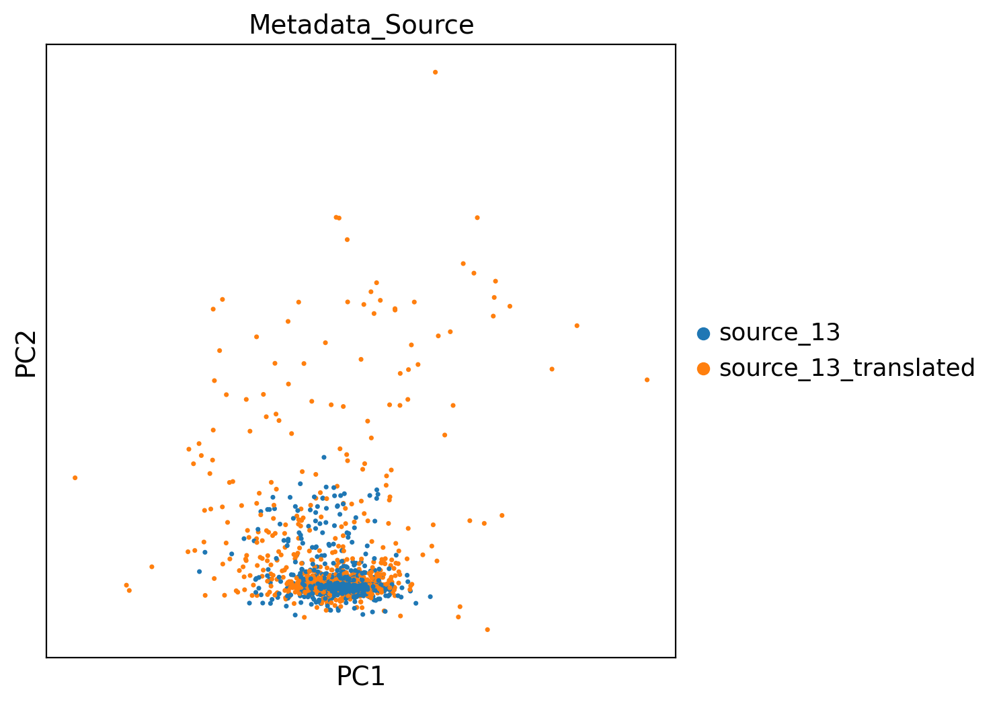

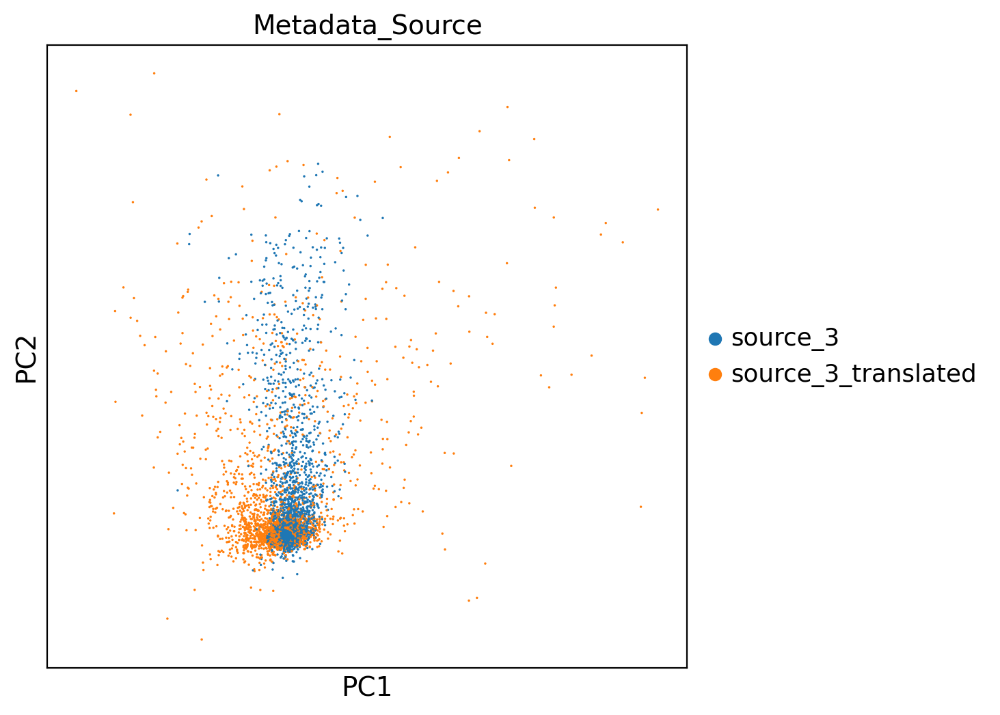

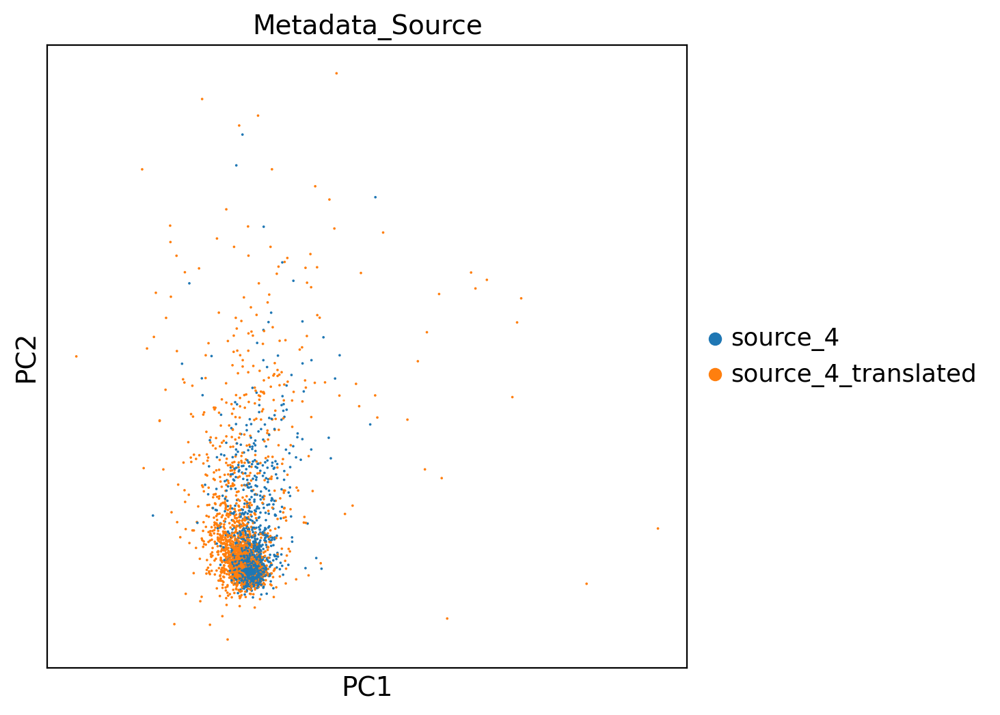

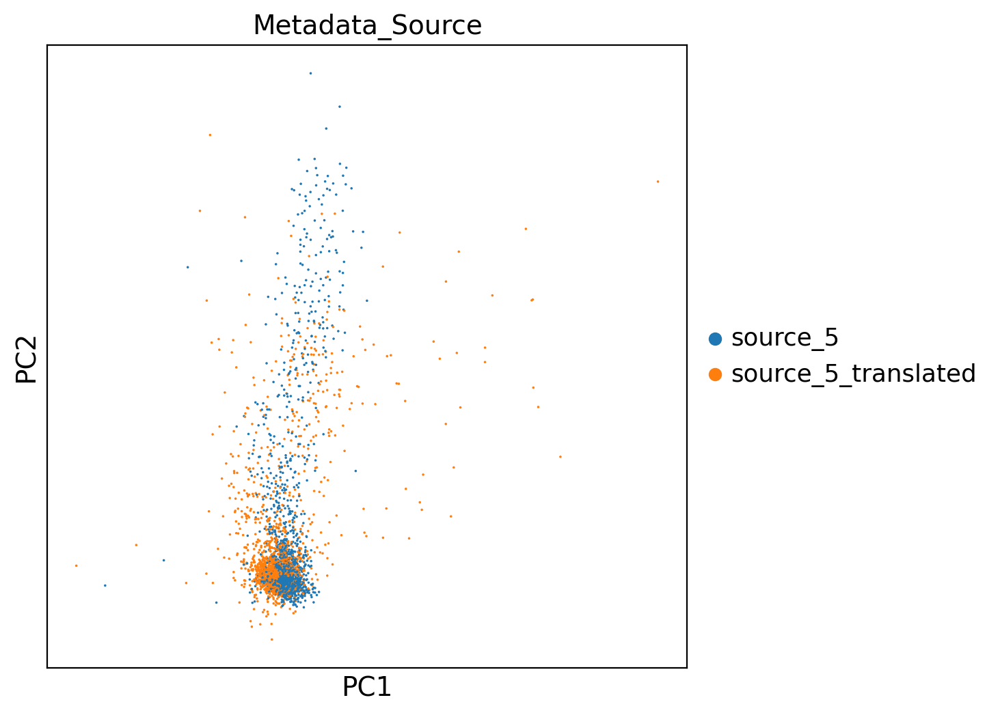

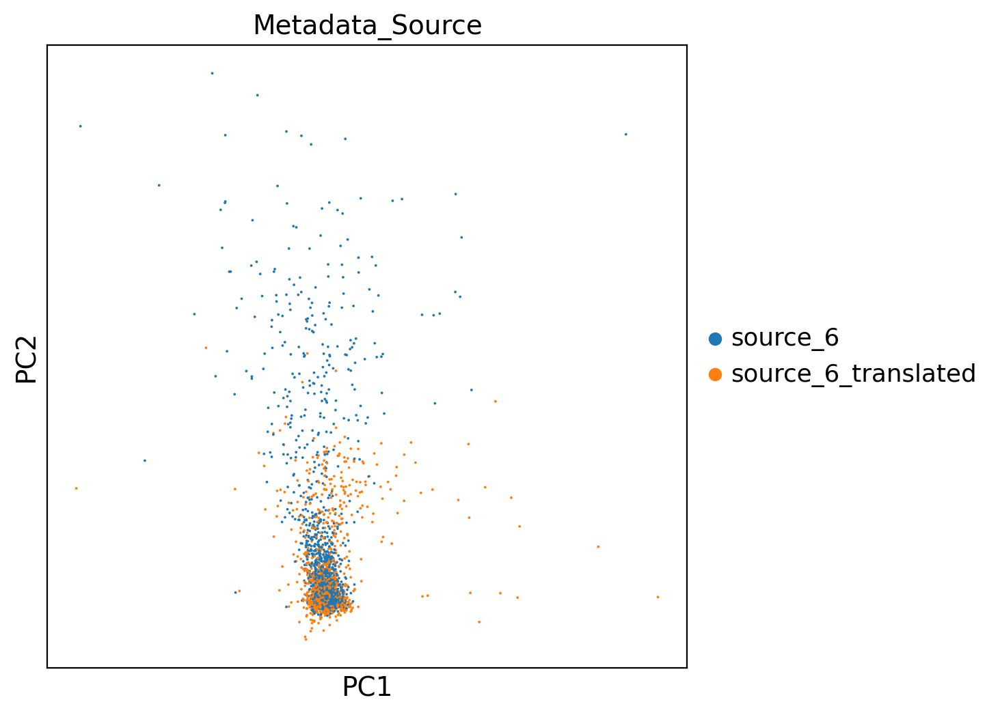

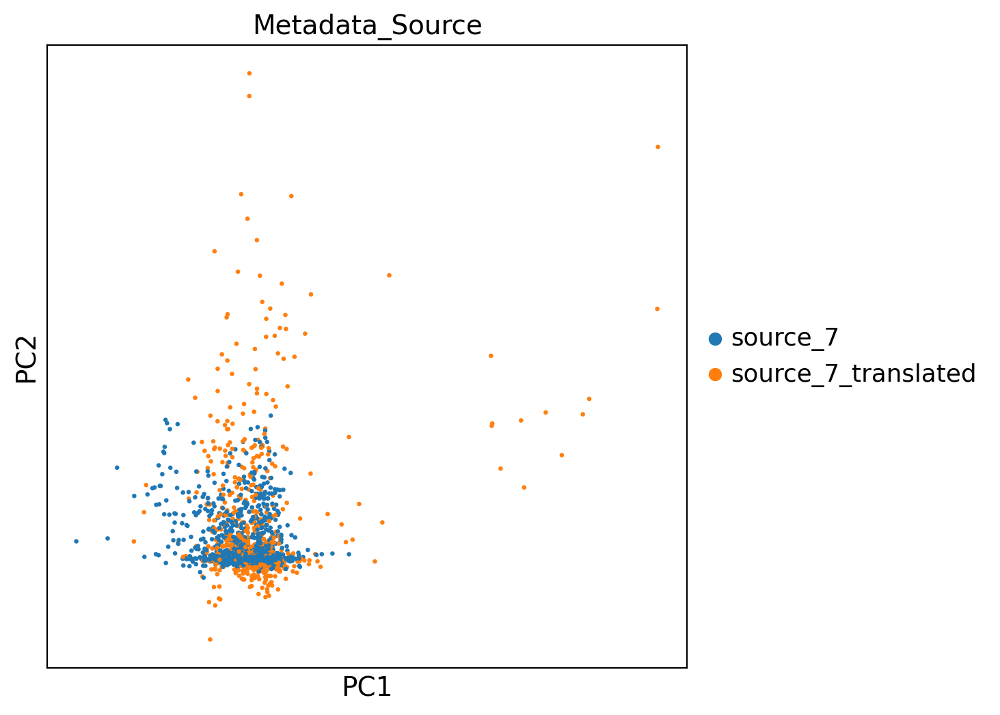

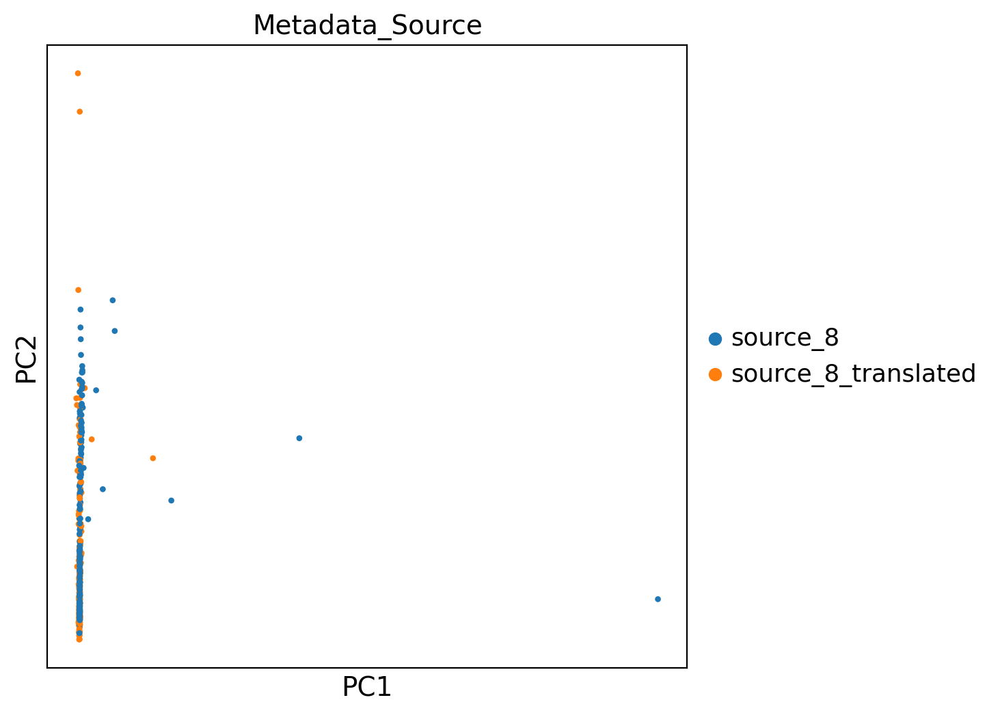

In [ ]:
#list to staore adata
translated_sources = []

# Iterate over unique sources in Metadata_Source -> skip source_2
for source in target2_moa.obs["Metadata_Source"].unique():
    if source == "source_2":
        continue

    # Create dataloader for the current source
    dataloader = create_dataloader(target2_moa, source, batch_size=512, use_pca=True)

    # Load the model
    load_ot_cfm_model(ot_cfm_model, ot_cfm_optimizer, f"{savedir}/run_6_ot_cfm_single_cell_{source}_to_source_2.pt")

    # Perform translation for the current source
    translated_source_adata = transport(dataloader, ot_cfm_model, x1_label=source, device="cpu", save_adata_path=None)

    # Append to the list of translated sources
    translated_sources.append(translated_source_adata)

    # Plot PCA after transporting each source
    sc.pl.pca(translated_source_adata, color="Metadata_Source")

In [ ]:
all_sources_adata = sc.concat(translated_sources, axis=0)
print(all_sources_adata.shape)

(93624, 50)


In [ ]:
# Extract data corresponding to source_2 from target2_moa
source_2_data = target2_moa[target2_moa.obs["Metadata_Source"] == "source_2"].copy()
source_2_data.obsm["X_pca"].shape

# Save translated source as a separate Adata
translated_source_adata = sc.concat([all_sources_adata, source_2_data], join="outer")
translated_source_adata.obsm["X_pca"] = np.concatenate((all_sources_adata.obsm["X_pca"], source_2_data.obsm["X_pca"]), axis=0)

all_sources_adata = translated_source_adata
print(all_sources_adata.shape)
all_sources_adata.obs

(101280, 641)


,Metadata_Source,Metadata_moa,Metadata_JCP2022,Metadata_Microscope_Name,Metadata_Plate,Metadata_Well,Metadata_Batch,Metadata_InChIKey,Metadata_InChI,Metadata_InChIKey_standardized,...,Metadata_disease_area,Metadata_indication,Metadata_Widefield_vs_Confocal,Metadata_Excitation_Type,Metadata_Objective_NA,Metadata_N_Brightfield_Planes_Min,Metadata_N_Brightfield_Planes_Max,Metadata_Distance_Between_Z_Microns,Metadata_Sites_Per_Well,Metadata_Filter_Configuration
0,source_10_translated,acetylcholine receptor antagonist,JCP2022_033012,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,source_10_translated,DNA polymerase inhibitor,JCP2022_011759,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,source_10_translated,tubulin polymerization inhibitor,JCP2022_077096,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
source_2__1086293911__P20,source_2,calcium channel blocker,JCP2022_032357,CV8000,1086293911,P20,20210719_Batch_6,HSUGRBWQSSZJOP-UHFFFAOYSA-N,InChI=1S/C22H26N2O4S/c1-15(25)28-20-21(16-9-11...,HSUGRBWQSSZJOP-UHFFFAOYSA-N,...,cardiology,hypertension|angina pectoris,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P21,source_2,Bruton's tyrosine kinase (BTK) inhibitor,JCP2022_047545,CV8000,1086293911,P21,20210719_Batch_6,KXBDTLQSDKGAEB-UHFFFAOYSA-N,InChI=1S/C22H22FN5O3/c1-3-20(29)25-16-5-4-6-17...,KXBDTLQSDKGAEB-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P22,source_2,cyclooxygenase inhibitor,JCP2022_043099,CV8000,1086293911,P22,20210719_Batch_6,JZFPYUNJRRFVQU-UHFFFAOYSA-N,"InChI=1S/C13H9F3N2O2/c14-13(15,16)8-3-1-4-9(7-...",JZFPYUNJRRFVQU-UHFFFAOYSA-N,...,rheumatology|neurology/psychiatry,joint pain|muscle pain,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P23,source_2,growth factor receptor inhibitor,JCP2022_050516,CV8000,1086293911,P23,20210719_Batch_6,LNFZRMDSZJCZTG-UHFFFAOYSA-N,InChI=1S/C28H21F4N5O2/c1-15-4-6-19(35-27(39)37...,LNFZRMDSZJCZTG-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A


In [ ]:
all_sources_adata.obs.Metadata_Source.value_counts()

source_3_translated     9599
source_3                9599
source_5                9214
source_5_translated     9214
source_4                8442
source_4_translated     8442
source_6                8064
source_6_translated     8064
source_2                3828
source_7_translated     2688
source_7                2688
source_11               2684
source_11_translated    2684
source_10               2302
source_10_translated    2302
source_13               2283
source_13_translated    2283
source_8                1536
source_8_translated     1536
Name: Metadata_Source, dtype: int64

In [ ]:
all_sources_adata = sc.read_h5ad('./run_6_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')

In [ ]:
all_sources_adata.obs

,Metadata_Source,Metadata_moa,Metadata_JCP2022,Metadata_Microscope_Name,Metadata_Plate,Metadata_Well,Metadata_Batch,Metadata_InChIKey,Metadata_InChI,Metadata_InChIKey_standardized,...,Metadata_disease_area,Metadata_indication,Metadata_Widefield_vs_Confocal,Metadata_Excitation_Type,Metadata_Objective_NA,Metadata_N_Brightfield_Planes_Min,Metadata_N_Brightfield_Planes_Max,Metadata_Distance_Between_Z_Microns,Metadata_Sites_Per_Well,Metadata_Filter_Configuration
0,source_10_translated,acetylcholine receptor antagonist,JCP2022_033012,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,source_10_translated,DNA polymerase inhibitor,JCP2022_011759,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,source_10_translated,tubulin polymerization inhibitor,JCP2022_077096,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,source_10_translated,control vehicle,JCP2022_033924,CV8000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
source_2__1086293911__P20,source_2,calcium channel blocker,JCP2022_032357,CV8000,1086293911,P20,20210719_Batch_6,HSUGRBWQSSZJOP-UHFFFAOYSA-N,InChI=1S/C22H26N2O4S/c1-15(25)28-20-21(16-9-11...,HSUGRBWQSSZJOP-UHFFFAOYSA-N,...,cardiology,hypertension|angina pectoris,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P21,source_2,Bruton's tyrosine kinase (BTK) inhibitor,JCP2022_047545,CV8000,1086293911,P21,20210719_Batch_6,KXBDTLQSDKGAEB-UHFFFAOYSA-N,InChI=1S/C22H22FN5O3/c1-3-20(29)25-16-5-4-6-17...,KXBDTLQSDKGAEB-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P22,source_2,cyclooxygenase inhibitor,JCP2022_043099,CV8000,1086293911,P22,20210719_Batch_6,JZFPYUNJRRFVQU-UHFFFAOYSA-N,"InChI=1S/C13H9F3N2O2/c14-13(15,16)8-3-1-4-9(7-...",JZFPYUNJRRFVQU-UHFFFAOYSA-N,...,rheumatology|neurology/psychiatry,joint pain|muscle pain,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A
source_2__1086293911__P23,source_2,growth factor receptor inhibitor,JCP2022_050516,CV8000,1086293911,P23,20210719_Batch_6,LNFZRMDSZJCZTG-UHFFFAOYSA-N,InChI=1S/C28H21F4N5O2/c1-15-4-6-19(35-27(39)37...,LNFZRMDSZJCZTG-UHFFFAOYSA-N,...,NaN,NaN,Confocal,Laser,1.0,3.0,3.0,8.0,6.0,A


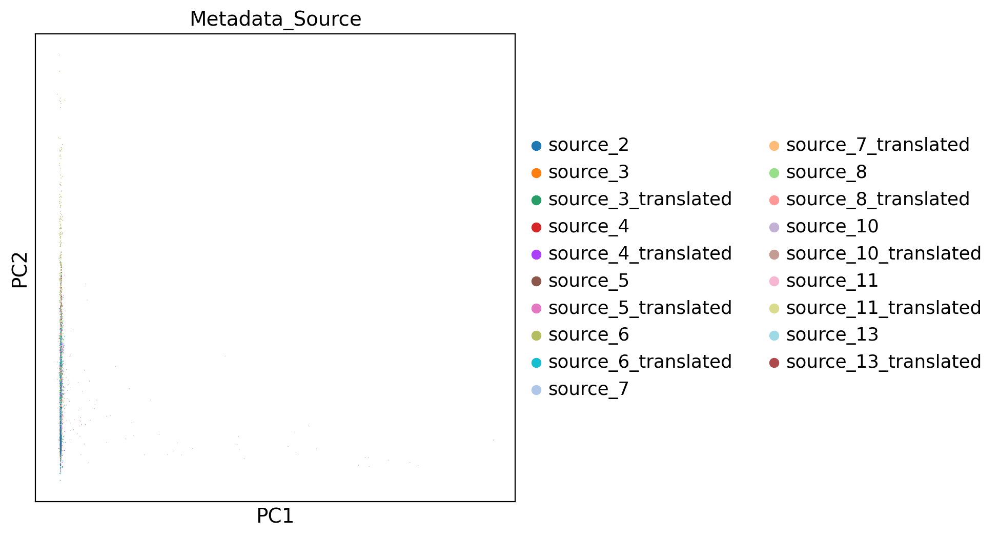

In [ ]:
# Plot PCA with all transported sources
sc.pl.pca(all_sources_adata, color="Metadata_Source")

In [ ]:
#subset all_sources_adata to only contain translated_sources and source2 and plot UMAP showing Metadata_Source again
selected_sources = ['source_2', 'source_3_translated', 'source_4_translated', 'source_5_translated', 'source_6_translated', 'source_7_translated', 'source_8_translated', 'source_10_translated', 'source_11_translated', 'source_13_translated']
subset_adata = all_sources_adata[all_sources_adata.obs['Metadata_Source'].isin(selected_sources)].copy()

# UMAP for the subsetted adata
sc.pp.neighbors(subset_adata, use_rep="X_pca")
sc.tl.umap(subset_adata)

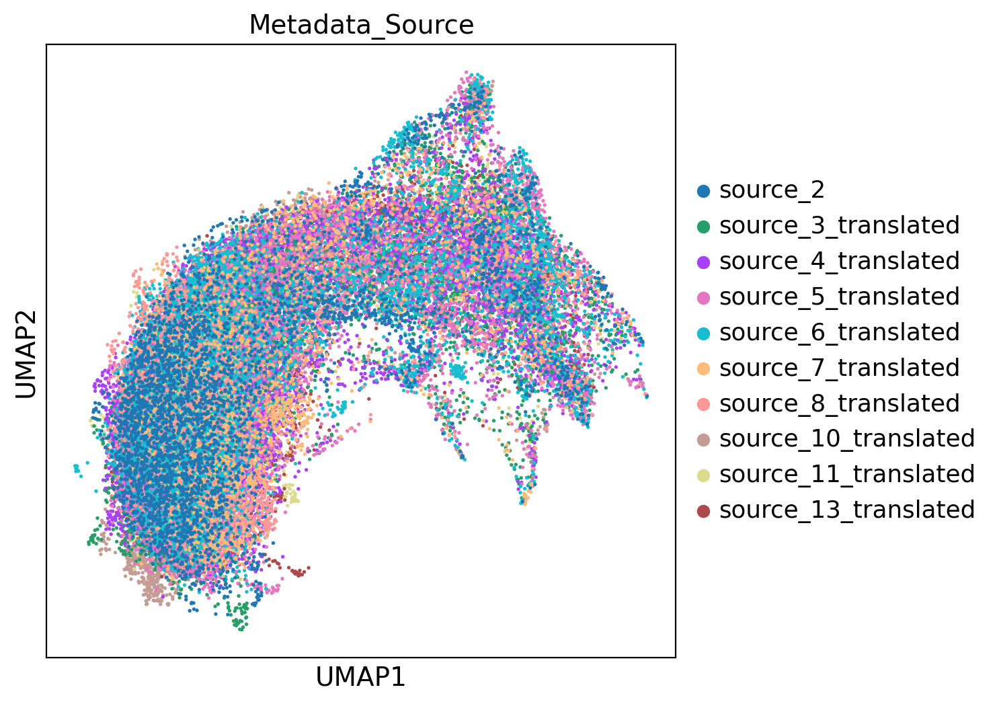

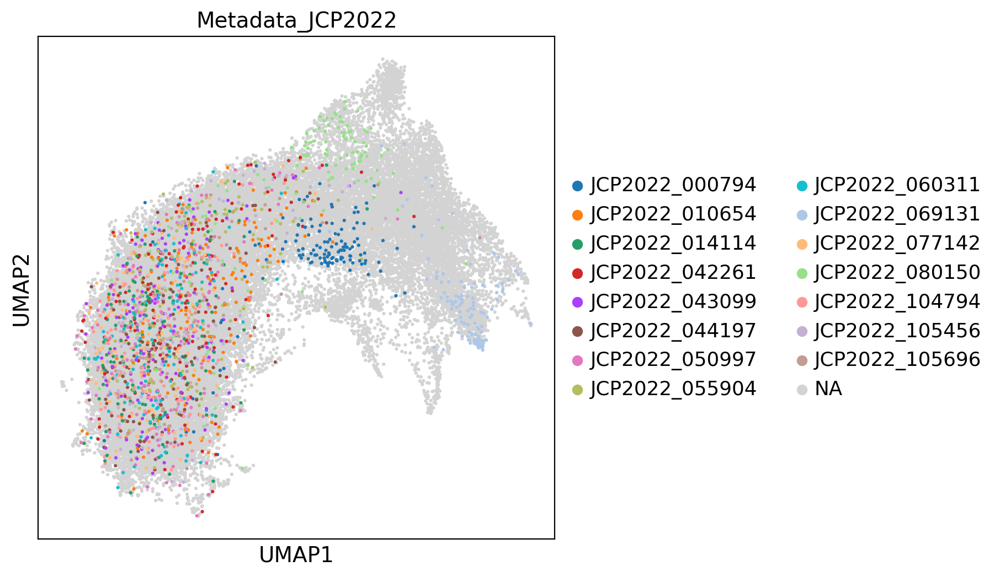

In [ ]:
#Plot Metadata_source
sc.pl.umap(subset_adata, color="Metadata_Source", s = 15)

# Convert Metadata_JCP2022 to category type
subset_adata.obs["Metadata_JCP2022"] = subset_adata.obs["Metadata_JCP2022"].astype("category")

# Randomly sample a smaller set of categories
jcp_examples = random.sample(subset_adata.obs["Metadata_JCP2022"].unique().tolist(), 15)

# Assign none to categories not in the random sample to be grey
subset_adata.obs["Metadata_JCP2022"] = [jcp if jcp in jcp_examples else None for jcp in subset_adata.obs["Metadata_JCP2022"].values]

# Plot UMAP with Metadata_JCP2022 as color
sc.pl.umap(subset_adata, color="Metadata_JCP2022", s = 20)

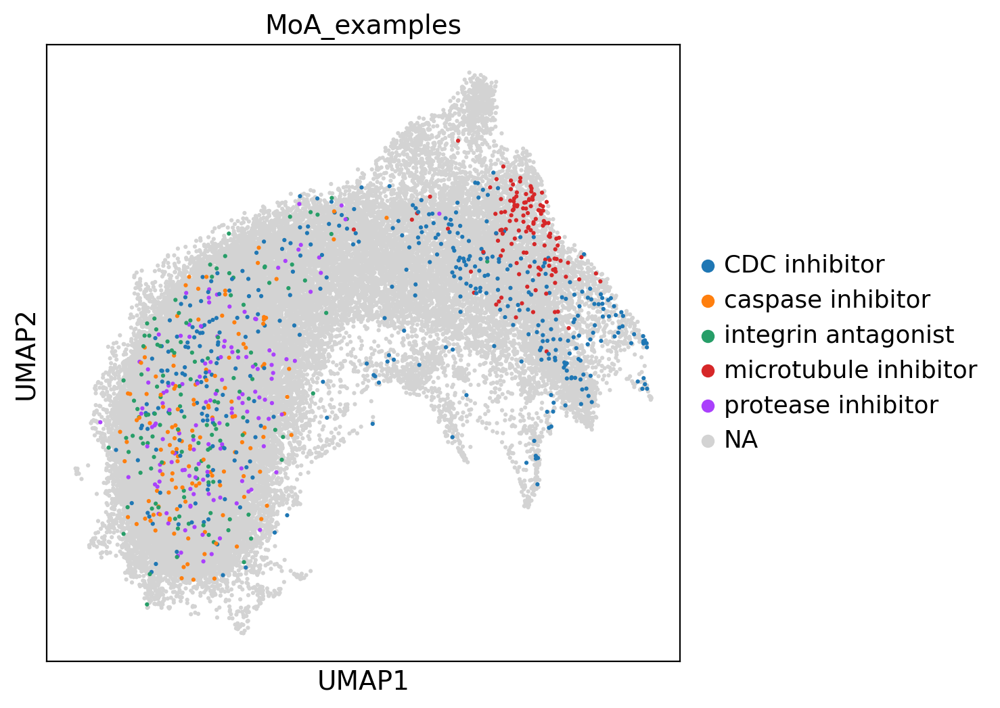

In [ ]:
moa_examples = ["CDC inhibitor", "caspase inhibitor", "integrin antagonist", "microtubule inhibitor", "protease inhibitor"]
subset_adata.obs["MoA_examples"] = [moa if moa in moa_examples else None for moa in subset_adata.obs.Metadata_moa]
subset_adata.obs["MoA_examples"] = s2ubset_adata.obs["MoA_examples"].astype("category")
sc.pl.umap(subset_adata, color="MoA_examples", s=20)

In [ ]:
#Save the resulting adata to file
all_sources_adata.write('./run_6_final_adata_target2_moa_reconstructed_all_sources_OT_CFM.h5ad')